#1. Using All Features

##Data Loading

In [1]:
#Connect to GDrive to load the dataset
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [2]:
#Specify file path and load it into a DataFrame
import pandas as pd
data=pd.read_excel('/content/drive/My Drive/Colab Notebooks/Research Project/Research Project Dataset.xlsx')
df=pd.DataFrame(data)

##Data Pre-processing

Ensuring Reproducibility

In [3]:
# Import libraries
import random
import numpy as np

#Set seed value
random.seed(42)
np.random.seed(42)

Visualising the dataset and its dimensions

In [ ]:
# Visualise the dataset
df.head(140)

,Nr,Sex,Age,Fatigue,General weakness,Pain,Focal symptoms,Cranial Nerve Symptoms,CN3,CN4,...,Pathological CSF,Increased protein,Increased protein (g/l),Pleocytosis,Pleocytosis (cells/ml),OCB + in CSF,IgG levels in CSF,VEP +,BAEP +,MS
0,2,0,56,0,0,0,1,1,0,0,...,1,0,0.37,0,4,0,,0,0,0
1,3,0,47,0,0,1,1,0,0,0,...,0,0,0.28,0,0,0,22.9,0,1,0
2,4,0,43,0,0,1,1,1,0,0,...,0,0,0.38,0,2,,25.3,1,0,0
3,5,0,39,0,0,1,0,0,0,0,...,0,,,0,1,0,,,,0
4,6,0,61,0,0,1,1,0,0,0,...,1,1,0.57,0,0,1,,1,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
133,165,0,65,0,0,0,1,0,0,0,...,,,NaN,,NaN,,,1,0,0
134,166,1,61,0,0,0,0,1,1,0,...,1,1,0.96,1,6,0,117,,,0
135,167,0,28,0,1,1,0,0,0,0,...,0,0,0.23,0,4,,,0,,1
136,169,0,22,0,0,0,1,0,0,0,...,0,0,0.16,0,4,1,14.9,0,0,1


In [ ]:
# Number of observations and features in the dataset
print(df.shape)

(138, 44)


Dropping columns not needed for the analysis

In [4]:
# Remove unnecessary columns
df = df.drop(['Nr', 'Increased protein (g/l)', 'Pleocytosis (cells/ml)', 'Sum of symptoms'], axis=1)

Converting the data type for use by the model

In [5]:
# Convert all columns to numeric data types
df = df.apply(pd.to_numeric, errors='coerce')

# Check the data types of columns
print(df.dtypes)

Sex                                           int64
Age                                           int64
Fatigue                                       int64
General weakness                              int64
Pain                                          int64
Focal symptoms                                int64
Cranial Nerve Symptoms                        int64
CN3                                           int64
CN4                                           int64
CN5                                           int64
CN6                                           int64
CN8                                           int64
Pathological reflexes                         int64
Babinski's                                    int64
Rossolimo                                     int64
Muscle strength                               int64
Reflex asymmetry                              int64
Muscle tone abnormalities                     int64
Proprioception                              float64
Superficial 

Impute missing data

In [6]:
#Install library for imputation
!pip install impyute

In [7]:
#import library for Multiple Imputation by Chained Equations (MICE)
from impyute.imputation.cs import mice

# impute missing values using MICE
imputed_data = mice(df.values)

# convert imputed data back to a pandas DataFrame
imputed_df = pd.DataFrame(imputed_data, columns=df.columns)

Visualising correlation and multicollinearity as a correlation matrix, heatmap and Seaborn plots

In [ ]:
#Plotting a correlation matrix
print("Correlation Matrix")
imputed_df.corr()

Correlation Matrix


,Sex,Age,Fatigue,General weakness,Pain,Focal symptoms,Cranial Nerve Symptoms,CN3,CN4,CN5,...,Juxtacortical,MRI spinal lesions,Pathological CSF,Increased protein,Pleocytosis,OCB + in CSF,IgG levels in CSF,VEP +,BAEP +,MS
Sex,1.000000e+00,0.016061,-0.124726,-0.186682,-0.143824,0.013304,0.113312,0.091287,0.116754,0.153485,...,-0.124258,0.117442,0.256159,0.278291,0.166620,-0.063964,0.117360,-0.043531,-0.011385,0.149906
Age,1.606093e-02,1.000000,-0.018888,0.040808,0.069197,0.132232,0.028693,0.071353,-0.013823,0.148812,...,0.194098,-0.224160,0.043598,0.308322,0.055476,-0.115866,0.246406,0.229738,0.134672,-0.068102
Fatigue,-1.247262e-01,-0.018888,1.000000,0.239192,0.033463,0.061810,0.028266,-0.079701,-0.086645,0.095718,...,0.254364,-0.241124,-0.029798,-0.111382,-0.068132,-0.039067,-0.030295,0.031995,0.044666,-0.093820
General weakness,-1.866822e-01,0.040808,0.239192,1.000000,0.084867,-0.091215,-0.034265,-0.130136,-0.077672,0.019350,...,0.172669,-0.204313,-0.002075,0.061167,-0.045524,0.022591,-0.085118,-0.204259,0.027302,0.001454
Pain,-1.438243e-01,0.069197,0.033463,0.084867,1.000000,-0.008537,-0.021425,-0.074736,-0.155520,0.167866,...,0.062533,-0.139975,-0.040157,0.134558,-0.038100,-0.025400,0.072157,-0.005035,-0.178989,-0.139549
Focal symptoms,1.330380e-02,0.132232,0.061810,-0.091215,-0.008537,1.000000,0.218173,0.014574,0.108729,0.036171,...,-0.133988,0.101753,0.037959,0.019003,0.011279,0.087697,-0.040427,0.220444,0.203431,0.073790
Cranial Nerve Symptoms,1.133118e-01,0.028693,0.028266,-0.034265,-0.021425,0.218173,1.000000,0.349812,0.208787,0.224059,...,0.086896,-0.109319,0.067680,0.061416,0.172958,-0.024822,-0.170976,0.137961,0.049238,0.061327
CN3,9.128709e-02,0.071353,-0.079701,-0.130136,-0.074736,0.014574,0.349812,1.000000,0.596853,-0.096077,...,0.126301,0.061742,-0.056823,0.095822,0.011825,0.038583,0.016986,0.003610,-0.010968,0.072332
CN4,1.167536e-01,-0.013823,-0.086645,-0.077672,-0.155520,0.108729,0.208787,0.596853,1.000000,-0.057344,...,0.013543,0.088680,-0.225631,-0.003715,-0.129000,-0.162587,-0.149552,-0.077386,0.057650,-0.102512
CN5,1.534852e-01,0.148812,0.095718,0.019350,0.167866,0.036171,0.224059,-0.096077,-0.057344,1.000000,...,-0.035239,0.125520,0.079393,0.082367,0.093909,-0.009715,-0.065336,0.016948,-0.030433,0.075129


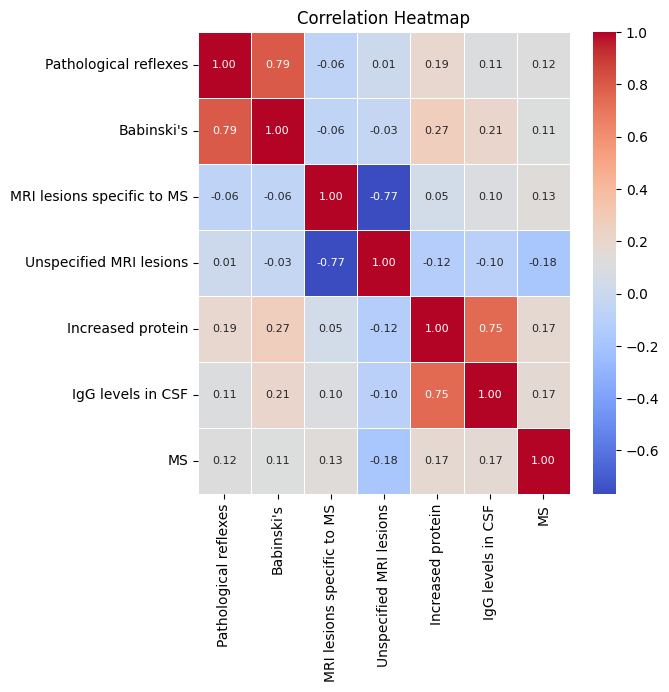

In [16]:
# Import libraries
import seaborn as sns
import matplotlib.pyplot as plt

# Specify the features of interest
features_of_interest = ['Pathological reflexes',"Babinski's",
                        'MRI lesions specific to MS','Unspecified MRI lesions',
                        'Increased protein','IgG levels in CSF', 'MS']

# Select the subset of the correlation matrix
subset_corr_matrix = imputed_df[features_of_interest].corr()

# Plotting a heatmap
plt.figure(figsize=(6, 6))
sns.heatmap(subset_corr_matrix, annot=True, cmap='coolwarm', fmt=".2f", linewidths=0.5, annot_kws={"size": 8})
plt.title("Correlation Heatmap")
plt.show()


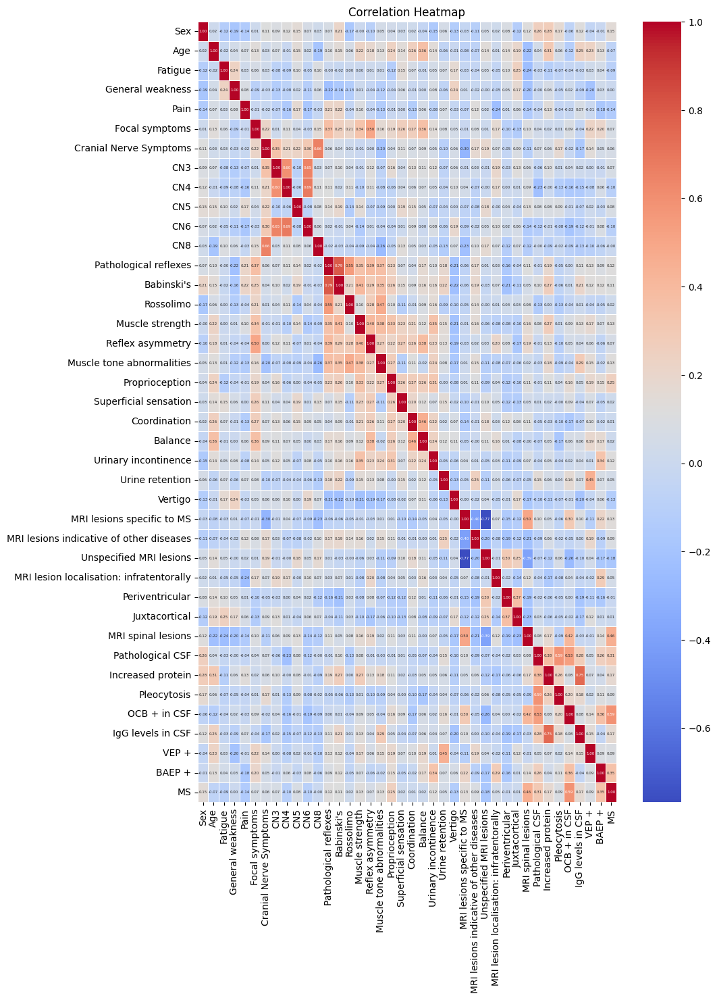

In [ ]:
#Visualise correlation and multicollinearity as a heatmap

#Import libraries
import seaborn as sns
import matplotlib.pyplot as plt

# Computing the correlation matrix
corr_matrix = imputed_df.corr()

# Plotting a heatmap
plt.figure(figsize=(10, 15))
sns.heatmap(corr_matrix, annot=True, cmap='coolwarm', fmt=".2f", linewidths=0.5, annot_kws={"size": 4})
plt.title("Correlation Heatmap")
plt.show()

In [ ]:
#Visualise pairwise correlation as Seaborn plots
import seaborn as sns
sns.pairplot(imputed_df)

In [ ]:
# Print features with multicollinearity
highly_correlated_features = []
abs_corr_matrix = corr_matrix.abs()
for i in range(len(abs_corr_matrix.columns)):
    for j in range(i+1, len(abs_corr_matrix.columns)):
        if abs_corr_matrix.iloc[i, j] > 0.7:
            feature_i = abs_corr_matrix.columns[i]
            feature_j = abs_corr_matrix.columns[j]
            highly_correlated_features.append((feature_i, feature_j))

if len(highly_correlated_features) == 0:
    print("No Multicollinearity Observed")
else:
    print("Features with multicollinearity (absolute correlation coefficient > 0.7):")
    for feature_i, feature_j in highly_correlated_features:
        print(f"{feature_i} - {feature_j}")

Features with multicollinearity (absolute correlation coefficient > 0.7):
Pathological reflexes - Babinski's
MRI lesions specific to MS - Unspecified MRI lesions
Increased protein - IgG levels in CSF


Specify features and target variable

In [ ]:
#Specify x and y
x = imputed_df.drop('MS', axis=1)
y = imputed_df['MS']

#Print dimensions
print(x.shape)
print(y.shape)

(138, 39)
(138,)


Checking for imbalanced classes in the dataset

0.0    64.492754
1.0    35.507246
Name: MS, dtype: float64


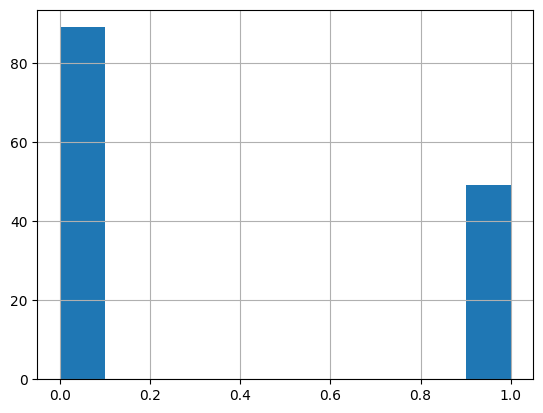

The baseline accuracy is: 0.644927536231884


In [ ]:
#Check if dataset is imbalanced
print(y.value_counts() * 100.0 / len(y))

#Visualise dataset imbalance
import matplotlib.pyplot as plt
y.hist()
plt.show()

#Find baseline accuracy
from sklearn.dummy import DummyClassifier

clf = DummyClassifier(strategy = 'most_frequent')
clf.fit(x, y)
baseline_accuracy=clf.score(x, y)
print("The baseline accuracy is:", baseline_accuracy)

##Data Splitting

Split data into train and test sets

In [ ]:
#Import train_test_split function
from sklearn.model_selection import train_test_split

# Split data into train and test sets with stratification to resolve class imbalances
x_train, x_test, y_train, y_test = train_test_split(x, y, test_size=0.2, random_state=1, stratify=y, shuffle=True)

# Print dimensions
print('x_train:', x_train.shape)
print('x_test:', x_test.shape)
print('y_train:', y_train.shape)
print('y_test:', y_test.shape)

x_train: (110, 39)
x_test: (28, 39)
y_train: (110,)
y_test: (28,)


##Importing Libraries for Following Steps

In [ ]:
# Import libraries
from sklearn.metrics import f1_score
import warnings
from sklearn.exceptions import ConvergenceWarning
import numpy as np
from sklearn.model_selection import StratifiedKFold
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import GridSearchCV

# Ignore convergence warnings
warnings.filterwarnings("ignore", category=ConvergenceWarning)

##Hyperparameter tuning

In [ ]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import GridSearchCV

# Define parameters to tune for Random Forest Classifier
rf_param_grid = {
    'n_estimators': [100, 200, 300],
    'criterion': ['gini', 'entropy'],
    'max_depth': [None, 5, 10, 15],
    'min_samples_split': [2, 5, 10],
    'min_samples_leaf': [1, 2, 4],
    'class_weight': [None, 'balanced'],
    'random_state': [None, 42]
}


##Stratified K-Fold Cross Validation:

In [ ]:
# Creating an instance of StratifiedKFold
rf_skfold = StratifiedKFold(n_splits=5, shuffle=True, random_state=1)

##Training and Model Validation:



In [ ]:
# Creating lists to store evaluation metrics for each fold
train_f1_scores = []
val_f1_scores = []

# Iterating over each fold
for train_index, val_index in rf_skfold.split(x_train, y_train):
    x_train_fold, x_val_fold = x_train.iloc[train_index], x_train.iloc[val_index]
    y_train_fold, y_val_fold = y_train.iloc[train_index], y_train.iloc[val_index]

    # Create an instance of Random Forest model
    rf = RandomForestClassifier(random_state=1)

    # Create an instance of GridSearchCV for Random Forest Classifier
    rf_cv = GridSearchCV(rf, rf_param_grid, cv=rf_skfold)

    # Fit GridSearchCV on the training fold
    rf_cv.fit(x_train_fold, y_train_fold)

    # Get the best estimator from GridSearchCV
    best_rf_model = rf_cv.best_estimator_

    # Print best parameters and F1 score
    print("Best Parameters:", rf_cv.best_params_)
    print("F1 Score:", rf_cv.best_score_)

    # Fitting the best estimator on the training fold and making predictions
    y_train_pred = best_rf_model.predict(x_train_fold)

    # Calculating F1 score for the train set
    train_f1 = f1_score(y_train_fold, y_train_pred)

    # Appending train F1 score to the list
    train_f1_scores.append(train_f1)

    # Making predictions for the validation fold
    y_val_pred = best_rf_model.predict(x_val_fold)

    # Calculating F1 score for the validation set
    val_f1 = f1_score(y_val_fold, y_val_pred)

    # Appending validation F1 score to the list
    val_f1_scores.append(val_f1)


Best Parameters: {'class_weight': None, 'criterion': 'gini', 'max_depth': 10, 'min_samples_leaf': 1, 'min_samples_split': 10, 'n_estimators': 300, 'random_state': None}
F1 Score: 0.884967320261438
Best Parameters: {'class_weight': None, 'criterion': 'gini', 'max_depth': 5, 'min_samples_leaf': 1, 'min_samples_split': 5, 'n_estimators': 300, 'random_state': 42}
F1 Score: 0.8535947712418303
Best Parameters: {'class_weight': None, 'criterion': 'entropy', 'max_depth': 5, 'min_samples_leaf': 1, 'min_samples_split': 5, 'n_estimators': 100, 'random_state': 42}
F1 Score: 0.8398692810457516
Best Parameters: {'class_weight': None, 'criterion': 'gini', 'max_depth': 5, 'min_samples_leaf': 4, 'min_samples_split': 10, 'n_estimators': 100, 'random_state': None}
F1 Score: 0.8411764705882353
Best Parameters: {'class_weight': 'balanced', 'criterion': 'entropy', 'max_depth': 15, 'min_samples_leaf': 1, 'min_samples_split': 2, 'n_estimators': 100, 'random_state': None}
F1 Score: 0.8405228758169935


##Average F1 Scores and Standard Deviation:

In [ ]:
# Calculating the average and standard deviation of F1 scores for train and validation sets
avg_train_f1 = np.mean(train_f1_scores)
std_train_f1 = np.std(train_f1_scores)
avg_val_f1 = np.mean(val_f1_scores)
std_val_f1 = np.std(val_f1_scores)

# Print the average and standard deviation for train and validation F1 scores
print("Average Train F1 Score:", avg_train_f1)
print("Standard Deviation of Train F1 Score:", std_train_f1)
print("Average Validation F1 Score:", avg_val_f1)
print("Standard Deviation of Validation F1 Score:", std_val_f1)


Average Train F1 Score: 0.931419309596581
Standard Deviation of Train F1 Score: 0.048791776394766326
Average Validation F1 Score: 0.7033116883116882
Standard Deviation of Validation F1 Score: 0.16218387520846625


##Model Predictions on Train and Test Sets:

In [ ]:
# Make predictions on the train set using best model
best_model = rf_cv.best_estimator_
y_train_pred = best_model.predict(x_train)

# Make predictions on the test set using best model
best_model = rf_cv.best_estimator_
y_test_pred = best_model.predict(x_test)

##Visualise Various Classification Metrics

In [ ]:
#Print Classification Report
from sklearn.metrics import classification_report
print("Classification Report of Train Data:")
print(classification_report(y_train, y_train_pred))

print()

print("Classification Report of Test Data: ")
print(classification_report(y_test, y_test_pred))


Classification Report of Train Data:
              precision    recall  f1-score   support

         0.0       0.96      1.00      0.98        71
         1.0       1.00      0.92      0.96        39

    accuracy                           0.97       110
   macro avg       0.98      0.96      0.97       110
weighted avg       0.97      0.97      0.97       110


Classification Report of Test Data: 
              precision    recall  f1-score   support

         0.0       0.84      0.89      0.86        18
         1.0       0.78      0.70      0.74        10

    accuracy                           0.82        28
   macro avg       0.81      0.79      0.80        28
weighted avg       0.82      0.82      0.82        28



Text(0.5, 1.0, 'Confusion Matrix of Test Data')

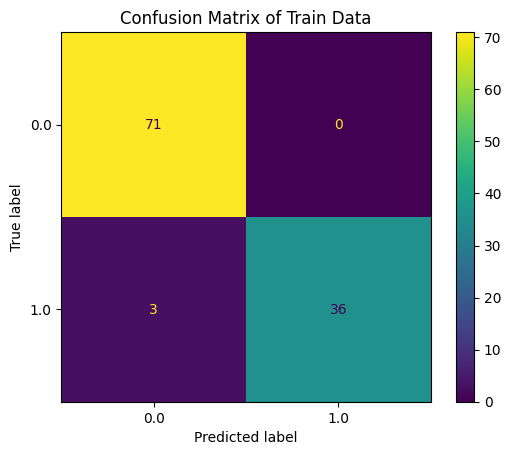

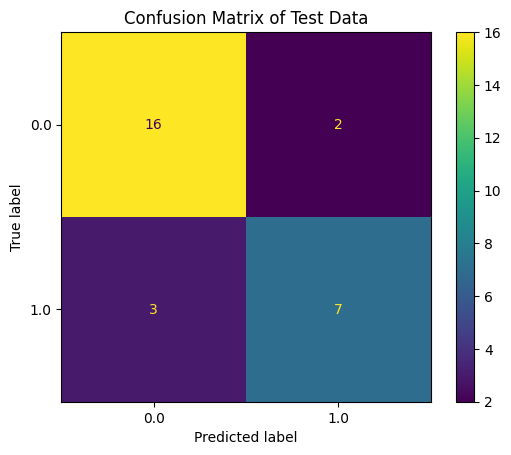

In [ ]:
#Plot Confusion Matrix for Train and Test Data
from sklearn.metrics import ConfusionMatrixDisplay
import matplotlib.pyplot as plt

#Confusion Matrix of Train Data
ConfusionMatrixDisplay.from_predictions(y_train, y_train_pred)
plt.title('Confusion Matrix of Train Data')

#Confusion Matrix of Test Data
ConfusionMatrixDisplay.from_predictions(y_test, y_test_pred)
plt.title('Confusion Matrix of Test Data')

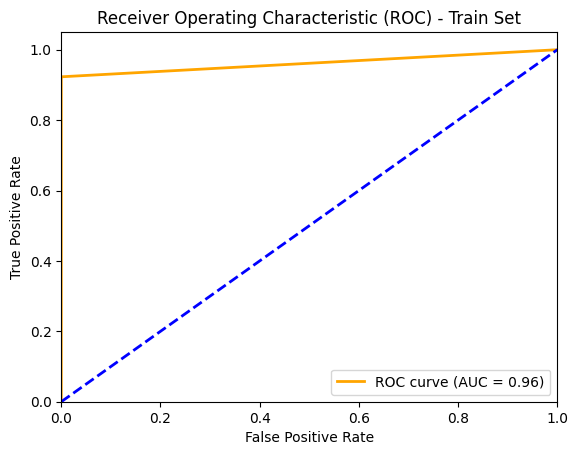

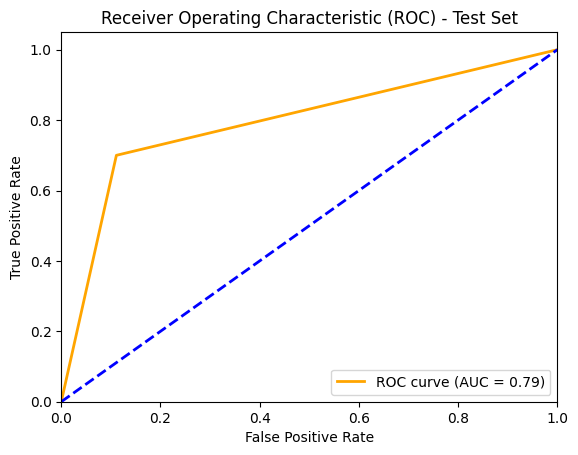

In [ ]:
#Plot ROC Curve for Train and Test Data
import matplotlib.pyplot as plt
from sklearn.metrics import roc_curve
from sklearn.metrics import auc

# Map actual "YES" and "NO" values to 1 and 0 respectively
mapping = {1.0: 1, 0.0: 0}
y_train_mapped = [mapping[val] for val in y_train]
y_test_mapped = [mapping[val] for val in y_test]

# Map predicted "YES" and "NO" values to 1 and 0 respectively
y_train_pred_mapped = [mapping[val] for val in y_train_pred]
y_test_pred_mapped = [mapping[val] for val in y_test_pred]

# ROC curve and AUC for train data
fpr_train, tpr_train, thresholds_train = roc_curve(y_train_mapped, y_train_pred_mapped)
roc_auc_train = auc(fpr_train, tpr_train)

# ROC curve and AUC for test data
fpr_test, tpr_test, thresholds_test = roc_curve(y_test_mapped, y_test_pred_mapped)
roc_auc_test = auc(fpr_test, tpr_test)

# Plot ROC curve for train data
plt.figure()
plt.plot(fpr_train, tpr_train, color='orange', lw=2, label='ROC curve (AUC = %0.2f)' % roc_auc_train)
plt.plot([0, 1], [0, 1], color='blue', lw=2, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) - Train Set')
plt.legend(loc="lower right")

# Plot ROC curve for test data
plt.figure()
plt.plot(fpr_test, tpr_test, color='orange', lw=2, label='ROC curve (AUC = %0.2f)' % roc_auc_test)
plt.plot([0, 1], [0, 1], color='blue', lw=2, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) - Test Set')
plt.legend(loc="lower right")

plt.show()

##Calculate Feature Importance Scores

Sex: 0.02735
Age: 0.05773
Fatigue: 0.01324
General weakness: 0.00558
Pain: 0.01696
Focal symptoms: 0.00641
Cranial Nerve Symptoms: 0.01639
CN3: 0.01089
CN4: 0.00419
CN5: 0.00499
CN6: 0.00873
CN8: 0.01375
Pathological reflexes: 0.00650
Babinski's: 0.01265
Rossolimo: 0.01765
Muscle strength: 0.02243
Reflex asymmetry: 0.00877
Muscle tone abnormalities: 0.01788
Proprioception: 0.01636
Superficial sensation: 0.01109
Coordination: 0.01848
Balance: 0.01434
Urinary incontinence: 0.00951
Urine retention: 0.00428
Vertigo: 0.00952
MRI lesions specific to MS: 0.01464
MRI lesions indicative of other diseases: 0.01788
Unspecified MRI lesions: 0.01050
MRI infratentorial lesions: 0.02998
Periventricular: 0.01868
Juxtacortical: 0.02362
MRI spinal lesions: 0.13564
Pathological CSF: 0.04282
Increased protein: 0.02772
Pleocytosis: 0.02256
OCB + in CSF: 0.11682
IgG levels in CSF: 0.09197
VEP +: 0.03160
BAEP +: 0.05993


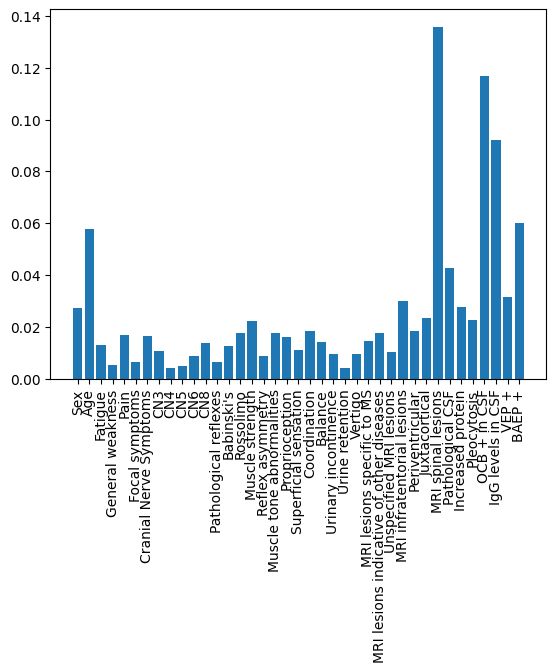

In [ ]:
importance = best_model.feature_importances_

#Summarise feature importance
for i, v in enumerate(importance):
    print('%s: %.5f' % (x_train.columns[i], v))

# Get feature names
feature_names = list(x_train.columns)

# Plot feature importances
plt.bar(feature_names, importance)
plt.xticks(rotation=90)
plt.show()



#2. Using All Except Multicollinear Features

##Data Loading

In [ ]:
#Connect to GDrive to load the dataset
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
#Specify file path and load it into a DataFrame
import pandas as pd
data=pd.read_excel('/content/drive/My Drive/Colab Notebooks/Research Project/Research Project Dataset.xlsx')
df=pd.DataFrame(data)

##Data Pre-processing

Ensuring Reproducibility

In [ ]:
# Import libraries
import random
import numpy as np

#Set seed value
random.seed(42)
np.random.seed(42)

Visualising the dataset and its dimensions

In [ ]:
# Visualise the dataset
df.head(140)

,Nr,Sex,Age,Fatigue,General weakness,Pain,Focal symptoms,Cranial Nerve Symptoms,CN3,CN4,...,Pathological CSF,Increased protein,Increased protein (g/l),Pleocytosis,Pleocytosis (cells/ml),OCB + in CSF,IgG levels in CSF,VEP +,BAEP +,MS
0,2,0,56,0,0,0,1,1,0,0,...,1,0,0.37,0,4,0,,0,0,0
1,3,0,47,0,0,1,1,0,0,0,...,0,0,0.28,0,0,0,22.9,0,1,0
2,4,0,43,0,0,1,1,1,0,0,...,0,0,0.38,0,2,,25.3,1,0,0
3,5,0,39,0,0,1,0,0,0,0,...,0,,,0,1,0,,,,0
4,6,0,61,0,0,1,1,0,0,0,...,1,1,0.57,0,0,1,,1,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
133,165,0,65,0,0,0,1,0,0,0,...,,,NaN,,NaN,,,1,0,0
134,166,1,61,0,0,0,0,1,1,0,...,1,1,0.96,1,6,0,117,,,0
135,167,0,28,0,1,1,0,0,0,0,...,0,0,0.23,0,4,,,0,,1
136,169,0,22,0,0,0,1,0,0,0,...,0,0,0.16,0,4,1,14.9,0,0,1


In [ ]:
# Number of observations and features in the dataset
print(df.shape)

(138, 44)


Dropping columns not needed for the analysis

In [ ]:
# Remove unnecessary columns
df = df.drop(['Nr', 'Increased protein (g/l)', 'Pleocytosis (cells/ml)', 'Sum of symptoms'], axis=1)

Drop features with multicollinearity that also have a low correlation with target variable

In [ ]:
columns_to_drop = ["Babinski's", "Unspecified MRI lesions", "Increased protein"]
df.drop(columns=columns_to_drop, inplace=True)

Converting the data type for use by the model

In [ ]:
# Convert all columns to numeric data types
df = df.apply(pd.to_numeric, errors='coerce')

# Check the data types of columns
print(df.dtypes)

Sex                                           int64
Age                                           int64
Fatigue                                       int64
General weakness                              int64
Pain                                          int64
Focal symptoms                                int64
Cranial Nerve Symptoms                        int64
CN3                                           int64
CN4                                           int64
CN5                                           int64
CN6                                           int64
CN8                                           int64
Pathological reflexes                         int64
Rossolimo                                     int64
Muscle strength                               int64
Reflex asymmetry                              int64
Muscle tone abnormalities                     int64
Proprioception                              float64
Superficial sensation                       float64
Coordination

Impute missing data

In [ ]:
#Install library for imputation
!pip install impyute

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [ ]:
#import library for Multiple Imputation by Chained Equations (MICE)
from impyute.imputation.cs import mice

# impute missing values using MICE
imputed_data = mice(df.values)

# convert imputed data back to a pandas DataFrame
imputed_df = pd.DataFrame(imputed_data, columns=df.columns)

Visualising correlation and multicollinearity as a correlation matrix, heatmap and Seaborn plots

In [ ]:
#Plotting a correlation matrix
print("Correlation Matrix")
imputed_df.corr()

Correlation Matrix


,Sex,Age,Fatigue,General weakness,Pain,Focal symptoms,Cranial Nerve Symptoms,CN3,CN4,CN5,...,Periventricular,Juxtacortical,MRI spinal lesions,Pathological CSF,Pleocytosis,OCB + in CSF,IgG levels in CSF,VEP +,BAEP +,MS
Sex,1.000000e+00,0.016061,-0.124726,-0.186682,-0.143824,0.013304,0.113312,0.091287,0.116754,0.153485,...,0.094542,-0.105958,0.125444,0.243080,0.178173,-0.048138,0.005579,-0.057869,-0.004314,0.149906
Age,1.606093e-02,1.000000,-0.018888,0.040808,0.069197,0.132232,0.028693,0.071353,-0.013823,0.148812,...,0.139244,0.195399,0.085186,0.031809,0.037781,-0.149899,0.240232,0.242817,0.139332,-0.068102
Fatigue,-1.247262e-01,-0.018888,1.000000,0.239192,0.033463,0.061810,0.028266,-0.079701,-0.086645,0.095718,...,0.102698,0.238302,-0.111317,-0.028414,-0.060553,-0.034315,0.023302,0.139524,0.023777,-0.093820
General weakness,-1.866822e-01,0.040808,0.239192,1.000000,0.084867,-0.091215,-0.034265,-0.130136,-0.077672,0.019350,...,0.048775,0.143303,-0.187123,0.001092,-0.034323,0.017347,-0.055048,-0.154771,-0.018543,0.001454
Pain,-1.438243e-01,0.069197,0.033463,0.084867,1.000000,-0.008537,-0.021425,-0.074736,-0.155520,0.167866,...,-0.004080,0.036253,-0.201428,-0.036298,-0.076684,-0.068398,0.122203,-0.057584,-0.133100,-0.139549
Focal symptoms,1.330380e-02,0.132232,0.061810,-0.091215,-0.008537,1.000000,0.218173,0.014574,0.108729,0.036171,...,-0.092496,-0.095371,0.086989,0.044754,-0.005424,0.066171,0.072911,0.265760,0.195272,0.073790
Cranial Nerve Symptoms,1.133118e-01,0.028693,0.028266,-0.034265,-0.021425,0.218173,1.000000,0.349812,0.208787,0.224059,...,-0.052459,0.056558,-0.055059,0.067118,0.149994,-0.077656,-0.041499,0.132557,-0.019921,0.061327
CN3,9.128709e-02,0.071353,-0.079701,-0.130136,-0.074736,0.014574,0.349812,1.000000,0.596853,-0.096077,...,-0.031465,0.106806,0.146362,-0.055679,-0.011778,0.040993,0.108632,0.058525,-0.062796,0.072332
CN4,1.167536e-01,-0.013823,-0.086645,-0.077672,-0.155520,0.108729,0.208787,0.596853,1.000000,-0.057344,...,0.000548,0.003074,0.208747,-0.228508,-0.121118,-0.149523,-0.123336,-0.082771,0.050026,-0.102512
CN5,1.534852e-01,0.148812,0.095718,0.019350,0.167866,0.036171,0.224059,-0.096077,-0.057344,1.000000,...,0.037922,-0.045536,0.165067,0.077212,0.059120,-0.019240,-0.026449,0.063097,-0.017645,0.075129


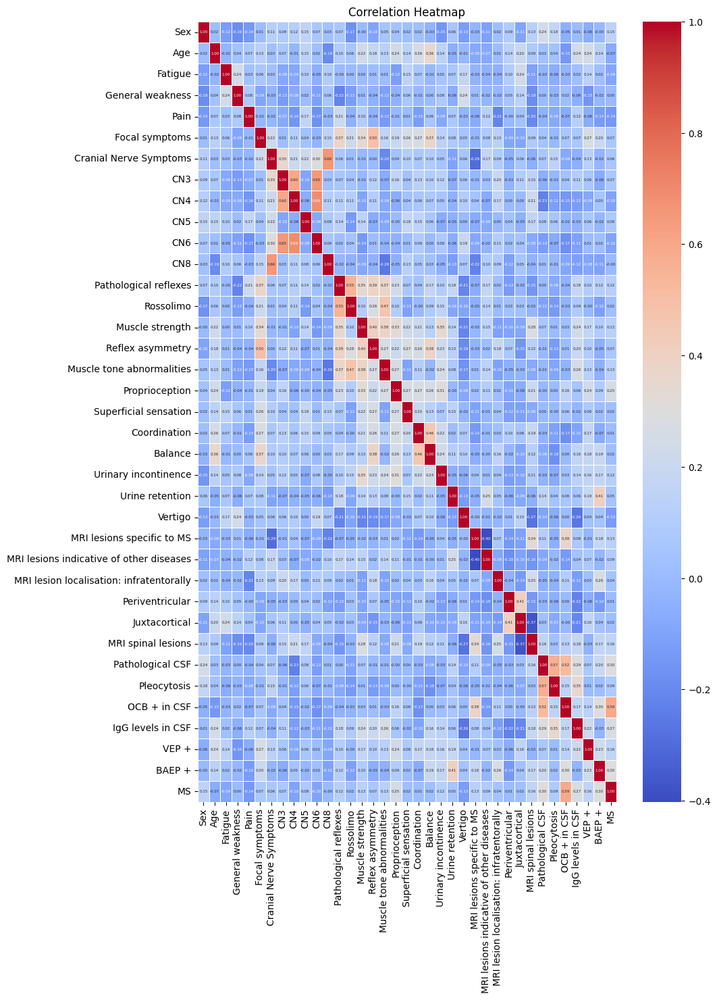

In [ ]:
#Visualise correlation and multicollinearity as a heatmap

#Import libraries
import seaborn as sns
import matplotlib.pyplot as plt

# Computing the correlation matrix
corr_matrix = imputed_df.corr()

# Plotting a heatmap
plt.figure(figsize=(10, 15))
sns.heatmap(corr_matrix, annot=True, cmap='coolwarm', fmt=".2f", linewidths=0.5, annot_kws={"size": 4})
plt.title("Correlation Heatmap")
plt.show()

In [ ]:
#Visualise pairwise correlation as Seaborn plots
import seaborn as sns
sns.pairplot(imputed_df)

In [ ]:
# Print features with multicollinearity
highly_correlated_features = []
abs_corr_matrix = corr_matrix.abs()
for i in range(len(abs_corr_matrix.columns)):
    for j in range(i+1, len(abs_corr_matrix.columns)):
        if abs_corr_matrix.iloc[i, j] > 0.7:
            feature_i = abs_corr_matrix.columns[i]
            feature_j = abs_corr_matrix.columns[j]
            highly_correlated_features.append((feature_i, feature_j))

if len(highly_correlated_features) == 0:
    print("No Multicollinearity Observed")
else:
    print("Features with multicollinearity (absolute correlation coefficient > 0.7):")
    for feature_i, feature_j in highly_correlated_features:
        print(f"{feature_i} - {feature_j}")

No Multicollinearity Observed


Specify features and target variable

In [ ]:
#Specify x and y
x = imputed_df.drop('MS', axis=1)
y = imputed_df['MS']

#Print dimensions
print(x.shape)
print(y.shape)

(138, 36)
(138,)


Checking for imbalanced classes in the dataset

0.0    64.492754
1.0    35.507246
Name: MS, dtype: float64


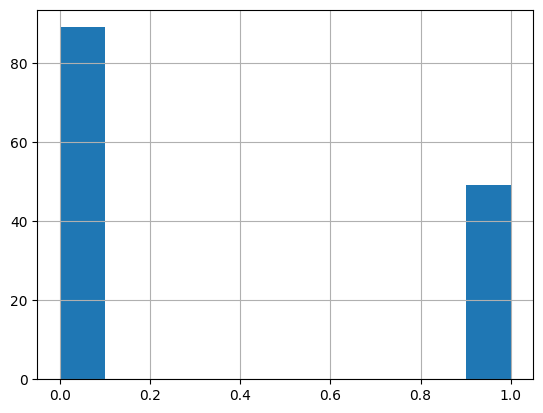

The baseline accuracy is: 0.644927536231884


In [ ]:
#Check if dataset is imbalanced
print(y.value_counts() * 100.0 / len(y))

#Visualise dataset imbalance
import matplotlib.pyplot as plt
y.hist()
plt.show()

#Find baseline accuracy
from sklearn.dummy import DummyClassifier

clf = DummyClassifier(strategy = 'most_frequent')
clf.fit(x, y)
baseline_accuracy=clf.score(x, y)
print("The baseline accuracy is:", baseline_accuracy)

##Data Splitting

Split data into train and test sets

In [ ]:
#Import train_test_split function
from sklearn.model_selection import train_test_split

# Split data into train and test sets with stratification to resolve class imbalances
x_train, x_test, y_train, y_test = train_test_split(x, y, test_size=0.2, random_state=1, stratify=y, shuffle=True)

# Print dimensions
print('x_train:', x_train.shape)
print('x_test:', x_test.shape)
print('y_train:', y_train.shape)
print('y_test:', y_test.shape)

x_train: (110, 36)
x_test: (28, 36)
y_train: (110,)
y_test: (28,)


##Importing Libraries for Following Steps

In [ ]:
# Import libraries
from sklearn.metrics import f1_score
import warnings
from sklearn.exceptions import ConvergenceWarning
import numpy as np
from sklearn.model_selection import StratifiedKFold
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import GridSearchCV

# Ignore convergence warnings
warnings.filterwarnings("ignore", category=ConvergenceWarning)

##Hyperparameter tuning

In [ ]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import GridSearchCV

# Define parameters to tune for Random Forest Classifier
rf_param_grid = {
    'n_estimators': [100, 200, 300],
    'criterion': ['gini', 'entropy'],
    'max_depth': [None, 5, 10, 15],
    'min_samples_split': [2, 5, 10],
    'min_samples_leaf': [1, 2, 4],
    'class_weight': [None, 'balanced'],
    'random_state': [None, 42]
}


##Stratified K-Fold Cross Validation:

In [ ]:
# Creating an instance of StratifiedKFold
rf_skfold = StratifiedKFold(n_splits=5, shuffle=True, random_state=1)

##Training and Model Validation:



In [ ]:
# Creating lists to store evaluation metrics for each fold
train_f1_scores = []
val_f1_scores = []

# Iterating over each fold
for train_index, val_index in rf_skfold.split(x_train, y_train):
    x_train_fold, x_val_fold = x_train.iloc[train_index], x_train.iloc[val_index]
    y_train_fold, y_val_fold = y_train.iloc[train_index], y_train.iloc[val_index]

    # Create an instance of Random Forest model
    rf = RandomForestClassifier(random_state=1)

    # Create an instance of GridSearchCV for Random Forest Classifier
    rf_cv = GridSearchCV(rf, rf_param_grid, cv=rf_skfold)

    # Fit GridSearchCV on the training fold
    rf_cv.fit(x_train_fold, y_train_fold)

    # Get the best estimator from GridSearchCV
    best_rf_model = rf_cv.best_estimator_

    # Print best parameters and F1 score
    print("Best Parameters:", rf_cv.best_params_)
    print("F1 Score:", rf_cv.best_score_)

    # Fitting the best estimator on the training fold and making predictions
    y_train_pred = best_rf_model.predict(x_train_fold)

    # Calculating F1 score for the train set
    train_f1 = f1_score(y_train_fold, y_train_pred)

    # Appending train F1 score to the list
    train_f1_scores.append(train_f1)

    # Making predictions for the validation fold
    y_val_pred = best_rf_model.predict(x_val_fold)

    # Calculating F1 score for the validation set
    val_f1 = f1_score(y_val_fold, y_val_pred)

    # Appending validation F1 score to the list
    val_f1_scores.append(val_f1)


Best Parameters: {'class_weight': 'balanced', 'criterion': 'gini', 'max_depth': None, 'min_samples_leaf': 2, 'min_samples_split': 10, 'n_estimators': 100, 'random_state': 42}
F1 Score: 0.8392156862745098
Best Parameters: {'class_weight': None, 'criterion': 'entropy', 'max_depth': None, 'min_samples_leaf': 1, 'min_samples_split': 10, 'n_estimators': 100, 'random_state': 42}
F1 Score: 0.7954248366013073
Best Parameters: {'class_weight': None, 'criterion': 'gini', 'max_depth': 10, 'min_samples_leaf': 1, 'min_samples_split': 5, 'n_estimators': 100, 'random_state': None}
F1 Score: 0.8176470588235294
Best Parameters: {'class_weight': None, 'criterion': 'entropy', 'max_depth': 15, 'min_samples_leaf': 1, 'min_samples_split': 2, 'n_estimators': 100, 'random_state': None}
F1 Score: 0.818954248366013
Best Parameters: {'class_weight': 'balanced', 'criterion': 'entropy', 'max_depth': 5, 'min_samples_leaf': 2, 'min_samples_split': 5, 'n_estimators': 300, 'random_state': None}
F1 Score: 0.83006535947

##Average F1 Scores and Standard Deviation:

In [ ]:
# Calculating the average and standard deviation of F1 scores for train and validation sets
avg_train_f1 = np.mean(train_f1_scores)
std_train_f1 = np.std(train_f1_scores)
avg_val_f1 = np.mean(val_f1_scores)
std_val_f1 = np.std(val_f1_scores)

# Print the average and standard deviation for train and validation F1 scores
print("Average Train F1 Score:", avg_train_f1)
print("Standard Deviation of Train F1 Score:", std_train_f1)
print("Average Validation F1 Score:", avg_val_f1)
print("Standard Deviation of Validation F1 Score:", std_val_f1)


Average Train F1 Score: 0.947114647804303
Standard Deviation of Train F1 Score: 0.05936839780901552
Average Validation F1 Score: 0.599025974025974
Standard Deviation of Validation F1 Score: 0.11770096266920198


##Model Predictions on Train and Test Sets:

In [ ]:
# Make predictions on the train set using best model
best_model = rf_cv.best_estimator_
y_train_pred = best_model.predict(x_train)

# Make predictions on the test set using best model
best_model = rf_cv.best_estimator_
y_test_pred = best_model.predict(x_test)

##Visualise Various Classification Metrics

In [ ]:
#Print Classification Report
from sklearn.metrics import classification_report
print("Classification Report of Train Data:")
print(classification_report(y_train, y_train_pred))

print()

print("Classification Report of Test Data: ")
print(classification_report(y_test, y_test_pred))


Classification Report of Train Data:
              precision    recall  f1-score   support

         0.0       0.96      0.99      0.97        71
         1.0       0.97      0.92      0.95        39

    accuracy                           0.96       110
   macro avg       0.97      0.95      0.96       110
weighted avg       0.96      0.96      0.96       110


Classification Report of Test Data: 
              precision    recall  f1-score   support

         0.0       0.78      0.78      0.78        18
         1.0       0.60      0.60      0.60        10

    accuracy                           0.71        28
   macro avg       0.69      0.69      0.69        28
weighted avg       0.71      0.71      0.71        28



Text(0.5, 1.0, 'Confusion Matrix of Test Data')

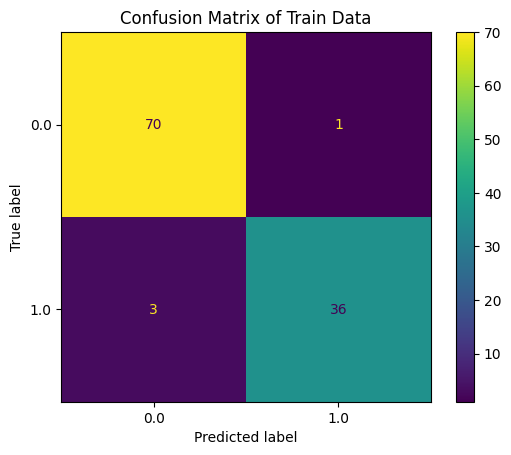

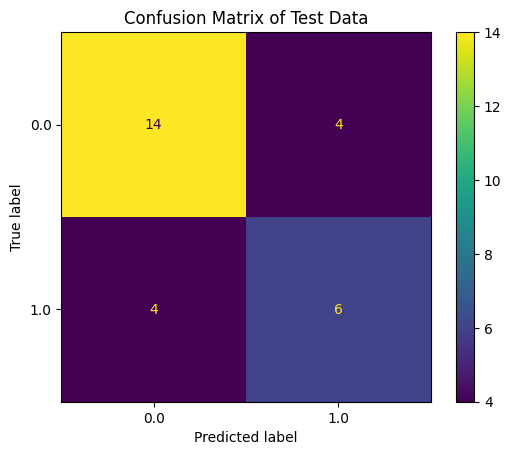

In [ ]:
#Plot Confusion Matrix for Train and Test Data
from sklearn.metrics import ConfusionMatrixDisplay
import matplotlib.pyplot as plt
#Confusion Matrix of Train Data
ConfusionMatrixDisplay.from_predictions(y_train, y_train_pred)
plt.title('Confusion Matrix of Train Data')

#Confusion Matrix of Test Data
ConfusionMatrixDisplay.from_predictions(y_test, y_test_pred)
plt.title('Confusion Matrix of Test Data')

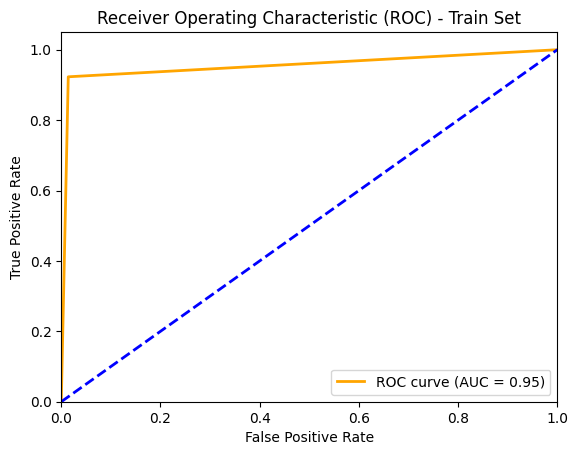

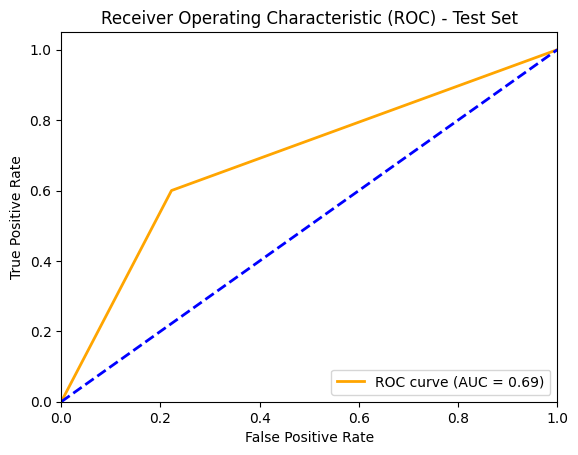

In [ ]:
#Plot ROC Curve for Train and Test Data
import matplotlib.pyplot as plt
from sklearn.metrics import roc_curve
from sklearn.metrics import auc

# Map actual "YES" and "NO" values to 1 and 0 respectively
mapping = {1.0: 1, 0.0: 0}
y_train_mapped = [mapping[val] for val in y_train]
y_test_mapped = [mapping[val] for val in y_test]

# Map predicted "YES" and "NO" values to 1 and 0 respectively
y_train_pred_mapped = [mapping[val] for val in y_train_pred]
y_test_pred_mapped = [mapping[val] for val in y_test_pred]

# ROC curve and AUC for train data
fpr_train, tpr_train, thresholds_train = roc_curve(y_train_mapped, y_train_pred_mapped)
roc_auc_train = auc(fpr_train, tpr_train)

# ROC curve and AUC for test data
fpr_test, tpr_test, thresholds_test = roc_curve(y_test_mapped, y_test_pred_mapped)
roc_auc_test = auc(fpr_test, tpr_test)

# Plot ROC curve for train data
plt.figure()
plt.plot(fpr_train, tpr_train, color='orange', lw=2, label='ROC curve (AUC = %0.2f)' % roc_auc_train)
plt.plot([0, 1], [0, 1], color='blue', lw=2, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) - Train Set')
plt.legend(loc="lower right")

# Plot ROC curve for test data
plt.figure()
plt.plot(fpr_test, tpr_test, color='orange', lw=2, label='ROC curve (AUC = %0.2f)' % roc_auc_test)
plt.plot([0, 1], [0, 1], color='blue', lw=2, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) - Test Set')
plt.legend(loc="lower right")

plt.show()

##Calculate Feature Importance Scores

Sex: 0.02706
Age: 0.07710
Fatigue: 0.00879
General weakness: 0.00451
Pain: 0.01265
Focal symptoms: 0.00894
Cranial Nerve Symptoms: 0.02104
CN3: 0.00940
CN4: 0.00116
CN5: 0.00406
CN6: 0.00431
CN8: 0.01707
Pathological reflexes: 0.01258
Rossolimo: 0.01345
Muscle strength: 0.01828
Reflex asymmetry: 0.01265
Muscle tone abnormalities: 0.01717
Proprioception: 0.03393
Superficial sensation: 0.01576
Coordination: 0.01250
Balance: 0.01708
Urinary incontinence: 0.00736
Urine retention: 0.00206
Vertigo: 0.01353
MRI lesions specific to MS: 0.01819
MRI lesions indicative of other diseases: 0.01213
MRI infratentorial lesions: 0.04054
Periventricular: 0.03599
Juxtacortical: 0.01506
MRI spinal lesions: 0.09502
Pathological CSF: 0.05131
Pleocytosis: 0.02170
OCB + in CSF: 0.15558
IgG levels in CSF: 0.08920
VEP +: 0.02912
BAEP +: 0.06374


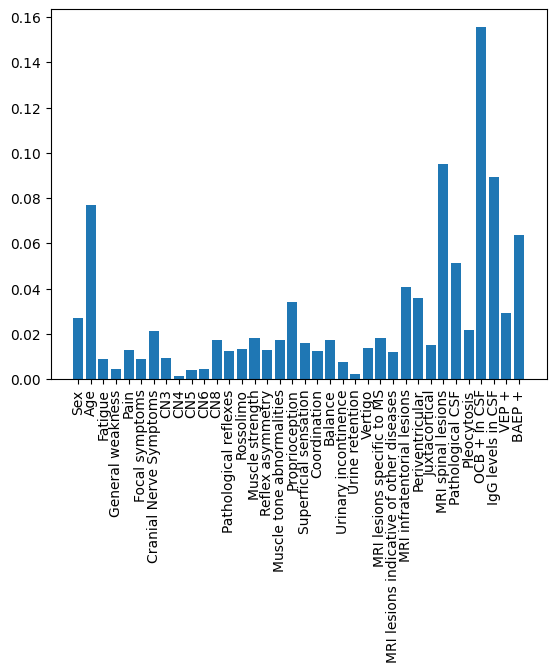

In [ ]:
importance = best_model.feature_importances_

#Summarise feature importance
for i, v in enumerate(importance):
    print('%s: %.5f' % (x_train.columns[i], v))

# Get feature names
feature_names = list(x_train.columns)

# Plot feature importances
plt.bar(feature_names, importance)
plt.xticks(rotation=90)
plt.show()



#3. Repeating the above using only important features

##Data Loading

In [ ]:
#Connect to GDrive to load the dataset
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
#Specify file path and load it into a DataFrame
import pandas as pd
data=pd.read_excel('/content/drive/My Drive/Colab Notebooks/Research Project/Research Project Dataset.xlsx')
df=pd.DataFrame(data)

##Data Pre-processing

Ensuring Reproducibility

In [ ]:
# Import libraries
import random
import numpy as np

#Set seed value
random.seed(42)
np.random.seed(42)

Visualising the dataset and its dimensions

In [ ]:
# Visualise the dataset
df.head(140)

,Nr,Sex,Age,Fatigue,General weakness,Pain,Focal symptoms,Cranial Nerve Symptoms,CN3,CN4,...,Pathological CSF,Increased protein,Increased protein (g/l),Pleocytosis,Pleocytosis (cells/ml),OCB + in CSF,IgG levels in CSF,VEP +,BAEP +,MS
0,2,0,56,0,0,0,1,1,0,0,...,1,0,0.37,0,4,0,,0,0,0
1,3,0,47,0,0,1,1,0,0,0,...,0,0,0.28,0,0,0,22.9,0,1,0
2,4,0,43,0,0,1,1,1,0,0,...,0,0,0.38,0,2,,25.3,1,0,0
3,5,0,39,0,0,1,0,0,0,0,...,0,,,0,1,0,,,,0
4,6,0,61,0,0,1,1,0,0,0,...,1,1,0.57,0,0,1,,1,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
133,165,0,65,0,0,0,1,0,0,0,...,,,NaN,,NaN,,,1,0,0
134,166,1,61,0,0,0,0,1,1,0,...,1,1,0.96,1,6,0,117,,,0
135,167,0,28,0,1,1,0,0,0,0,...,0,0,0.23,0,4,,,0,,1
136,169,0,22,0,0,0,1,0,0,0,...,0,0,0.16,0,4,1,14.9,0,0,1


In [ ]:
# Number of observations and features in the dataset
print(df.shape)

(138, 44)


Dropping columns not needed for the analysis

In [ ]:
# Remove unnecessary columns
df = df.drop(['Nr', 'Increased protein (g/l)', 'Pleocytosis (cells/ml)', 'Sum of symptoms'], axis=1)

Converting the data type for use by the model

In [ ]:
# Convert all columns to numeric data types
df = df.apply(pd.to_numeric, errors='coerce')

# Check the data types of columns
print(df.dtypes)

Sex                                           int64
Age                                           int64
Fatigue                                       int64
General weakness                              int64
Pain                                          int64
Focal symptoms                                int64
Cranial Nerve Symptoms                        int64
CN3                                           int64
CN4                                           int64
CN5                                           int64
CN6                                           int64
CN8                                           int64
Pathological reflexes                         int64
Babinski's                                    int64
Rossolimo                                     int64
Muscle strength                               int64
Reflex asymmetry                              int64
Muscle tone abnormalities                     int64
Proprioception                              float64
Superficial 

Impute missing data

In [ ]:
#Install library for imputation
!pip install impyute

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [ ]:
#import library for Multiple Imputation by Chained Equations (MICE)
from impyute.imputation.cs import mice

# impute missing values using MICE
imputed_data = mice(df.values)

# convert imputed data back to a pandas DataFrame
imputed_df = pd.DataFrame(imputed_data, columns=df.columns)

Specify features and target variable

In [ ]:
#Specify x and y
x = imputed_df[['Sex','MRI spinal lesions', 'MRI infratentorial lesions', 'BAEP +', 'Age', 'Pathological CSF', 'OCB + in CSF', 'IgG levels in CSF' ]]
y = imputed_df['MS']

#Print dimensions
print(x.shape)
print(y.shape)

(138, 8)
(138,)


Visualising Relationship between Target Variable and Each Feature in X

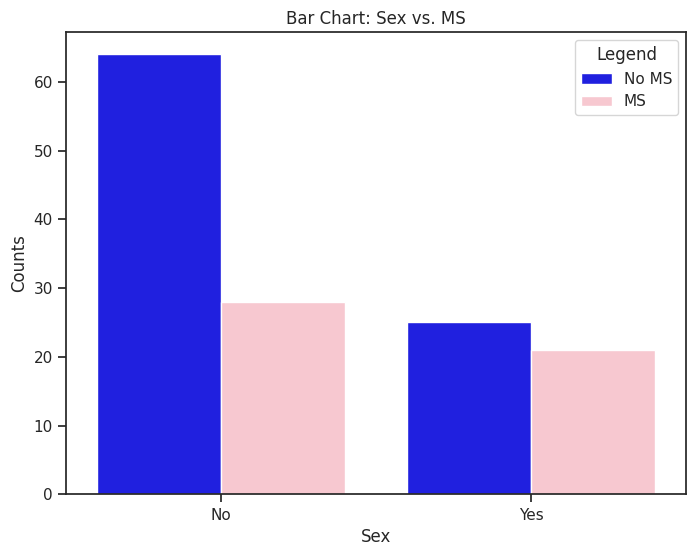

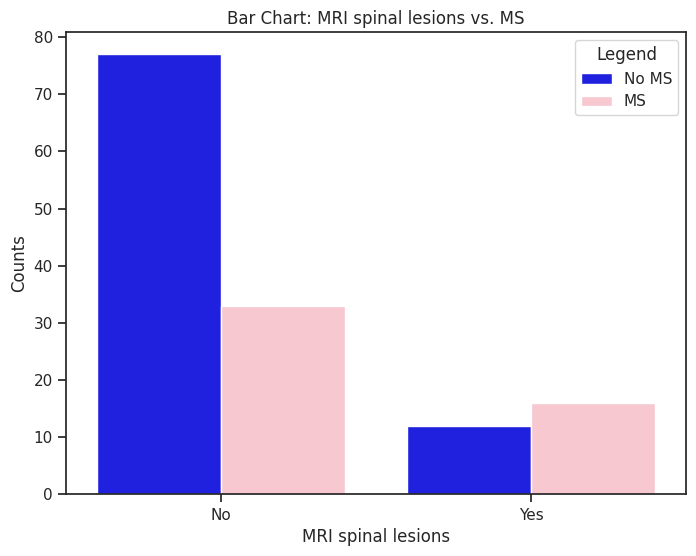

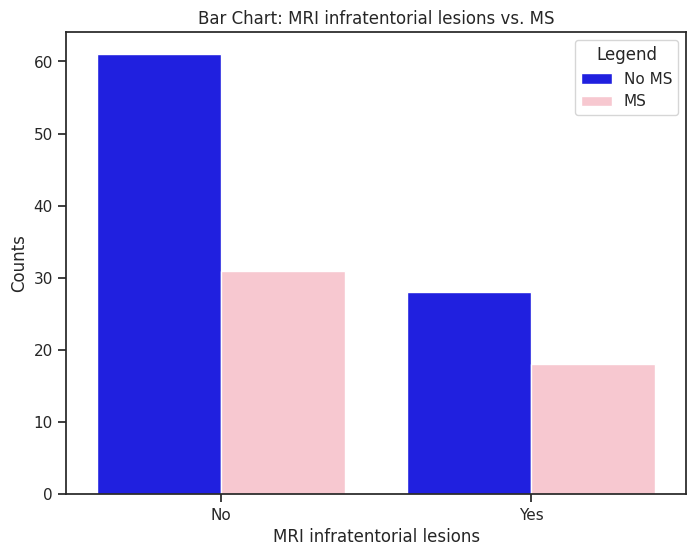

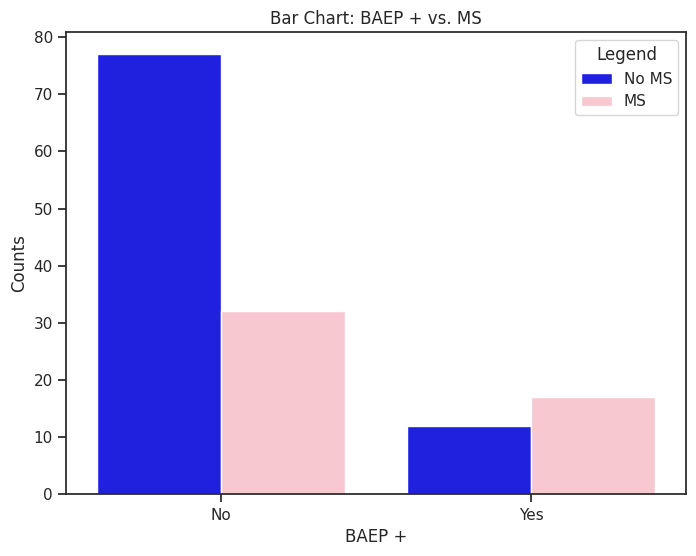

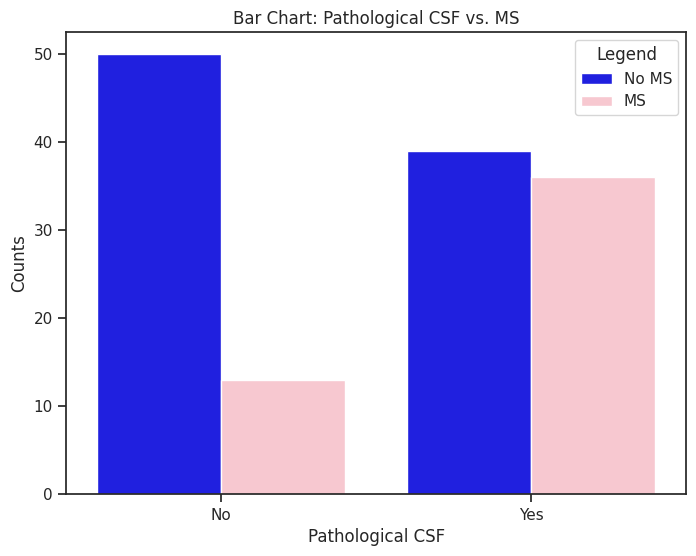

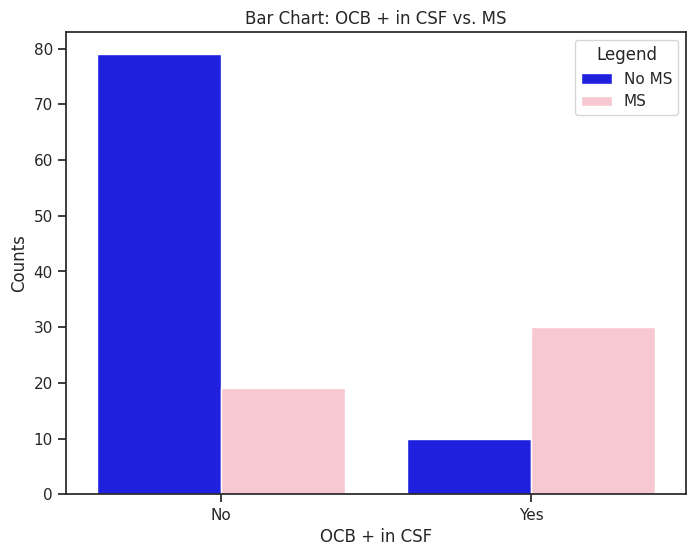

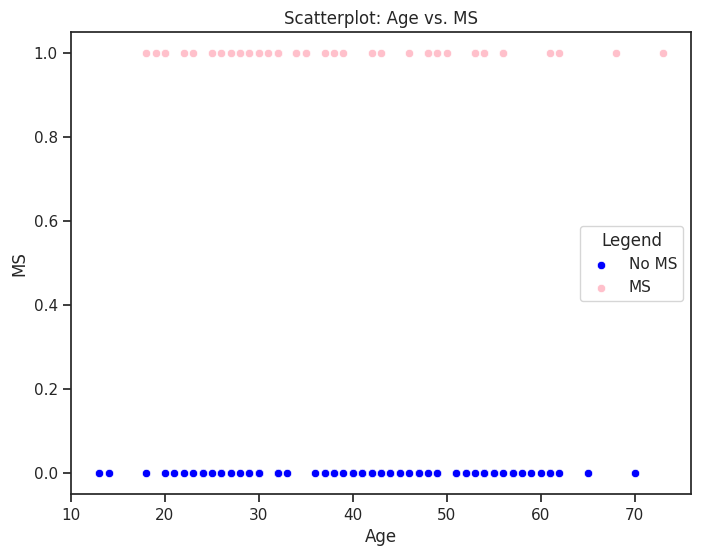

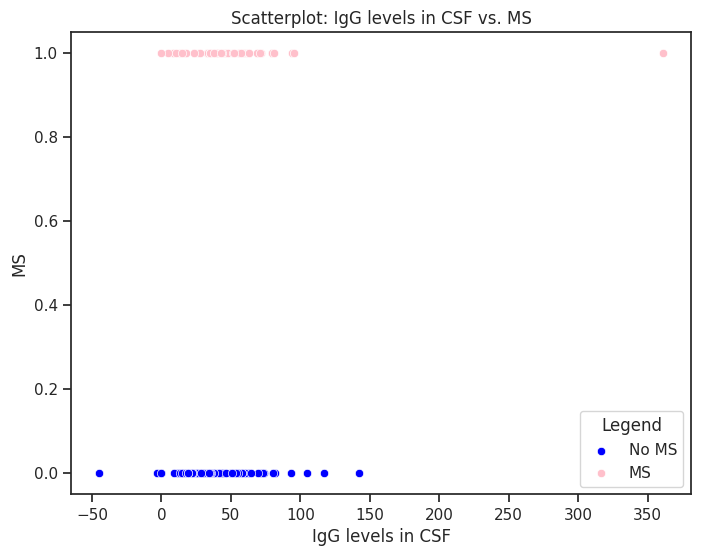

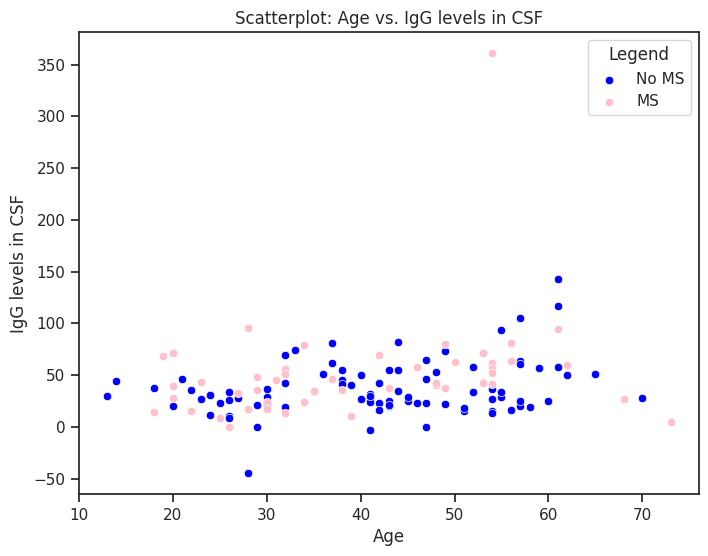

In [ ]:
# Import libraries
import seaborn as sns
import matplotlib.pyplot as plt

# Setting style and palette for plots
sns.set(style="ticks")
sns.set_palette("Set2")

# Setting style and palette for plots
sns.set(style="ticks")
sns.set_palette(["blue", "pink"])

# Define a function to convert values to 0.0 or 1.0
def convert_to_binary(value):
    if value == 0.0:
        return 0.0
    elif value == 1.0:
        return 1.0
    else:
        return 0.0

# Filter the data and convert the variables to binary values
filtered_df = imputed_df.copy()
filtered_df['Sex'] = filtered_df['Sex'].apply(convert_to_binary)
filtered_df['MRI infratentorial lesions'] = filtered_df['MRI infratentorial lesions'].apply(convert_to_binary)
filtered_df['MRI spinal lesions'] = filtered_df['MRI spinal lesions'].apply(convert_to_binary)
filtered_df['OCB + in CSF'] = filtered_df['OCB + in CSF'].apply(convert_to_binary)
filtered_df['BAEP +'] = filtered_df['BAEP +'].apply(convert_to_binary)
filtered_df['Pathological CSF'] = filtered_df['Pathological CSF'].apply(convert_to_binary)

# Plot Bar chart for each variable
variables = ['Sex', 'MRI spinal lesions', 'MRI infratentorial lesions', 'BAEP +', 'Pathological CSF', 'OCB + in CSF']

for variable in variables:
    plt.figure(figsize=(8, 6))
    ax = sns.countplot(x=variable, hue='MS', data=filtered_df)
    ax.set_ylabel("Counts")
    ax.set_xlabel(variable)
    ax.set_xticklabels(["No", "Yes"])
    plt.title(f"Bar Chart: {variable} vs. MS")
    plt.legend(title="Legend", labels=["No MS", "MS"])
    plt.show()

# Create separate scatterplots for 'No MS' and 'MS' labels
plt.figure(figsize=(8, 6))
sns.scatterplot(x='Age', y='MS', data=filtered_df[filtered_df['MS'] == 0], color='blue', label='No MS')
sns.scatterplot(x='Age', y='MS', data=filtered_df[filtered_df['MS'] == 1], color='pink', label='MS')

plt.xlabel("Age")
plt.ylabel("MS")
plt.title("Scatterplot: Age vs. MS")
plt.legend(title="Legend", labels=["No MS", "MS"])
plt.show()

plt.figure(figsize=(8, 6))
sns.scatterplot(x='IgG levels in CSF', y='MS', data=filtered_df[filtered_df['MS'] == 0], color='blue', label='No MS')
sns.scatterplot(x='IgG levels in CSF', y='MS', data=filtered_df[filtered_df['MS'] == 1], color='pink', label='MS')

plt.xlabel("IgG levels in CSF")
plt.ylabel("MS")
plt.title("Scatterplot: IgG levels in CSF vs. MS")
plt.legend(title="Legend", labels=["No MS", "MS"])
plt.show()

plt.figure(figsize=(8, 6))
sns.scatterplot(x='Age', y='IgG levels in CSF', data=filtered_df[filtered_df['MS'] == 0], color='blue', label='No MS')
sns.scatterplot(x='Age', y='IgG levels in CSF', data=filtered_df[filtered_df['MS'] == 1], color='pink', label='MS')

plt.xlabel("Age")
plt.ylabel("IgG levels in CSF")
plt.title("Scatterplot: Age vs. IgG levels in CSF")
plt.legend(title="Legend", labels=["No MS", "MS"])
plt.show()



Visualising correlation and multicollinearity as a correlation matrix, heatmap and Seaborn plots

In [ ]:
#Plotting a correlation matrix

#Import libraries
import seaborn as sns
import matplotlib.pyplot as plt

# Concatenate x and y
data = pd.concat([x, y], axis=1)

#Calculate and print the correlation matrix
print("Correlation Matrix")
data.corr()


Correlation Matrix


,Sex,MRI spinal lesions,MRI infratentorial lesions,BAEP +,Age,Pathological CSF,OCB + in CSF,IgG levels in CSF,MS
Sex,1.000000,0.117442,0.022711,-0.011385,0.016061,0.256159,-0.063964,0.117360,0.149906
MRI spinal lesions,0.117442,1.000000,0.123450,0.135498,-0.224160,0.082592,0.416571,-0.025699,0.457196
MRI infratentorial lesions,0.022711,0.123450,1.000000,0.285079,0.014285,-0.038617,0.037826,-0.038973,0.048933
BAEP +,-0.011385,0.135498,0.285079,1.000000,0.134672,0.257032,0.360770,-0.042028,0.349223
Age,0.016061,-0.224160,0.014285,0.134672,1.000000,0.043598,-0.115866,0.246406,-0.068102
Pathological CSF,0.256159,0.082592,-0.038617,0.257032,0.043598,1.000000,0.532773,0.283238,0.308386
OCB + in CSF,-0.063964,0.416571,0.037826,0.360770,-0.115866,0.532773,1.000000,0.078033,0.589130
IgG levels in CSF,0.117360,-0.025699,-0.038973,-0.042028,0.246406,0.283238,0.078033,1.000000,0.166297
MS,0.149906,0.457196,0.048933,0.349223,-0.068102,0.308386,0.589130,0.166297,1.000000


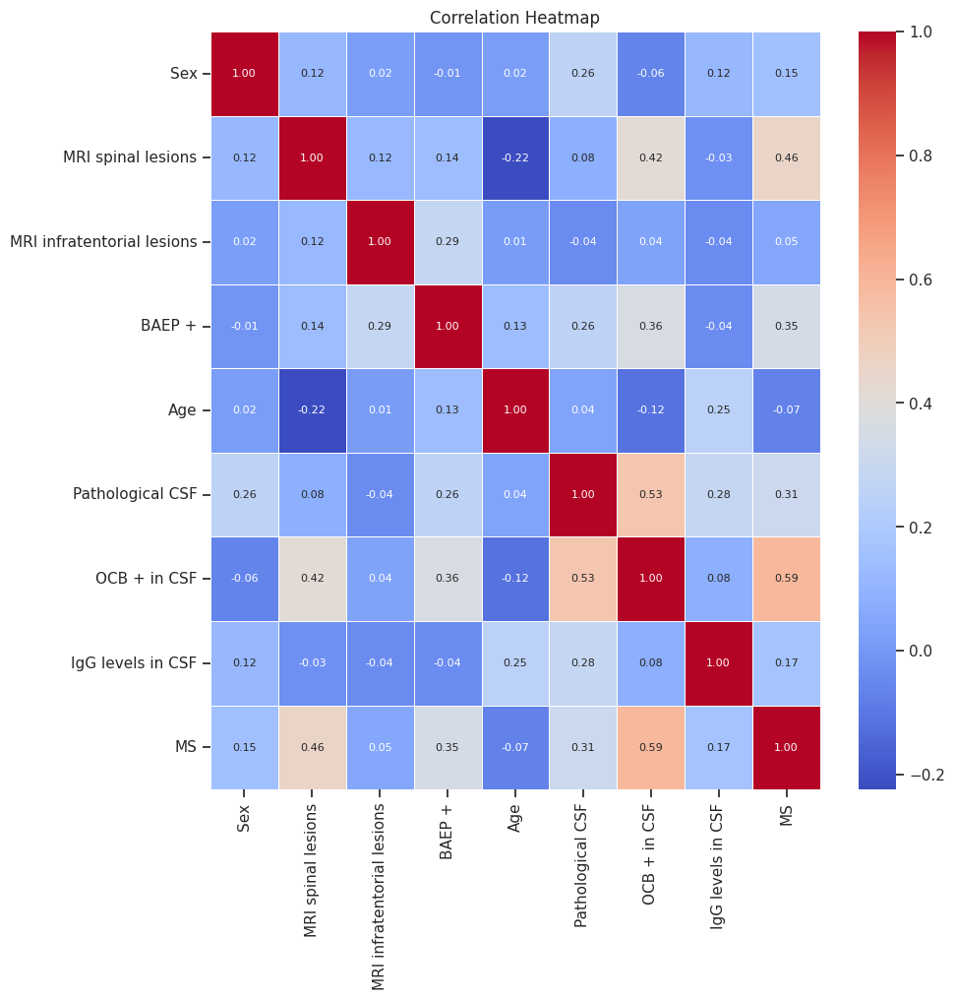

In [ ]:
#Visualise correlation and multicollinearity as a heatmap

#Import libraries
import seaborn as sns
import matplotlib.pyplot as plt

# Concatenate x and y
data = pd.concat([x, y], axis=1)

# Computing the correlation matrix
corr_matrix = data.corr()

# Plotting a heatmap
plt.figure(figsize=(10, 10))
sns.heatmap(corr_matrix, annot=True, cmap='coolwarm', fmt=".2f", linewidths=0.5, annot_kws={"size": 8})
plt.title("Correlation Heatmap")
plt.show()

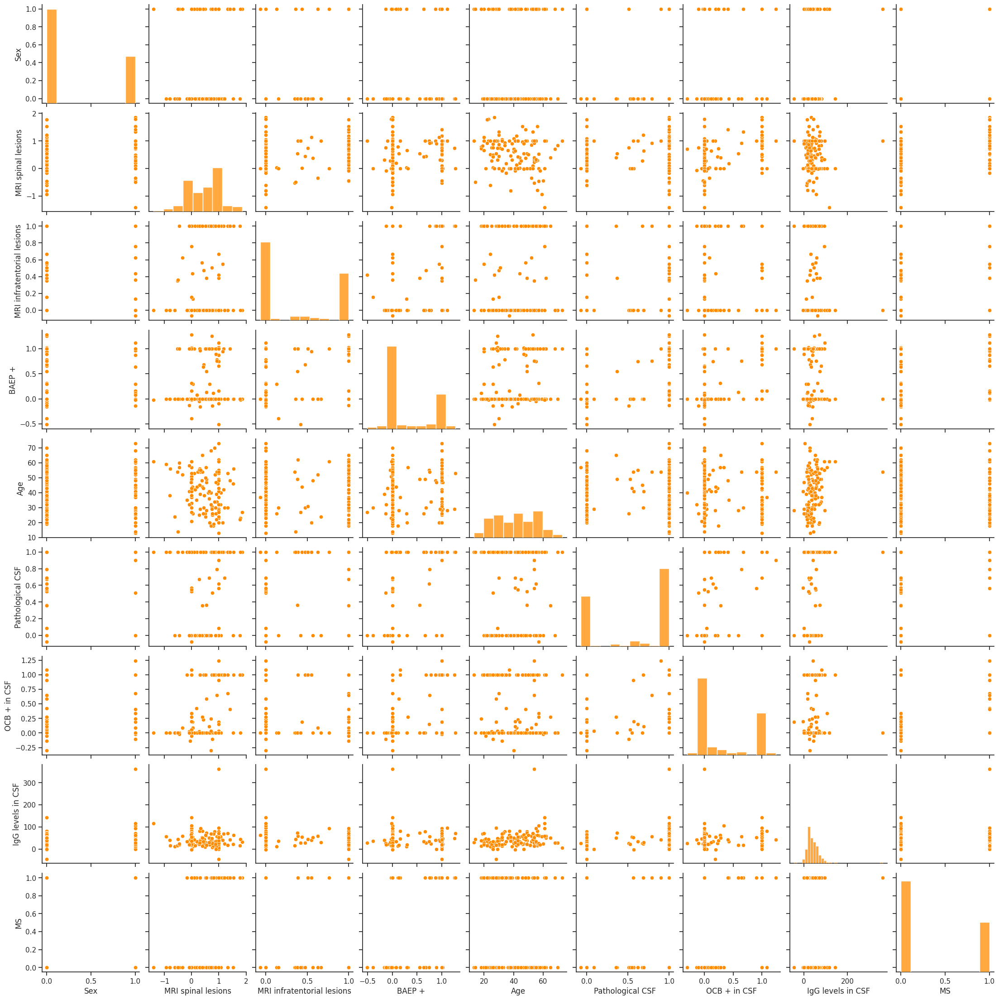

In [ ]:
# Import library
import seaborn as sns

# Set a color palette
custom_palette = ["#FF8C00"]

# Concatenate x and y
data = pd.concat([x, y], axis=1)

# Set the color palette
sns.set_palette(custom_palette)

# Visualise plots
sns.pairplot(data)

# Reset the default color palette
sns.set_palette("Set1")


In [ ]:
# Print features with multicollinearity
highly_correlated_features = []
abs_corr_matrix = corr_matrix.abs()
for i in range(len(abs_corr_matrix.columns)):
    for j in range(i+1, len(abs_corr_matrix.columns)):
        if abs_corr_matrix.iloc[i, j] > 0.7:
            feature_i = abs_corr_matrix.columns[i]
            feature_j = abs_corr_matrix.columns[j]
            highly_correlated_features.append((feature_i, feature_j))

if len(highly_correlated_features) == 0:
    print("No Multicollinearity Observed")
else:
    print("Features with multicollinearity (absolute correlation coefficient > 0.7):")
    for feature_i, feature_j in highly_correlated_features:
        print(f"{feature_i} - {feature_j}")

No Multicollinearity Observed


Checking for imbalanced classes in the dataset

0.0    64.492754
1.0    35.507246
Name: MS, dtype: float64


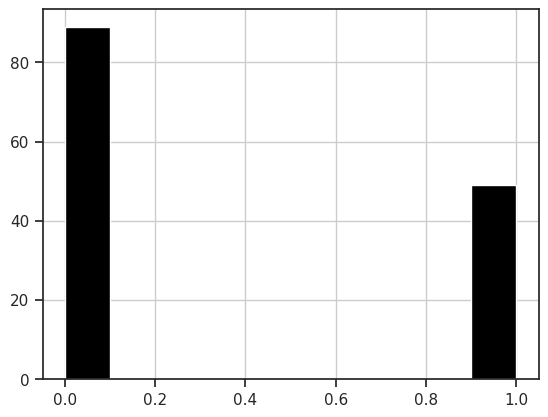

The baseline accuracy is: 0.644927536231884


In [ ]:
#Check if dataset is imbalanced
print(y.value_counts() * 100.0 / len(y))

#Visualise dataset imbalance
import matplotlib.pyplot as plt
y.hist()
plt.show()

#Find baseline accuracy
from sklearn.dummy import DummyClassifier

clf = DummyClassifier(strategy = 'most_frequent')
clf.fit(x, y)
baseline_accuracy=clf.score(x, y)
print("The baseline accuracy is:", baseline_accuracy)

##Data Splitting

Split data into train and test sets

In [ ]:
#Import train_test_split function
from sklearn.model_selection import train_test_split

# Split data into train and test sets with stratification to resolve class imbalances
x_train, x_test, y_train, y_test = train_test_split(x, y, test_size=0.2, random_state=1, stratify=y, shuffle=True)

# Print dimensions
print('x_train:', x_train.shape)
print('x_test:', x_test.shape)
print('y_train:', y_train.shape)
print('y_test:', y_test.shape)

x_train: (110, 8)
x_test: (28, 8)
y_train: (110,)
y_test: (28,)


##Importing Libraries for Following Steps

In [ ]:
# Import libraries
from sklearn.metrics import f1_score
import warnings
from sklearn.exceptions import ConvergenceWarning
import numpy as np
from sklearn.model_selection import StratifiedKFold
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import GridSearchCV

# Ignore convergence warnings
warnings.filterwarnings("ignore", category=ConvergenceWarning)

##Hyperparameter tuning

In [ ]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import GridSearchCV

# Define parameters to tune for Random Forest Classifier
rf_param_grid = {
    'n_estimators': [100, 200, 300],
    'criterion': ['gini', 'entropy'],
    'max_depth': [None, 5, 10, 15],
    'min_samples_split': [2, 5, 10],
    'min_samples_leaf': [1, 2, 4],
    'class_weight': [None, 'balanced'],
    'random_state': [None, 42]
}


##Stratified K-Fold Cross Validation:

In [ ]:
# Creating an instance of StratifiedKFold
rf_skfold = StratifiedKFold(n_splits=5, shuffle=True, random_state=1)

##Training and Model Validation:



In [ ]:
# Creating lists to store evaluation metrics for each fold
train_f1_scores = []
val_f1_scores = []

# Iterating over each fold
for train_index, val_index in rf_skfold.split(x_train, y_train):
    x_train_fold, x_val_fold = x_train.iloc[train_index], x_train.iloc[val_index]
    y_train_fold, y_val_fold = y_train.iloc[train_index], y_train.iloc[val_index]

    # Create an instance of Random Forest model
    rf = RandomForestClassifier(random_state=1)

    # Create an instance of GridSearchCV for Random Forest Classifier
    rf_cv = GridSearchCV(rf, rf_param_grid, cv=rf_skfold)

    # Fit GridSearchCV on the training fold
    rf_cv.fit(x_train_fold, y_train_fold)

    # Get the best estimator from GridSearchCV
    best_rf_model = rf_cv.best_estimator_

    # Print best parameters and F1 score
    print("Best Parameters:", rf_cv.best_params_)
    print("F1 Score:", rf_cv.best_score_)

    # Fitting the best estimator on the training fold and making predictions
    y_train_pred = best_rf_model.predict(x_train_fold)

    # Calculating F1 score for the train set
    train_f1 = f1_score(y_train_fold, y_train_pred)

    # Appending train F1 score to the list
    train_f1_scores.append(train_f1)

    # Making predictions for the validation fold
    y_val_pred = best_rf_model.predict(x_val_fold)

    # Calculating F1 score for the validation set
    val_f1 = f1_score(y_val_fold, y_val_pred)

    # Appending validation F1 score to the list
    val_f1_scores.append(val_f1)


Best Parameters: {'class_weight': None, 'criterion': 'gini', 'max_depth': 5, 'min_samples_leaf': 1, 'min_samples_split': 2, 'n_estimators': 100, 'random_state': 42}
F1 Score: 0.9071895424836601
Best Parameters: {'class_weight': None, 'criterion': 'gini', 'max_depth': None, 'min_samples_leaf': 1, 'min_samples_split': 2, 'n_estimators': 100, 'random_state': 42}
F1 Score: 0.8647058823529413
Best Parameters: {'class_weight': None, 'criterion': 'gini', 'max_depth': 5, 'min_samples_leaf': 2, 'min_samples_split': 10, 'n_estimators': 100, 'random_state': None}
F1 Score: 0.8516339869281045
Best Parameters: {'class_weight': None, 'criterion': 'gini', 'max_depth': 10, 'min_samples_leaf': 4, 'min_samples_split': 2, 'n_estimators': 300, 'random_state': None}
F1 Score: 0.8300653594771242
Best Parameters: {'class_weight': None, 'criterion': 'gini', 'max_depth': None, 'min_samples_leaf': 2, 'min_samples_split': 2, 'n_estimators': 300, 'random_state': None}
F1 Score: 0.8633986928104574


##Average F1 Scores and Standard Deviation:

In [ ]:
# Calculating the average and standard deviation of F1 scores for train and validation sets
avg_train_f1 = np.mean(train_f1_scores)
std_train_f1 = np.std(train_f1_scores)
avg_val_f1 = np.mean(val_f1_scores)
std_val_f1 = np.std(val_f1_scores)

# Print the average and standard deviation for train and validation F1 scores
print("Average Train F1 Score:", avg_train_f1)
print("Standard Deviation of Train F1 Score:", std_train_f1)
print("Average Validation F1 Score:", avg_val_f1)
print("Standard Deviation of Validation F1 Score:", std_val_f1)


Average Train F1 Score: 0.9129607952620635
Standard Deviation of Train F1 Score: 0.08307814399820969
Average Validation F1 Score: 0.748131868131868
Standard Deviation of Validation F1 Score: 0.12271567427139844


##Model Predictions on Train and Test Sets:

In [ ]:
# Make predictions on the train set using best model
best_model = rf_cv.best_estimator_
y_train_pred = best_model.predict(x_train)

# Make predictions on the test set using best model
best_model = rf_cv.best_estimator_
y_test_pred = best_model.predict(x_test)

##Visualise Various Classification Metrics

In [ ]:
#Print Classification Report
from sklearn.metrics import classification_report
print("Classification Report of Train Data:")
print(classification_report(y_train, y_train_pred))

print()

print("Classification Report of Test Data: ")
print(classification_report(y_test, y_test_pred))


Classification Report of Train Data:
              precision    recall  f1-score   support

         0.0       0.93      0.97      0.95        71
         1.0       0.94      0.87      0.91        39

    accuracy                           0.94       110
   macro avg       0.94      0.92      0.93       110
weighted avg       0.94      0.94      0.94       110


Classification Report of Test Data: 
              precision    recall  f1-score   support

         0.0       0.84      0.89      0.86        18
         1.0       0.78      0.70      0.74        10

    accuracy                           0.82        28
   macro avg       0.81      0.79      0.80        28
weighted avg       0.82      0.82      0.82        28



Text(0.5, 1.0, 'Confusion Matrix of Test Data')

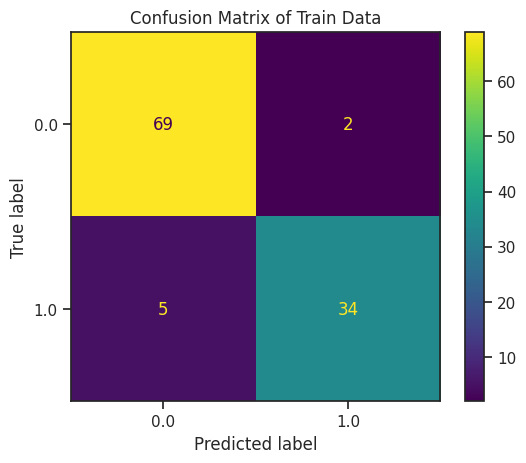

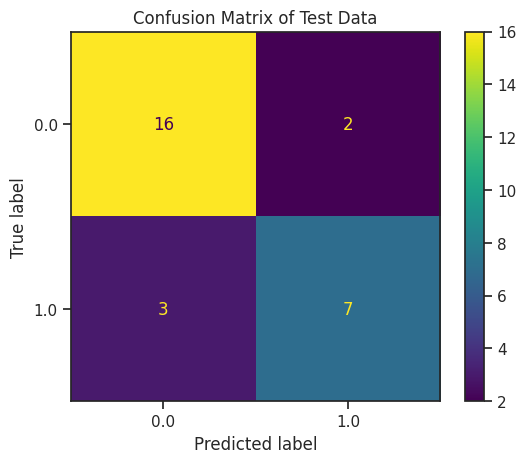

In [ ]:
#Plot Confusion Matrix for Train and Test Data
from sklearn.metrics import ConfusionMatrixDisplay
import matplotlib.pyplot as plt

#Confusion Matrix of Train Data
ConfusionMatrixDisplay.from_predictions(y_train, y_train_pred)
plt.title('Confusion Matrix of Train Data')

#Confusion Matrix of Test Data
ConfusionMatrixDisplay.from_predictions(y_test, y_test_pred)
plt.title('Confusion Matrix of Test Data')

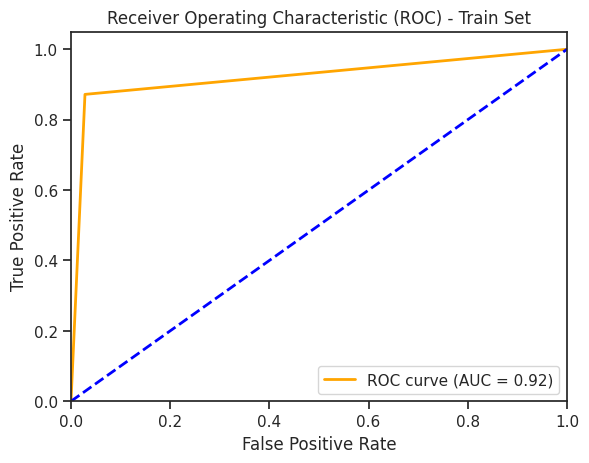

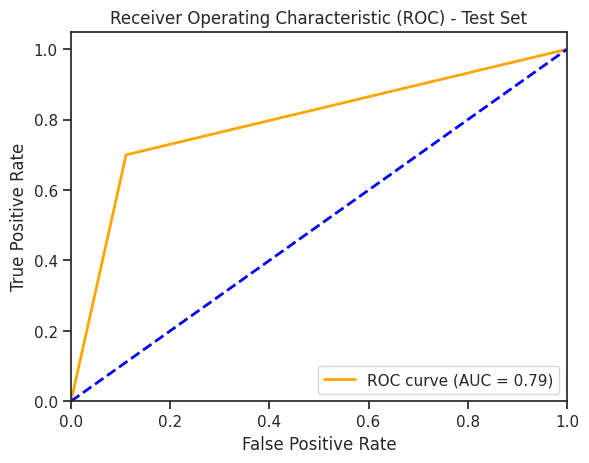

In [ ]:
#Plot ROC Curve for Train and Test Data
import matplotlib.pyplot as plt
from sklearn.metrics import roc_curve
from sklearn.metrics import auc

# Map actual "YES" and "NO" values to 1 and 0 respectively
mapping = {1.0: 1, 0.0: 0}
y_train_mapped = [mapping[val] for val in y_train]
y_test_mapped = [mapping[val] for val in y_test]

# Map predicted "YES" and "NO" values to 1 and 0 respectively
y_train_pred_mapped = [mapping[val] for val in y_train_pred]
y_test_pred_mapped = [mapping[val] for val in y_test_pred]

# ROC curve and AUC for train data
fpr_train, tpr_train, thresholds_train = roc_curve(y_train_mapped, y_train_pred_mapped)
roc_auc_train = auc(fpr_train, tpr_train)

# ROC curve and AUC for test data
fpr_test, tpr_test, thresholds_test = roc_curve(y_test_mapped, y_test_pred_mapped)
roc_auc_test = auc(fpr_test, tpr_test)

# Plot ROC curve for train data
plt.figure()
plt.plot(fpr_train, tpr_train, color='orange', lw=2, label='ROC curve (AUC = %0.2f)' % roc_auc_train)
plt.plot([0, 1], [0, 1], color='blue', lw=2, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) - Train Set')
plt.legend(loc="lower right")

# Plot ROC curve for test data
plt.figure()
plt.plot(fpr_test, tpr_test, color='orange', lw=2, label='ROC curve (AUC = %0.2f)' % roc_auc_test)
plt.plot([0, 1], [0, 1], color='blue', lw=2, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) - Test Set')
plt.legend(loc="lower right")

plt.show()

##Calculating Feature Importances

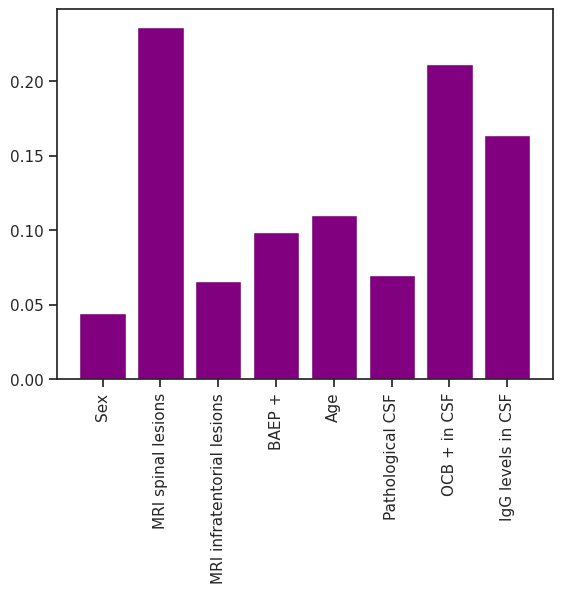

In [ ]:
import matplotlib.pyplot as plt

importance = best_model.feature_importances_

# Get feature names
feature_names = list(x_train.columns)

# Plot feature importances
plt.bar(feature_names, importance, color=['purple'])
plt.xticks(rotation=90)
plt.show()


#4. Repeating the above with Predictors Identified in the Original Study

##Data Loading

In [ ]:
#Connect to GDrive to load the dataset
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
#Specify file path and load it into a DataFrame
import pandas as pd
data=pd.read_excel('/content/drive/My Drive/Colab Notebooks/Research Project/Research Project Dataset.xlsx')
df=pd.DataFrame(data)

##Data Pre-processing

Ensuring Reproducibility

In [ ]:
# Import libraries
import random
import numpy as np

#Set seed value
random.seed(42)
np.random.seed(42)

Visualising the dataset and its dimensions

In [ ]:
# Visualise the dataset
df.head(140)

,Nr,Sex,Age,Fatigue,General weakness,Pain,Focal symptoms,Cranial Nerve Symptoms,CN3,CN4,...,Pathological CSF,Increased protein,Increased protein (g/l),Pleocytosis,Pleocytosis (cells/ml),OCB + in CSF,IgG levels in CSF,VEP +,BAEP +,MS
0,2,0,56,0,0,0,1,1,0,0,...,1,0,0.37,0,4,0,,0,0,0
1,3,0,47,0,0,1,1,0,0,0,...,0,0,0.28,0,0,0,22.9,0,1,0
2,4,0,43,0,0,1,1,1,0,0,...,0,0,0.38,0,2,,25.3,1,0,0
3,5,0,39,0,0,1,0,0,0,0,...,0,,,0,1,0,,,,0
4,6,0,61,0,0,1,1,0,0,0,...,1,1,0.57,0,0,1,,1,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
133,165,0,65,0,0,0,1,0,0,0,...,,,NaN,,NaN,,,1,0,0
134,166,1,61,0,0,0,0,1,1,0,...,1,1,0.96,1,6,0,117,,,0
135,167,0,28,0,1,1,0,0,0,0,...,0,0,0.23,0,4,,,0,,1
136,169,0,22,0,0,0,1,0,0,0,...,0,0,0.16,0,4,1,14.9,0,0,1


In [ ]:
# Number of observations and features in the dataset
print(df.shape)

(138, 40)


Dropping columns not needed for the analysis

In [ ]:
# Remove unnecessary columns
df = df.drop(['Nr', 'Increased protein (g/l)', 'Pleocytosis (cells/ml)', 'Sum of symptoms'], axis=1)

Converting the data type for use by the model

In [ ]:
# Convert all columns to numeric data types
df = df.apply(pd.to_numeric, errors='coerce')

# Check the data types of columns
print(df.dtypes)

Sex                                           int64
Age                                           int64
Fatigue                                       int64
General weakness                              int64
Pain                                          int64
Focal symptoms                                int64
Cranial Nerve Symptoms                        int64
CN3                                           int64
CN4                                           int64
CN5                                           int64
CN6                                           int64
CN8                                           int64
Pathological reflexes                         int64
Babinski's                                    int64
Rossolimo                                     int64
Muscle strength                               int64
Reflex asymmetry                              int64
Muscle tone abnormalities                     int64
Proprioception                              float64
Superficial 

Impute missing data

In [ ]:
#Install library for imputation
!pip install impyute

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [ ]:
#import library for Multiple Imputation by Chained Equations (MICE)
from impyute.imputation.cs import mice

# impute missing values using MICE
imputed_data = mice(df.values)

# convert imputed data back to a pandas DataFrame
imputed_df = pd.DataFrame(imputed_data, columns=df.columns)

Specify features and target variable

In [ ]:
#Specify x and y
x = imputed_df[['Proprioception', 'MRI spinal lesions', 'OCB + in CSF', 'BAEP +']]
y = imputed_df['MS']

#Print dimensions
print(x.shape)
print(y.shape)

(138, 4)
(138,)


Visualising Relationship between Target Variable and Each Feature in X

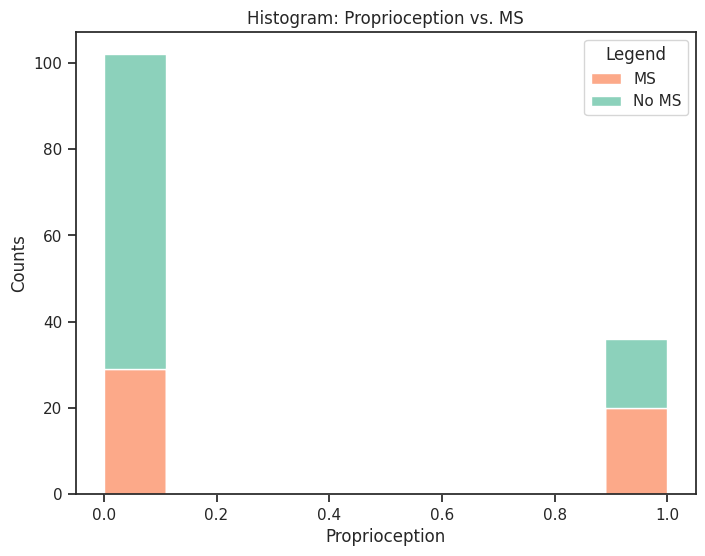

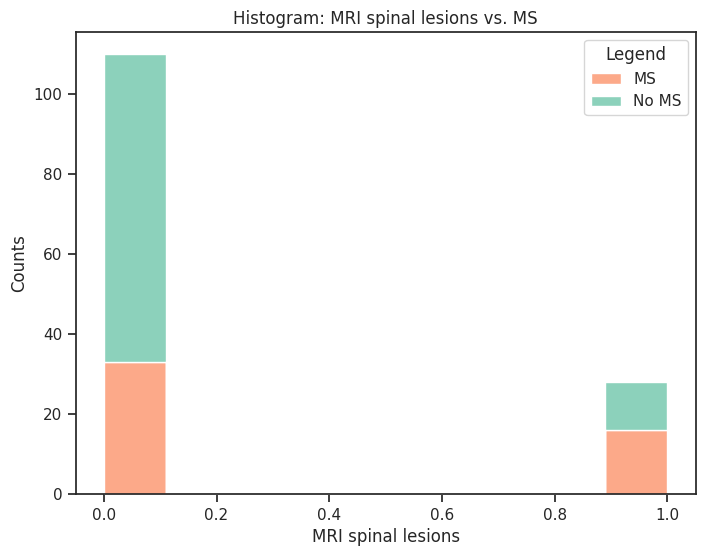

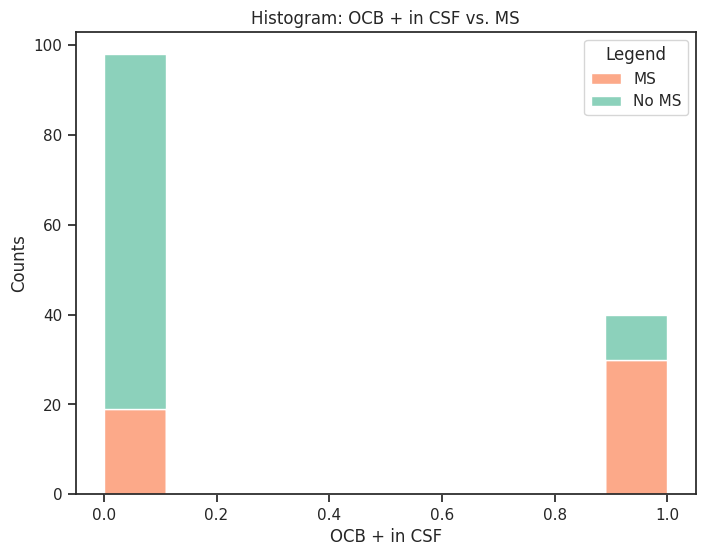

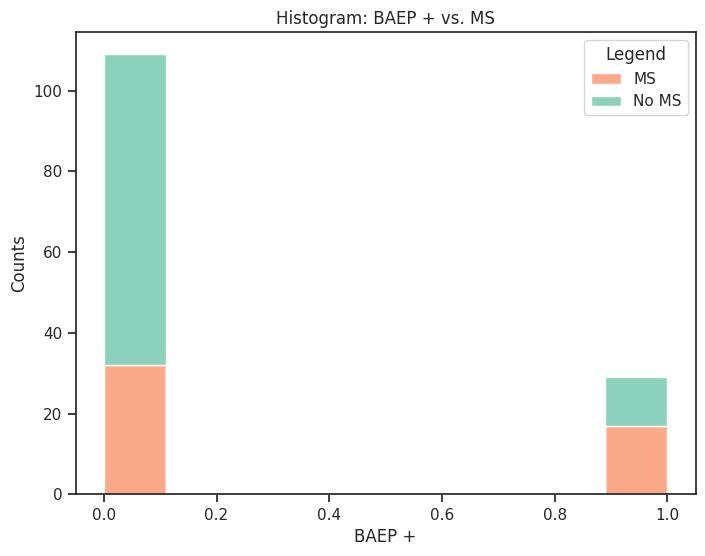

In [ ]:
# Import libraries
import seaborn as sns
import matplotlib.pyplot as plt

# Set style and palette for plots
sns.set(style="ticks")
sns.set_palette("Set2")

# Define a function to convert values to 0.0 or 1.0
def convert_to_binary(value):
    if value == 0.0:
        return 0.0
    elif value == 1.0:
        return 1.0
    else:
        return 0.0  # Convert any unexpected value to 0.0

# Filter the data and convert the variables to binary values
filtered_df = imputed_df.copy()
filtered_df['Proprioception'] = filtered_df['Proprioception'].apply(convert_to_binary)
filtered_df['MRI spinal lesions'] = filtered_df['MRI spinal lesions'].apply(convert_to_binary)
filtered_df['OCB + in CSF'] = filtered_df['OCB + in CSF'].apply(convert_to_binary)
filtered_df['BAEP +'] = filtered_df['BAEP +'].apply(convert_to_binary)

# Plot Histogram for each variable
variables = ['Proprioception', 'MRI spinal lesions', 'OCB + in CSF', 'BAEP +']

for variable in variables:
    plt.figure(figsize=(8, 6))
    sns.histplot(data=filtered_df, x=variable, hue='MS', element="step", multiple="stack")
    plt.xlabel(variable)
    plt.ylabel("Counts")
    plt.title(f"Histogram: {variable} vs. MS")
    plt.legend(title="Legend", labels=["MS", "No MS"])
    plt.show()

Visualising correlation and multicollinearity as a correlation matrix, heatmap and Seaborn plots

In [ ]:
#Plotting a correlation matrix

#Import libraries
import seaborn as sns
import matplotlib.pyplot as plt

# Concatenate x and y
data = pd.concat([x, y], axis=1)

#Calculate and print the correlation matrix
print("Correlation Matrix")
data.corr()


Correlation Matrix


,Proprioception,MRI spinal lesions,OCB + in CSF,BAEP +,MS
Proprioception,1.000000,0.108183,0.162010,0.154389,0.251181
MRI spinal lesions,0.108183,1.000000,0.416571,0.135498,0.457196
OCB + in CSF,0.162010,0.416571,1.000000,0.360770,0.589130
BAEP +,0.154389,0.135498,0.360770,1.000000,0.349223
MS,0.251181,0.457196,0.589130,0.349223,1.000000


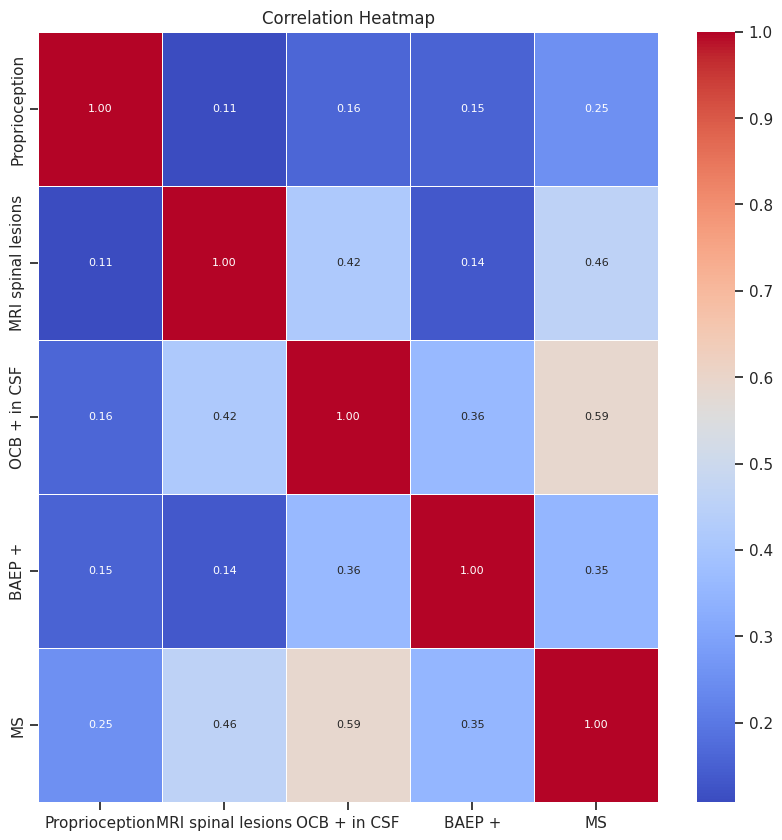

In [ ]:
#Visualise correlation and multicollinearity as a heatmap

#Import libraries
import seaborn as sns
import matplotlib.pyplot as plt

# Concatenate x and y
data = pd.concat([x, y], axis=1)

# Computing the correlation matrix
corr_matrix = data.corr()

# Plotting a heatmap
plt.figure(figsize=(10, 10))
sns.heatmap(corr_matrix, annot=True, cmap='coolwarm', fmt=".2f", linewidths=0.5, annot_kws={"size": 8})
plt.title("Correlation Heatmap")
plt.show()

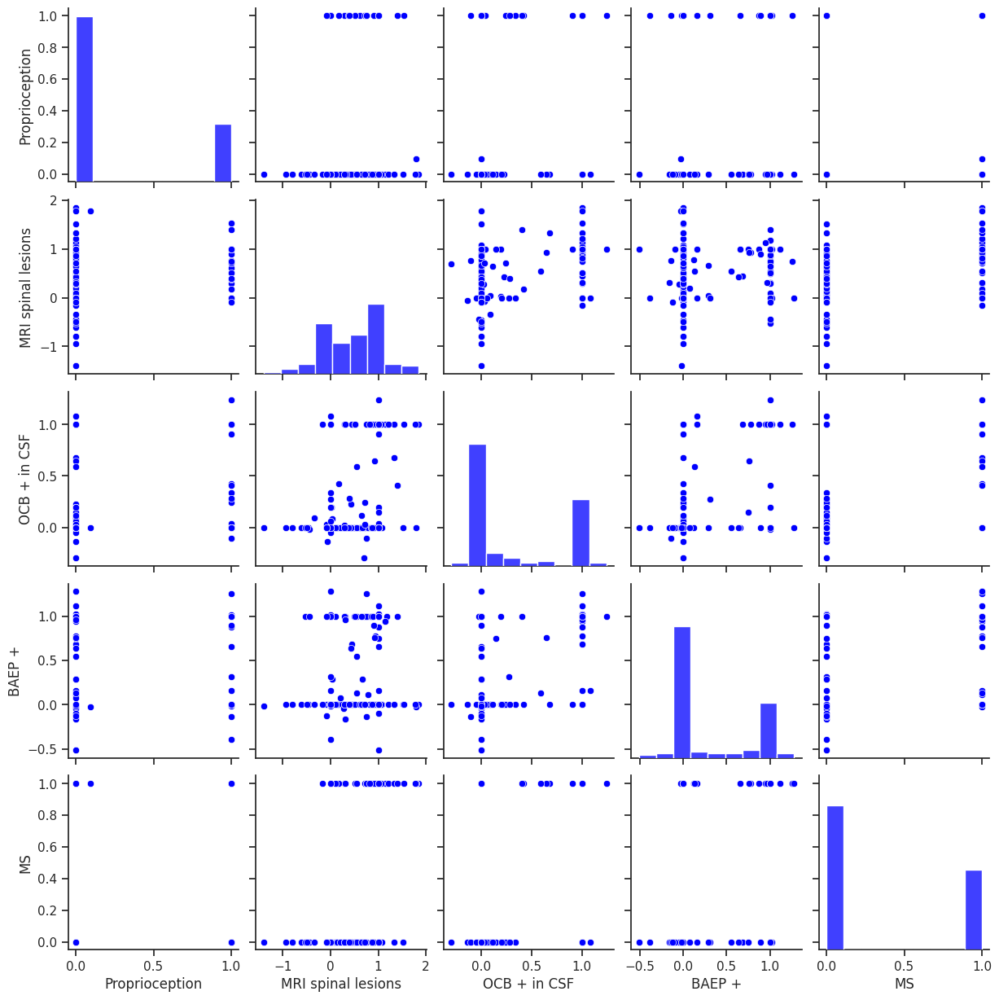

In [ ]:
# Import library
import seaborn as sns

# Concatenate x and y
data = pd.concat([x, y], axis=1)

# Set color
color = 'blue'

# Visualise plots
sns.pairplot(data, diag_kws={'color': color}, plot_kws={'color': color})


In [ ]:
# Print features with multicollinearity
highly_correlated_features = []
abs_corr_matrix = corr_matrix.abs()
for i in range(len(abs_corr_matrix.columns)):
    for j in range(i+1, len(abs_corr_matrix.columns)):
        if abs_corr_matrix.iloc[i, j] > 0.7:
            feature_i = abs_corr_matrix.columns[i]
            feature_j = abs_corr_matrix.columns[j]
            highly_correlated_features.append((feature_i, feature_j))

if len(highly_correlated_features) == 0:
    print("No Multicollinearity Observed")
else:
    print("Features with multicollinearity (absolute correlation coefficient > 0.7):")
    for feature_i, feature_j in highly_correlated_features:
        print(f"{feature_i} - {feature_j}")

No Multicollinearity Observed


Checking for imbalanced classes in the dataset

0.0    64.492754
1.0    35.507246
Name: MS, dtype: float64


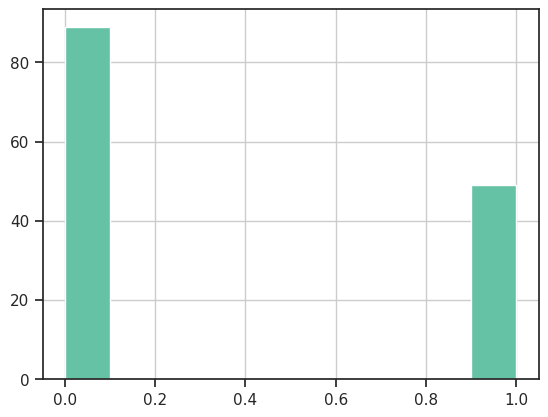

The baseline accuracy is: 0.644927536231884


In [ ]:
#Check if dataset is imbalanced
print(y.value_counts() * 100.0 / len(y))

#Visualise dataset imbalance
import matplotlib.pyplot as plt
y.hist()
plt.show()

#Find baseline accuracy
from sklearn.dummy import DummyClassifier

clf = DummyClassifier(strategy = 'most_frequent')
clf.fit(x, y)
baseline_accuracy=clf.score(x, y)
print("The baseline accuracy is:", baseline_accuracy)

##Data Splitting

Split data into train and test sets

In [ ]:
#Import train_test_split function
from sklearn.model_selection import train_test_split

# Split data into train and test sets with stratification to resolve class imbalances
x_train, x_test, y_train, y_test = train_test_split(x, y, test_size=0.2, random_state=1, stratify=y, shuffle=True)

# Print dimensions
print('x_train:', x_train.shape)
print('x_test:', x_test.shape)
print('y_train:', y_train.shape)
print('y_test:', y_test.shape)

x_train: (110, 4)
x_test: (28, 4)
y_train: (110,)
y_test: (28,)


##Importing Libraries for Following Steps

In [ ]:
# Import libraries
from sklearn.metrics import f1_score
import warnings
from sklearn.exceptions import ConvergenceWarning
import numpy as np
from sklearn.model_selection import StratifiedKFold
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import GridSearchCV

# Ignore convergence warnings
warnings.filterwarnings("ignore", category=ConvergenceWarning)

##Hyperparameter tuning

In [ ]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import GridSearchCV

# Define parameters to tune for Random Forest Classifier
rf_param_grid = {
    'n_estimators': [100, 200, 300],
    'criterion': ['gini', 'entropy'],
    'max_depth': [None, 5, 10, 15],
    'min_samples_split': [2, 5, 10],
    'min_samples_leaf': [1, 2, 4],
    'class_weight': [None, 'balanced'],
    'random_state': [None, 42]
}


##Stratified K-Fold Cross Validation:

In [ ]:
# Creating an instance of StratifiedKFold
rf_skfold = StratifiedKFold(n_splits=5, shuffle=True, random_state=1)

##Training and Model Validation:



In [ ]:
# Creating lists to store evaluation metrics for each fold
train_f1_scores = []
val_f1_scores = []

# Iterating over each fold
for train_index, val_index in rf_skfold.split(x_train, y_train):
    x_train_fold, x_val_fold = x_train.iloc[train_index], x_train.iloc[val_index]
    y_train_fold, y_val_fold = y_train.iloc[train_index], y_train.iloc[val_index]

    # Create an instance of Random Forest model
    rf = RandomForestClassifier(random_state=1)

    # Create an instance of GridSearchCV for Random Forest Classifier
    rf_cv = GridSearchCV(rf, rf_param_grid, cv=rf_skfold)

    # Fit GridSearchCV on the training fold
    rf_cv.fit(x_train_fold, y_train_fold)

    # Get the best estimator from GridSearchCV
    best_rf_model = rf_cv.best_estimator_

    # Print best parameters and F1 score
    print("Best Parameters:", rf_cv.best_params_)
    print("F1 Score:", rf_cv.best_score_)

    # Fitting the best estimator on the training fold and making predictions
    y_train_pred = best_rf_model.predict(x_train_fold)

    # Calculating F1 score for the train set
    train_f1 = f1_score(y_train_fold, y_train_pred)

    # Appending train F1 score to the list
    train_f1_scores.append(train_f1)

    # Making predictions for the validation fold
    y_val_pred = best_rf_model.predict(x_val_fold)

    # Calculating F1 score for the validation set
    val_f1 = f1_score(y_val_fold, y_val_pred)

    # Appending validation F1 score to the list
    val_f1_scores.append(val_f1)


Best Parameters: {'class_weight': None, 'criterion': 'entropy', 'max_depth': 15, 'min_samples_leaf': 1, 'min_samples_split': 10, 'n_estimators': 100, 'random_state': None}
F1 Score: 0.884967320261438
Best Parameters: {'class_weight': None, 'criterion': 'gini', 'max_depth': None, 'min_samples_leaf': 4, 'min_samples_split': 5, 'n_estimators': 200, 'random_state': None}
F1 Score: 0.8529411764705882
Best Parameters: {'class_weight': None, 'criterion': 'entropy', 'max_depth': None, 'min_samples_leaf': 4, 'min_samples_split': 2, 'n_estimators': 100, 'random_state': None}
F1 Score: 0.815686274509804
Best Parameters: {'class_weight': None, 'criterion': 'gini', 'max_depth': 10, 'min_samples_leaf': 4, 'min_samples_split': 2, 'n_estimators': 100, 'random_state': None}
F1 Score: 0.8287581699346405
Best Parameters: {'class_weight': None, 'criterion': 'entropy', 'max_depth': None, 'min_samples_leaf': 2, 'min_samples_split': 10, 'n_estimators': 100, 'random_state': 42}
F1 Score: 0.8287581699346405


##Average F1 Scores and Standard Deviation:

In [ ]:
# Calculating the average and standard deviation of F1 scores for train and validation sets
avg_train_f1 = np.mean(train_f1_scores)
std_train_f1 = np.std(train_f1_scores)
avg_val_f1 = np.mean(val_f1_scores)
std_val_f1 = np.std(val_f1_scores)

# Print the average and standard deviation for train and validation F1 scores
print("Average Train F1 Score:", avg_train_f1)
print("Standard Deviation of Train F1 Score:", std_train_f1)
print("Average Validation F1 Score:", avg_val_f1)
print("Standard Deviation of Validation F1 Score:", std_val_f1)


Average Train F1 Score: 0.7797274687204896
Standard Deviation of Train F1 Score: 0.0532675811326475
Average Validation F1 Score: 0.6876190476190476
Standard Deviation of Validation F1 Score: 0.15826726154545512


##Model Predictions on Train and Test Sets:

In [ ]:
# Make predictions on the train set using best model
best_model = rf_cv.best_estimator_
y_train_pred = best_model.predict(x_train)

# Make predictions on the test set using best model
best_model = rf_cv.best_estimator_
y_test_pred = best_model.predict(x_test)

##Visualise Various Classification Metrics

In [ ]:
#Print Classification Report
from sklearn.metrics import classification_report
print("Classification Report of Train Data:")
print(classification_report(y_train, y_train_pred))

print()

print("Classification Report of Test Data: ")
print(classification_report(y_test, y_test_pred))


Classification Report of Train Data:
              precision    recall  f1-score   support

         0.0       0.84      0.94      0.89        71
         1.0       0.87      0.67      0.75        39

    accuracy                           0.85       110
   macro avg       0.85      0.81      0.82       110
weighted avg       0.85      0.85      0.84       110


Classification Report of Test Data: 
              precision    recall  f1-score   support

         0.0       0.84      0.89      0.86        18
         1.0       0.78      0.70      0.74        10

    accuracy                           0.82        28
   macro avg       0.81      0.79      0.80        28
weighted avg       0.82      0.82      0.82        28



Text(0.5, 1.0, 'Confusion Matrix of Test Data')

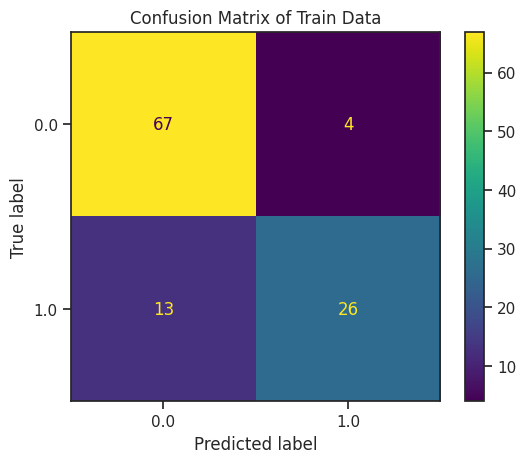

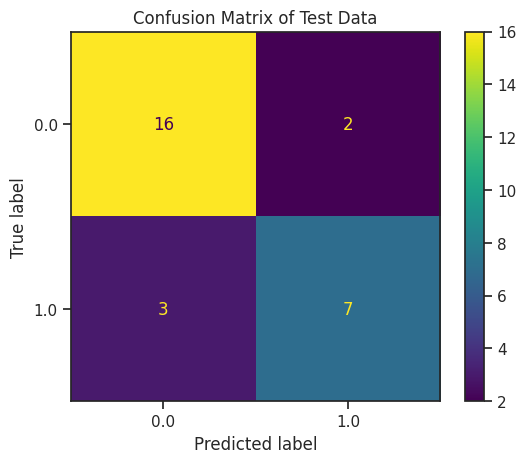

In [ ]:
#Plot Confusion Matrix for Train and Test Data
from sklearn.metrics import ConfusionMatrixDisplay
import matplotlib.pyplot as plt

#Confusion Matrix of Train Data
ConfusionMatrixDisplay.from_predictions(y_train, y_train_pred)
plt.title('Confusion Matrix of Train Data')

#Confusion Matrix of Test Data
ConfusionMatrixDisplay.from_predictions(y_test, y_test_pred)
plt.title('Confusion Matrix of Test Data')

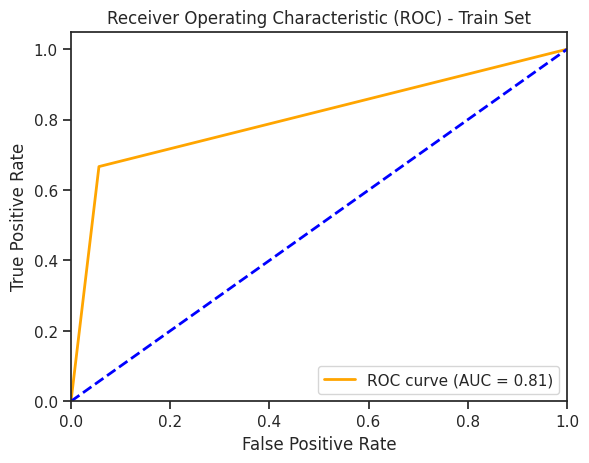

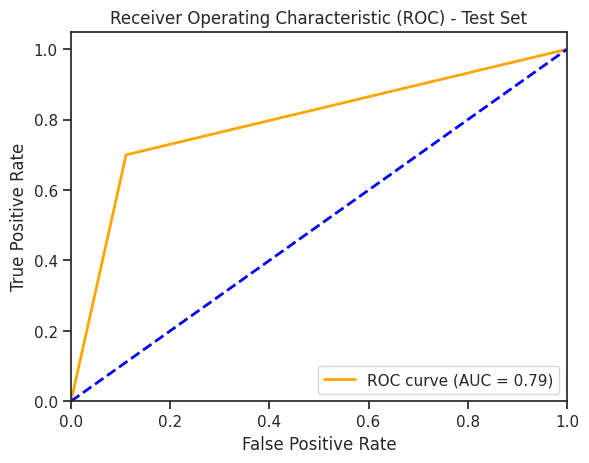

In [ ]:
#Plot ROC Curve for Train and Test Data
import matplotlib.pyplot as plt
from sklearn.metrics import roc_curve
from sklearn.metrics import auc

# Map actual "YES" and "NO" values to 1 and 0 respectively
mapping = {1.0: 1, 0.0: 0}
y_train_mapped = [mapping[val] for val in y_train]
y_test_mapped = [mapping[val] for val in y_test]

# Map predicted "YES" and "NO" values to 1 and 0 respectively
y_train_pred_mapped = [mapping[val] for val in y_train_pred]
y_test_pred_mapped = [mapping[val] for val in y_test_pred]

# ROC curve and AUC for train data
fpr_train, tpr_train, thresholds_train = roc_curve(y_train_mapped, y_train_pred_mapped)
roc_auc_train = auc(fpr_train, tpr_train)

# ROC curve and AUC for test data
fpr_test, tpr_test, thresholds_test = roc_curve(y_test_mapped, y_test_pred_mapped)
roc_auc_test = auc(fpr_test, tpr_test)

# Plot ROC curve for train data
plt.figure()
plt.plot(fpr_train, tpr_train, color='orange', lw=2, label='ROC curve (AUC = %0.2f)' % roc_auc_train)
plt.plot([0, 1], [0, 1], color='blue', lw=2, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) - Train Set')
plt.legend(loc="lower right")

# Plot ROC curve for test data
plt.figure()
plt.plot(fpr_test, tpr_test, color='orange', lw=2, label='ROC curve (AUC = %0.2f)' % roc_auc_test)
plt.plot([0, 1], [0, 1], color='blue', lw=2, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) - Test Set')
plt.legend(loc="lower right")

plt.show()

##Calculate Feature Importance Scores

Proprioception: 0.08058
MRI spinal lesions: 0.43606
OCB + in CSF: 0.32262
BAEP +: 0.16074


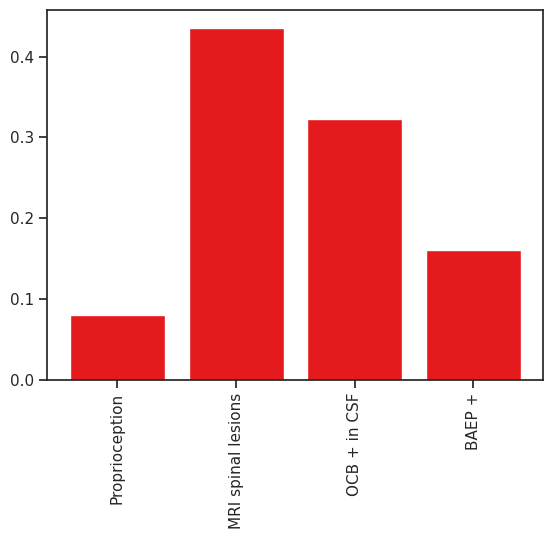

In [ ]:
importance = best_model.feature_importances_

#Summarise feature importance
for i, v in enumerate(importance):
    print('%s: %.5f' % (x_train.columns[i], v))

# Get feature names
feature_names = list(x_train.columns)

# Plot feature importances
plt.bar(feature_names, importance)
plt.xticks(rotation=90)
plt.show()


#5. Using SMOTE Upsampling

##Data Loading

In [ ]:
#Connect to GDrive to load the dataset
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
#Specify file path and load it into a DataFrame
import pandas as pd
data=pd.read_excel('/content/drive/My Drive/Colab Notebooks/Research Project/Research Project Dataset.xlsx')
df=pd.DataFrame(data)

##Data Pre-processing

Ensuring Reproducibility

In [ ]:
# Import libraries
import random
import numpy as np

#Set seed value
random.seed(42)
np.random.seed(42)

Visualising the dataset and its dimensions

In [ ]:
# Visualise the dataset
df.head(140)

,Nr,Sex,Age,Fatigue,General weakness,Pain,Focal symptoms,Cranial Nerve Symptoms,CN3,CN4,...,Pathological CSF,Increased protein,Increased protein (g/l),Pleocytosis,Pleocytosis (cells/ml),OCB + in CSF,IgG levels in CSF,VEP +,BAEP +,MS
0,2,0,56,0,0,0,1,1,0,0,...,1,0,0.37,0,4,0,,0,0,0
1,3,0,47,0,0,1,1,0,0,0,...,0,0,0.28,0,0,0,22.9,0,1,0
2,4,0,43,0,0,1,1,1,0,0,...,0,0,0.38,0,2,,25.3,1,0,0
3,5,0,39,0,0,1,0,0,0,0,...,0,,,0,1,0,,,,0
4,6,0,61,0,0,1,1,0,0,0,...,1,1,0.57,0,0,1,,1,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
133,165,0,65,0,0,0,1,0,0,0,...,,,NaN,,NaN,,,1,0,0
134,166,1,61,0,0,0,0,1,1,0,...,1,1,0.96,1,6,0,117,,,0
135,167,0,28,0,1,1,0,0,0,0,...,0,0,0.23,0,4,,,0,,1
136,169,0,22,0,0,0,1,0,0,0,...,0,0,0.16,0,4,1,14.9,0,0,1


In [ ]:
# Number of observations and features in the dataset
print(df.shape)

(138, 44)


Dropping columns not needed for the analysis

In [ ]:
# Remove unnecessary columns
df = df.drop(['Nr', 'Increased protein (g/l)', 'Pleocytosis (cells/ml)', 'Sum of symptoms'], axis=1)

Converting the data type for use by the model

In [ ]:
# Convert all columns to numeric data types
df = df.apply(pd.to_numeric, errors='coerce')

# Check the data types of columns
print(df.dtypes)

Sex                                           int64
Age                                           int64
Fatigue                                       int64
General weakness                              int64
Pain                                          int64
Focal symptoms                                int64
Cranial Nerve Symptoms                        int64
CN3                                           int64
CN4                                           int64
CN5                                           int64
CN6                                           int64
CN8                                           int64
Pathological reflexes                         int64
Babinski's                                    int64
Rossolimo                                     int64
Muscle strength                               int64
Reflex asymmetry                              int64
Muscle tone abnormalities                     int64
Proprioception                              float64
Superficial 

Impute missing data

In [ ]:
#Install library for imputation
!pip install impyute

In [ ]:
#import library for Multiple Imputation by Chained Equations (MICE)
from impyute.imputation.cs import mice

# impute missing values using MICE
imputed_data = mice(df.values)

# convert imputed data back to a pandas DataFrame
imputed_df = pd.DataFrame(imputed_data, columns=df.columns)

Specify features and target variable

In [ ]:
#Specify x and y
x = imputed_df[['Sex','MRI spinal lesions', 'MRI infratentorial lesions', 'BAEP +', 'Age', 'Pathological CSF', 'OCB + in CSF', 'IgG levels in CSF' ]]
y = imputed_df['MS']

#Print dimensions
print(x.shape)
print(y.shape)

(138, 8)
(138,)


Upsampling using SMOTE

In [ ]:
#Import libraries
from imblearn.over_sampling import SMOTE

# Upsample the minority class using SMOTE
smote = SMOTE()
x_resampled, y_resampled = smote.fit_resample(x, y)

# Print dimensions
print(x_resampled.shape)
print(y_resampled.shape)

(178, 8)
(178,)


Creating a new dataset with resampled x and y

In [ ]:
# Create a new DataFrame by concatenating x_resampled and y_resampled
new_df = pd.concat([pd.DataFrame(x_resampled, columns=x.columns), pd.DataFrame(y_resampled, columns=['MS'])], axis=1)

# Print dimensions
print(new_df.shape)

(178, 9)


Visualising Relationship between Target Variable and Each Feature in x_resampled

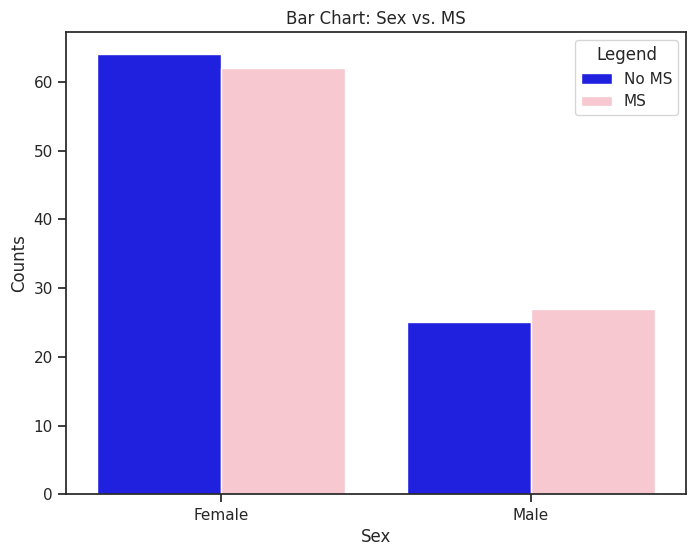

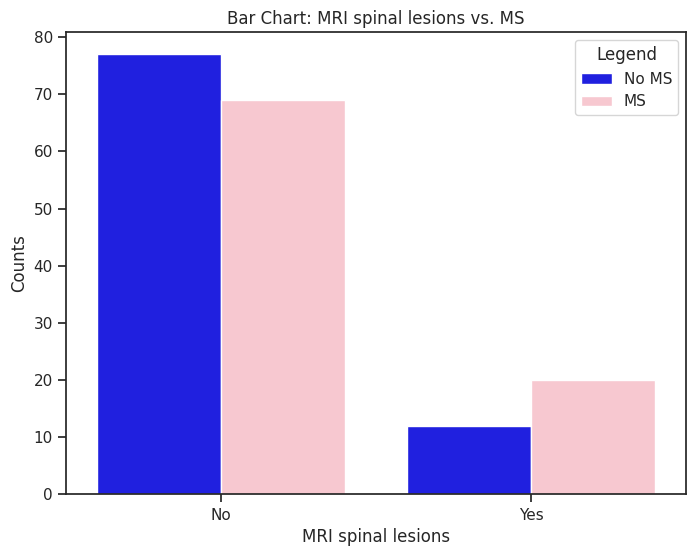

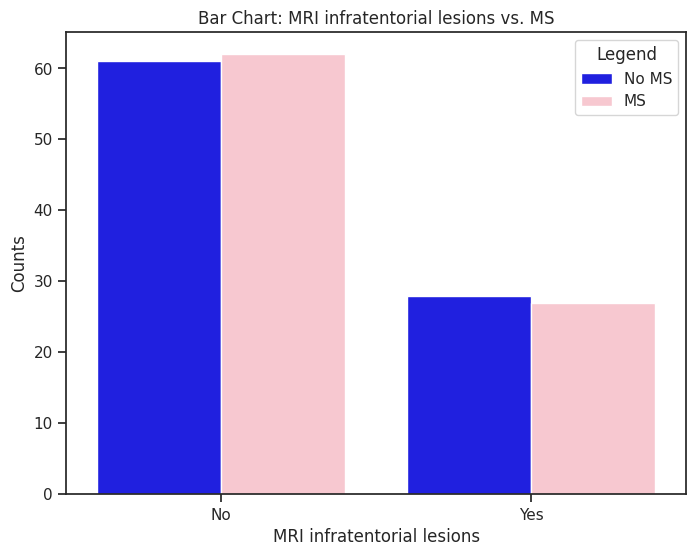

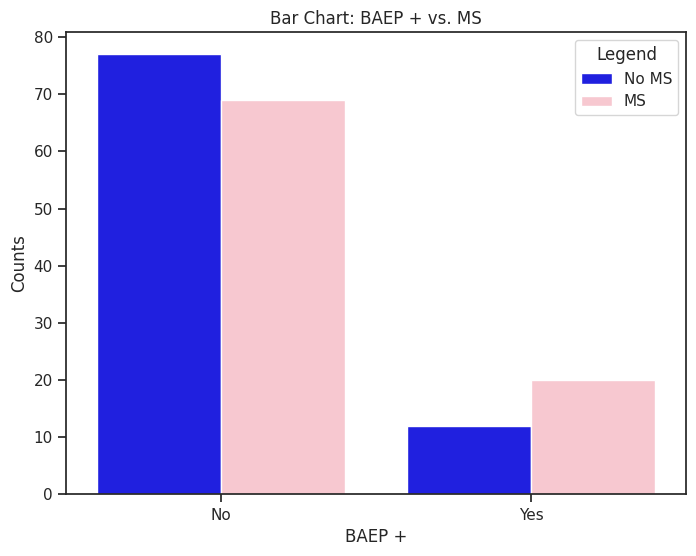

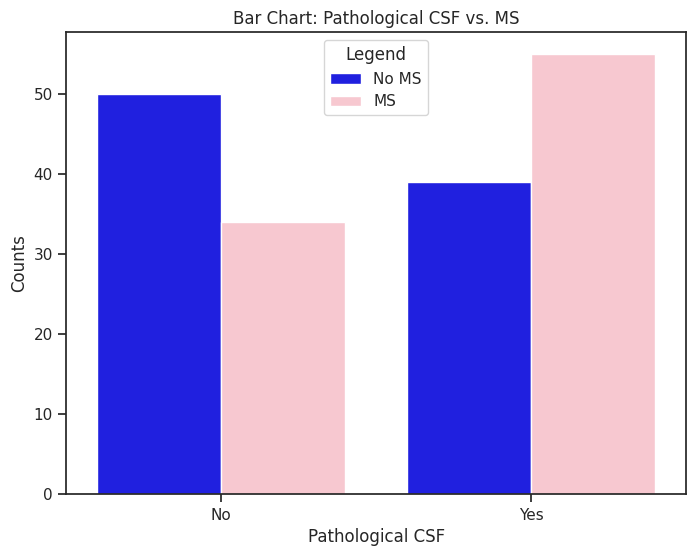

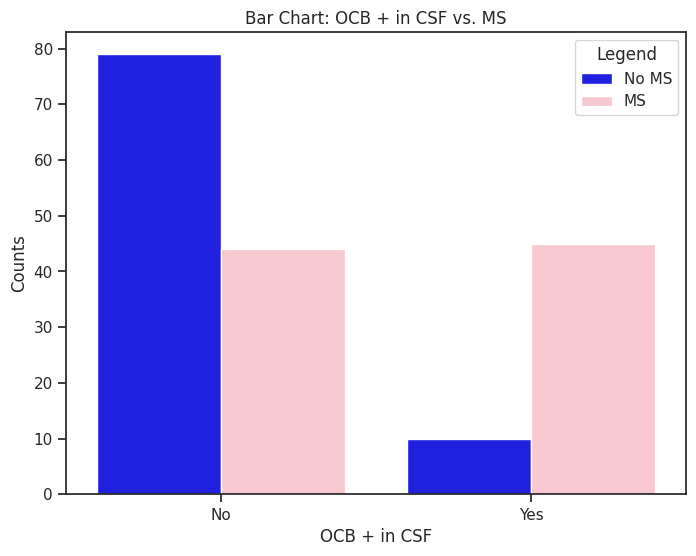

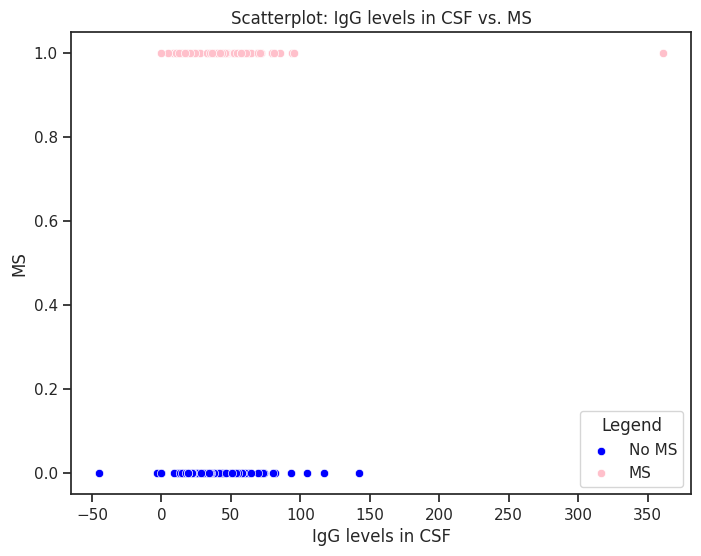

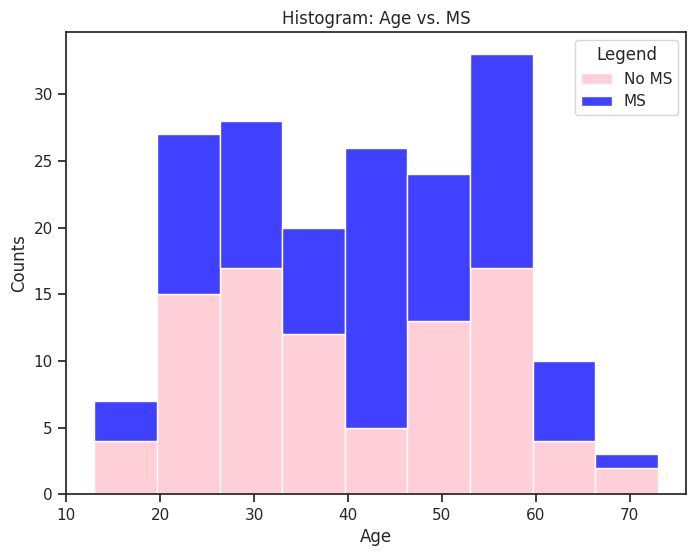

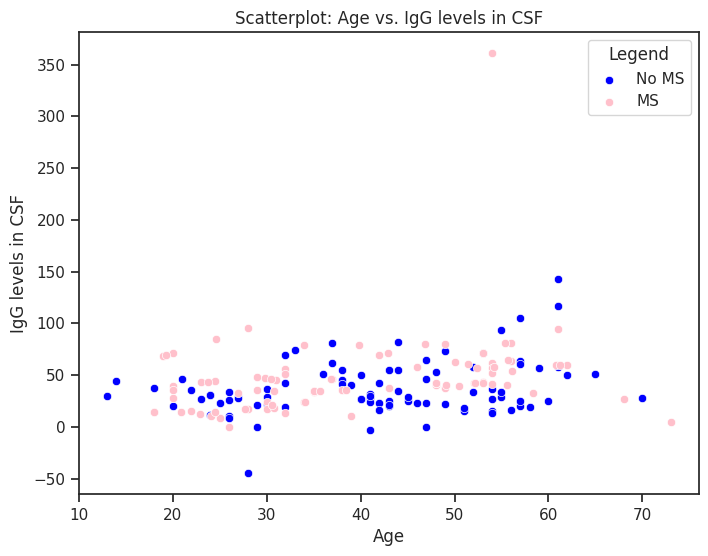

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt

# Setting style and palette for plots
sns.set(style="ticks")
sns.set_palette(["blue", "pink"])

# Define a function to convert values to 0.0 or 1.0
def convert_to_binary(value):
    if value == 0.0:
        return 0.0
    elif value == 1.0:
        return 1.0
    else:
        return 0.0

# Filter the data and convert the variables to binary values
filtered_df = new_df.copy()
filtered_df['Sex'] = filtered_df['Sex'].apply(convert_to_binary)
filtered_df['MRI infratentorial lesions'] = filtered_df['MRI infratentorial lesions'].apply(convert_to_binary)
filtered_df['MRI spinal lesions'] = filtered_df['MRI spinal lesions'].apply(convert_to_binary)
filtered_df['OCB + in CSF'] = filtered_df['OCB + in CSF'].apply(convert_to_binary)
filtered_df['BAEP +'] = filtered_df['BAEP +'].apply(convert_to_binary)
filtered_df['Pathological CSF'] = filtered_df['Pathological CSF'].apply(convert_to_binary)

# Plot Bar chart for each variable
variables = ['Sex', 'MRI spinal lesions', 'MRI infratentorial lesions', 'BAEP +', 'Pathological CSF', 'OCB + in CSF']

for variable in variables:
    plt.figure(figsize=(8, 6))
    ax = sns.countplot(x=variable, hue='MS', data=filtered_df)
    ax.set_ylabel("Counts")
    ax.set_xlabel(variable)
    if variable == 'Sex':
        ax.set_xticklabels(["Female", "Male"])
    else:
        ax.set_xticklabels(["No", "Yes"])
    plt.title(f"Bar Chart: {variable} vs. MS")
    plt.legend(title="Legend", labels=["No MS", "MS"])
    plt.show()


plt.figure(figsize=(8, 6))
sns.scatterplot(x='IgG levels in CSF', y='MS', data=filtered_df[filtered_df['MS'] == 0], color='blue', label='No MS')
sns.scatterplot(x='IgG levels in CSF', y='MS', data=filtered_df[filtered_df['MS'] == 1], color='pink', label='MS')

plt.xlabel("IgG levels in CSF")
plt.ylabel("MS")
plt.title("Scatterplot: IgG levels in CSF vs. MS")
plt.legend(title="Legend", labels=["No MS", "MS"])
plt.show()

# Plot histogram for Age against MS
plt.figure(figsize=(8, 6))
sns.histplot(data=filtered_df, x='Age', hue='MS', multiple="stack", palette=['blue', 'pink'])

plt.xlabel("Age")
plt.ylabel("Counts")
plt.title("Histogram: Age vs. MS")
plt.legend(title="Legend", labels=["No MS", "MS"])
plt.show()


plt.figure(figsize=(8, 6))
sns.scatterplot(x='Age', y='IgG levels in CSF', data=filtered_df[filtered_df['MS'] == 0], color='blue', label='No MS')
sns.scatterplot(x='Age', y='IgG levels in CSF', data=filtered_df[filtered_df['MS'] == 1], color='pink', label='MS')

plt.xlabel("Age")
plt.ylabel("IgG levels in CSF")
plt.title("Scatterplot: Age vs. IgG levels in CSF")
plt.legend(title="Legend", labels=["No MS", "MS"])
plt.show()


Visualising correlation and multicollinearity as a correlation matrix, heatmap and Seaborn plots

In [ ]:
#Plotting a correlation matrix

#Import libraries
import seaborn as sns
import matplotlib.pyplot as plt

#Calculate and print the correlation matrix
print("Correlation Matrix")
new_df.corr()

Correlation Matrix


,Sex,MRI spinal lesions,MRI infratentorial lesions,BAEP +,Age,Pathological CSF,OCB + in CSF,IgG levels in CSF,MS
Sex,1.000000,0.109013,0.006077,-0.061540,0.009299,0.225725,-0.125414,0.071676,0.127758
MRI spinal lesions,0.109013,1.000000,0.189965,0.165404,-0.245950,0.106568,0.430667,-0.027035,0.473246
MRI infratentorial lesions,0.006077,0.189965,1.000000,0.341497,0.014873,0.024185,0.136509,-0.000535,0.105868
BAEP +,-0.061540,0.165404,0.341497,1.000000,0.150485,0.283581,0.375133,0.031648,0.366106
Age,0.009299,-0.245950,0.014873,0.150485,1.000000,0.037098,-0.134537,0.270432,-0.077356
Pathological CSF,0.225725,0.106568,0.024185,0.283581,0.037098,1.000000,0.522238,0.285057,0.339450
OCB + in CSF,-0.125414,0.430667,0.136509,0.375133,-0.134537,0.522238,1.000000,0.073374,0.601830
IgG levels in CSF,0.071676,-0.027035,-0.000535,0.031648,0.270432,0.285057,0.073374,1.000000,0.149857
MS,0.127758,0.473246,0.105868,0.366106,-0.077356,0.339450,0.601830,0.149857,1.000000


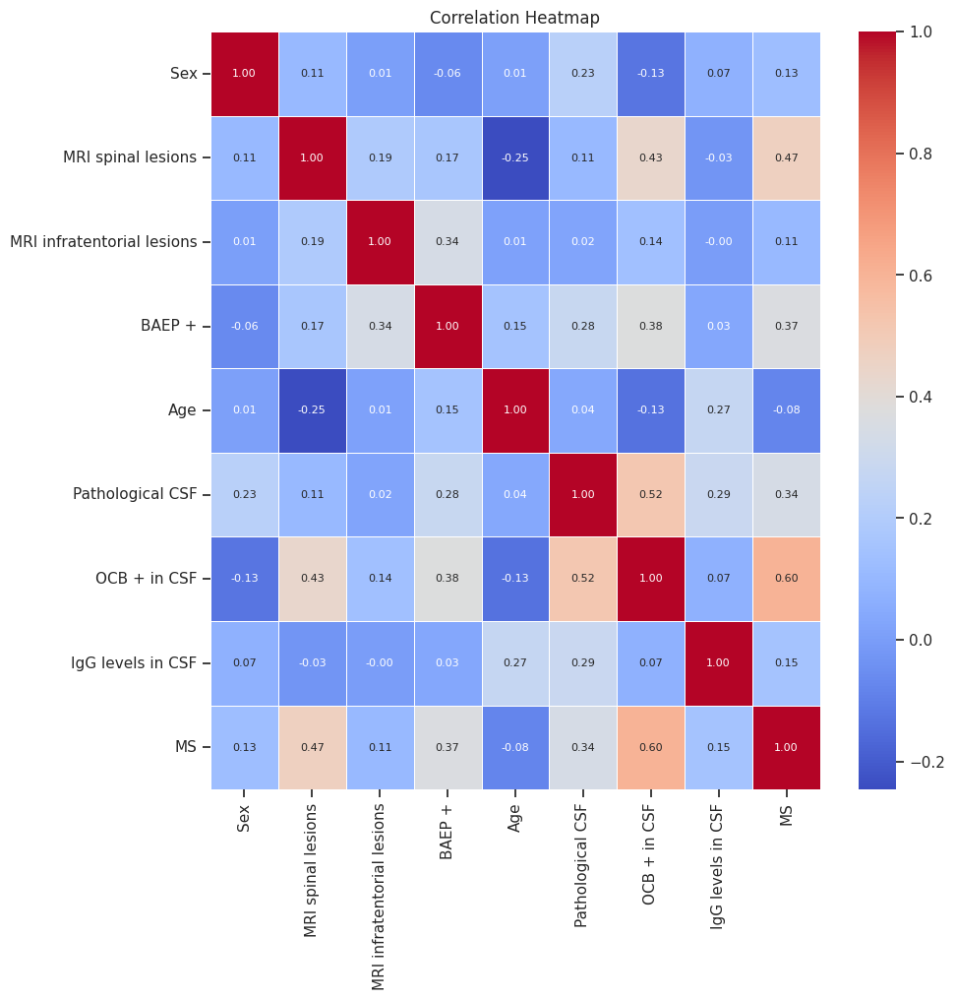

In [ ]:
#Visualise correlation and multicollinearity as a heatmap

#Import libraries
import seaborn as sns
import matplotlib.pyplot as plt

# Computing the correlation matrix
corr_matrix = new_df.corr()

# Plotting a heatmap
plt.figure(figsize=(10, 10))
sns.heatmap(corr_matrix, annot=True, cmap='coolwarm', fmt=".2f", linewidths=0.5, annot_kws={"size": 8})
plt.title("Correlation Heatmap")
plt.show()

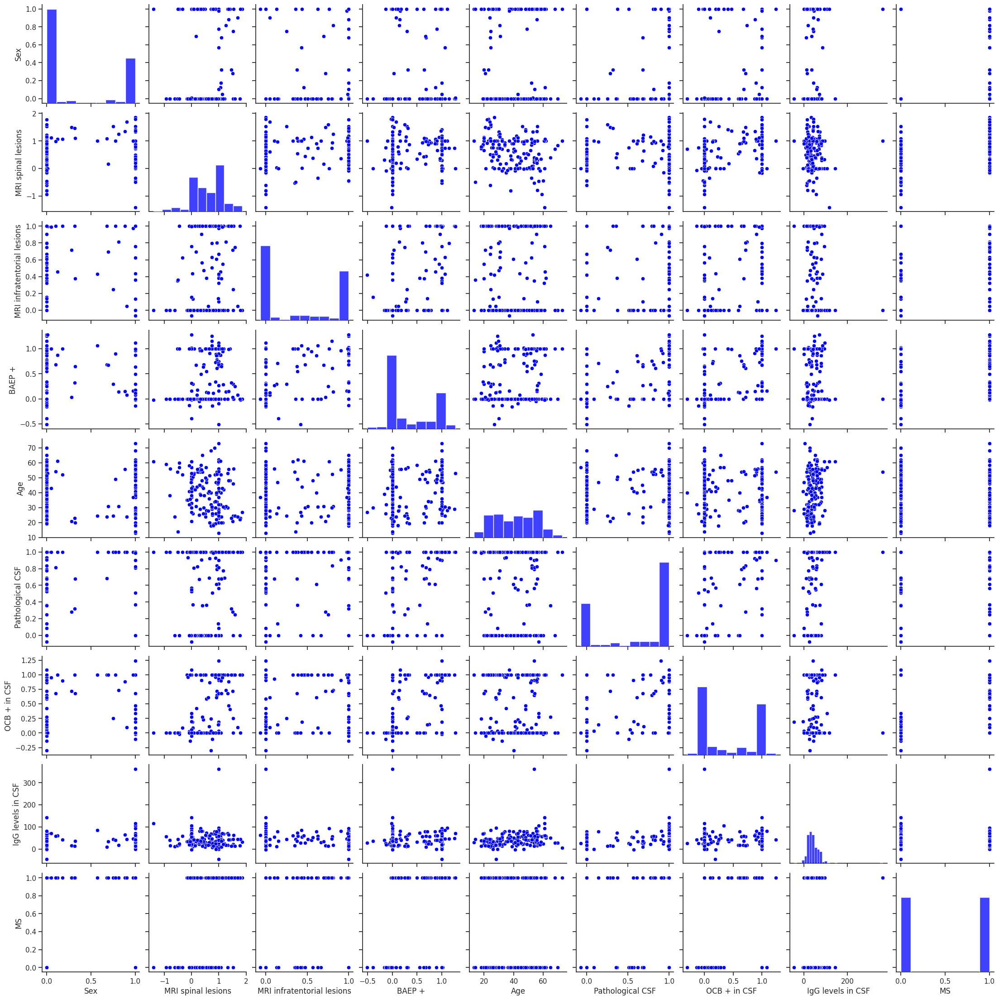

In [ ]:
# Import library
import seaborn as sns

# Set color
color = 'blue'

# Visualise plots
sns.pairplot(new_df, diag_kws={'color': color}, plot_kws={'color': color})

In [ ]:
# Print features with multicollinearity
highly_correlated_features = []
abs_corr_matrix = corr_matrix.abs()
for i in range(len(abs_corr_matrix.columns)):
    for j in range(i+1, len(abs_corr_matrix.columns)):
        if abs_corr_matrix.iloc[i, j] > 0.7:
            feature_i = abs_corr_matrix.columns[i]
            feature_j = abs_corr_matrix.columns[j]
            highly_correlated_features.append((feature_i, feature_j))

if len(highly_correlated_features) == 0:
    print("No Multicollinearity Observed")
else:
    print("Features with multicollinearity (absolute correlation coefficient > 0.7):")
    for feature_i, feature_j in highly_correlated_features:
        print(f"{feature_i} - {feature_j}")

No Multicollinearity Observed


Checking for imbalanced classes in the dataset

0.0    50.0
1.0    50.0
Name: MS, dtype: float64


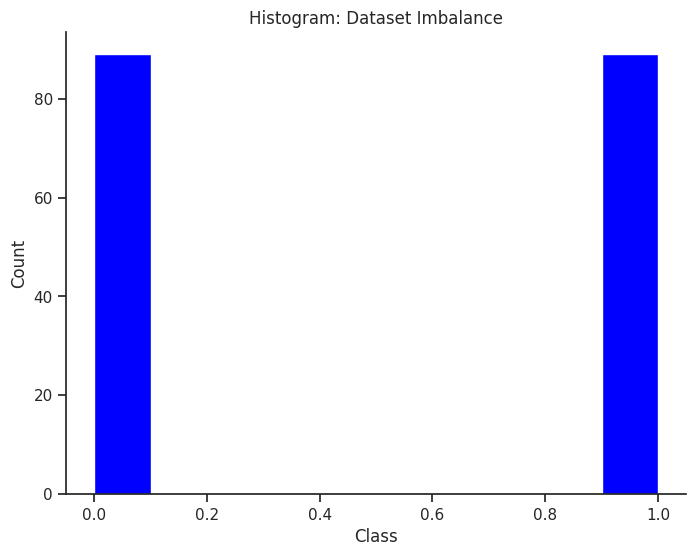

The baseline accuracy is: 0.5


In [ ]:
# Check if dataset is imbalanced
print(y_resampled.value_counts() * 100.0 / len(y_resampled))

# Visualize dataset imbalance
import matplotlib.pyplot as plt

plt.figure(figsize=(8, 6))
ax = y_resampled.hist(grid=False)
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)
ax.set_xlabel("Class")
ax.set_ylabel("Count")
plt.title("Histogram: Dataset Imbalance")
plt.show()

# Find baseline accuracy
from sklearn.dummy import DummyClassifier

clf = DummyClassifier(strategy='most_frequent')
clf.fit(x_resampled, y_resampled)
baseline_accuracy = clf.score(x_resampled, y_resampled)
print("The baseline accuracy is:", baseline_accuracy)


##Data Splitting

Split data into train and test sets

In [ ]:
#Import train_test_split function
from sklearn.model_selection import train_test_split

# Split data into train and test sets
x_train, x_test, y_train, y_test = train_test_split(x_resampled, y_resampled, test_size=0.2, random_state=1,shuffle=True)

# Print dimensions
print('x_train:', x_train.shape)
print('x_test:', x_test.shape)
print('y_train:', y_train.shape)
print('y_test:', y_test.shape)

x_train: (142, 8)
x_test: (36, 8)
y_train: (142,)
y_test: (36,)


##Importing Libraries for Following Steps

In [ ]:
# Import libraries
from sklearn.metrics import f1_score
import warnings
from sklearn.exceptions import ConvergenceWarning
import numpy as np
from sklearn.model_selection import StratifiedKFold
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import GridSearchCV

# Ignore convergence warnings
warnings.filterwarnings("ignore", category=ConvergenceWarning)

##Hyperparameter tuning

In [ ]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import GridSearchCV

# Define parameters to tune for Random Forest Classifier
rf_param_grid = {
    'n_estimators': [100, 200, 300],
    'criterion': ['gini', 'entropy'],
    'max_depth': [None, 5, 10, 15],
    'min_samples_split': [2, 5, 10],
    'min_samples_leaf': [1, 2, 4],
    'class_weight': [None, 'balanced'],
    'random_state': [None, 42]
}


##Stratified K-Fold Cross Validation:

In [ ]:
# Creating an instance of StratifiedKFold
rf_skfold = StratifiedKFold(n_splits=5, shuffle=True, random_state=1)

##Training and Model Validation:



In [ ]:
# Creating lists to store evaluation metrics for each fold
train_f1_scores = []
val_f1_scores = []

# Iterating over each fold
for train_index, val_index in rf_skfold.split(x_train, y_train):
    x_train_fold, x_val_fold = x_train.iloc[train_index], x_train.iloc[val_index]
    y_train_fold, y_val_fold = y_train.iloc[train_index], y_train.iloc[val_index]

    # Create an instance of Random Forest model
    rf = RandomForestClassifier(random_state=1)

    # Create an instance of GridSearchCV for Random Forest Classifier
    rf_cv = GridSearchCV(rf, rf_param_grid, cv=rf_skfold)

    # Fit GridSearchCV on the training fold
    rf_cv.fit(x_train_fold, y_train_fold)

    # Get the best estimator from GridSearchCV
    best_rf_model = rf_cv.best_estimator_

    # Print best parameters and F1 score
    print("Best Parameters:", rf_cv.best_params_)
    print("F1 Score:", rf_cv.best_score_)

    # Fitting the best estimator on the training fold and making predictions
    y_train_pred = best_rf_model.predict(x_train_fold)

    # Calculating F1 score for the train set
    train_f1 = f1_score(y_train_fold, y_train_pred)

    # Appending train F1 score to the list
    train_f1_scores.append(train_f1)

    # Making predictions for the validation fold
    y_val_pred = best_rf_model.predict(x_val_fold)

    # Calculating F1 score for the validation set
    val_f1 = f1_score(y_val_fold, y_val_pred)

    # Appending validation F1 score to the list
    val_f1_scores.append(val_f1)


Best Parameters: {'class_weight': None, 'criterion': 'gini', 'max_depth': 5, 'min_samples_leaf': 2, 'min_samples_split': 10, 'n_estimators': 100, 'random_state': 42}
F1 Score: 0.8059288537549408
Best Parameters: {'class_weight': 'balanced', 'criterion': 'entropy', 'max_depth': 15, 'min_samples_leaf': 1, 'min_samples_split': 2, 'n_estimators': 100, 'random_state': None}
F1 Score: 0.8584980237154151
Best Parameters: {'class_weight': 'balanced', 'criterion': 'entropy', 'max_depth': None, 'min_samples_leaf': 1, 'min_samples_split': 2, 'n_estimators': 200, 'random_state': 42}
F1 Score: 0.8505928853754939
Best Parameters: {'class_weight': None, 'criterion': 'gini', 'max_depth': 5, 'min_samples_leaf': 2, 'min_samples_split': 5, 'n_estimators': 200, 'random_state': None}
F1 Score: 0.8509881422924901
Best Parameters: {'class_weight': None, 'criterion': 'entropy', 'max_depth': None, 'min_samples_leaf': 1, 'min_samples_split': 2, 'n_estimators': 100, 'random_state': None}
F1 Score: 0.877470355731

##Average F1 Scores and Standard Deviation:

In [ ]:
# Calculating the average and standard deviation of F1 scores for train and validation sets
avg_train_f1 = np.mean(train_f1_scores)
std_train_f1 = np.std(train_f1_scores)
avg_val_f1 = np.mean(val_f1_scores)
std_val_f1 = np.std(val_f1_scores)

# Print the average and standard deviation for train and validation F1 scores
print("Average Train F1 Score:", avg_train_f1)
print("Standard Deviation of Train F1 Score:", std_train_f1)
print("Average Validation F1 Score:", avg_val_f1)
print("Standard Deviation of Validation F1 Score:", std_val_f1)


Average Train F1 Score: 0.9757266700662927
Standard Deviation of Train F1 Score: 0.03656351148264895
Average Validation F1 Score: 0.8321693121693121
Standard Deviation of Validation F1 Score: 0.03524683305238694


##Model Training and Prediction:

Using Upsampled Trained Data

In [ ]:
# Make predictions on the train set using best model
best_model = rf_cv.best_estimator_
y_train_pred = best_model.predict(x_train)

# Make predictions on the test set using best model
best_model = rf_cv.best_estimator_
y_test_pred = best_model.predict(x_test)

Using Unseen Data with x_resampled

In [ ]:
# Make predictions on the train set using best model
best_model = rf_cv.best_estimator_
y_train_pred = best_model.predict(x_resampled)

# Make predictions on the test set using best model
best_model = rf_cv.best_estimator_
y_test_pred = best_model.predict(x_test)

##Visualise Various Classification Metrics

Using Upsampled Trained Data

In [ ]:
#Print Classification Report
from sklearn.metrics import classification_report
print("Classification Report of Train Data:")
print(classification_report(y_train, y_train_pred))

print()

print("Classification Report of Test Data: ")
print(classification_report(y_test, y_test_pred))


Classification Report of Train Data:


ValueError: ignored

Using Unseen Data with x_resampled

In [ ]:
#Print Classification Report
from sklearn.metrics import classification_report
print("Classification Report of Train Data:")
print(classification_report(y_resampled, y_train_pred))

print()

print("Classification Report of Test Data: ")
print(classification_report(y_test, y_test_pred))


Classification Report of Train Data:
              precision    recall  f1-score   support

         0.0       0.96      0.92      0.94        89
         1.0       0.92      0.97      0.95        89

    accuracy                           0.94       178
   macro avg       0.94      0.94      0.94       178
weighted avg       0.94      0.94      0.94       178


Classification Report of Test Data: 
              precision    recall  f1-score   support

         0.0       0.88      0.88      0.88        16
         1.0       0.90      0.90      0.90        20

    accuracy                           0.89        36
   macro avg       0.89      0.89      0.89        36
weighted avg       0.89      0.89      0.89        36



Using Upsampled Trained Data

Text(0.5, 1.0, 'Confusion Matrix of Test Data')

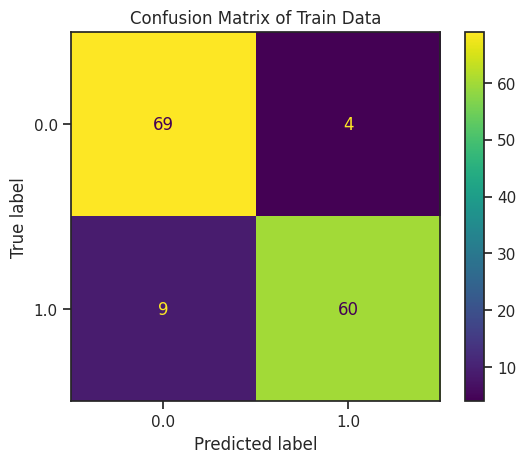

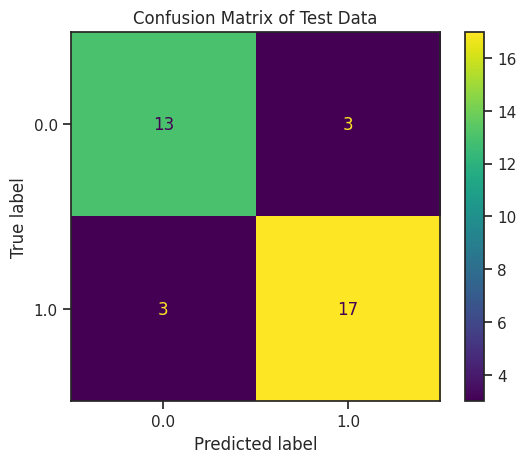

In [ ]:
#Plot Confusion Matrix for Train and Test Data
from sklearn.metrics import ConfusionMatrixDisplay
import matplotlib.pyplot as plt

#Confusion Matrix of Train Data
ConfusionMatrixDisplay.from_predictions(y_train, y_train_pred)
plt.title('Confusion Matrix of Train Data')

#Confusion Matrix of Test Data
ConfusionMatrixDisplay.from_predictions(y_test, y_test_pred)
plt.title('Confusion Matrix of Test Data')

Using Unseen Data with x_resampled

Text(0.5, 1.0, 'Confusion Matrix of Test Data')

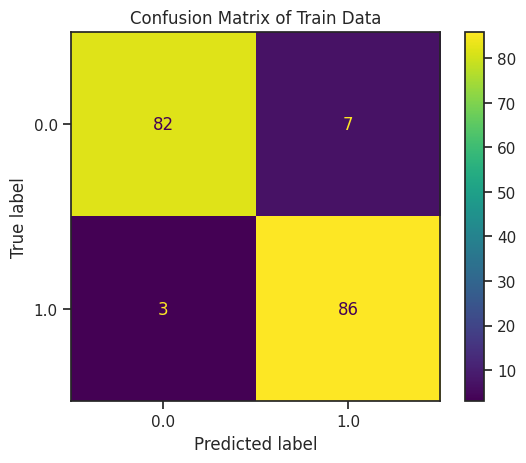

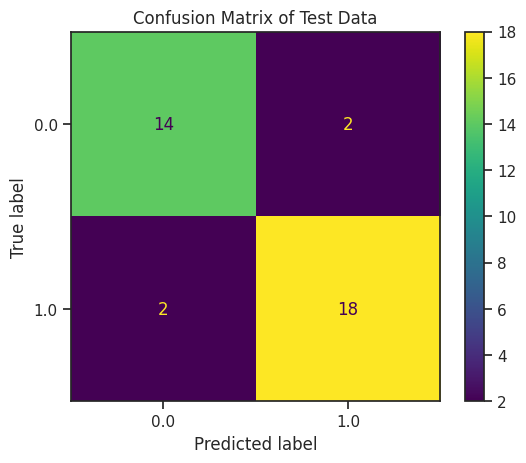

In [ ]:
#Plot Confusion Matrix for Train and Test Data
from sklearn.metrics import ConfusionMatrixDisplay
import matplotlib.pyplot as plt

#Confusion Matrix of Train Data
ConfusionMatrixDisplay.from_predictions(y_resampled, y_train_pred)
plt.title('Confusion Matrix of Train Data')

#Confusion Matrix of Test Data
ConfusionMatrixDisplay.from_predictions(y_test, y_test_pred)
plt.title('Confusion Matrix of Test Data')

Using Upsampled Trained Data

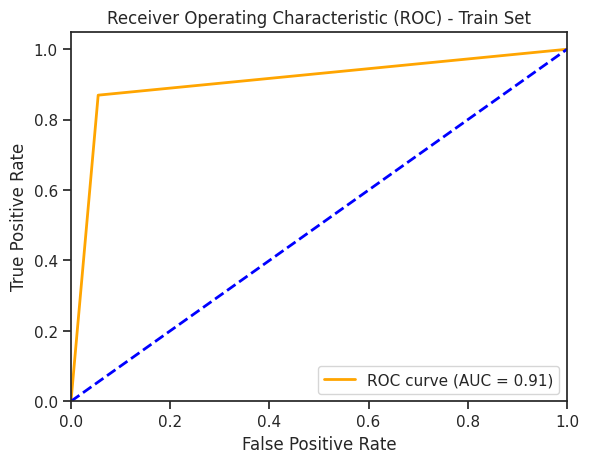

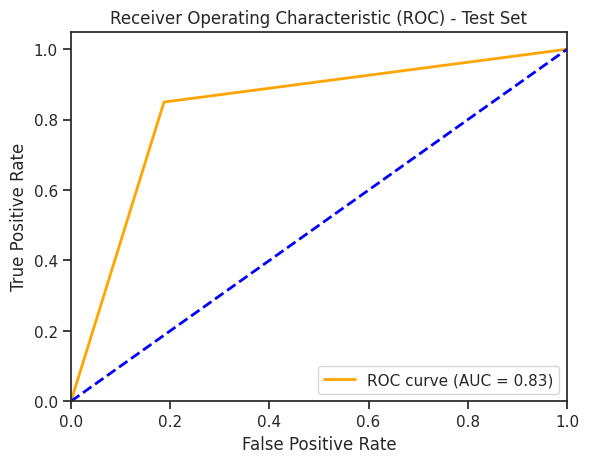

In [ ]:
#Plot ROC Curve for Train and Test Data
import matplotlib.pyplot as plt
from sklearn.metrics import roc_curve
from sklearn.metrics import auc

# Map actual "YES" and "NO" values to 1 and 0 respectively
mapping = {1.0: 1, 0.0: 0}
y_train_mapped = [mapping[val] for val in y_train]
y_test_mapped = [mapping[val] for val in y_test]

# Map predicted "YES" and "NO" values to 1 and 0 respectively
y_train_pred_mapped = [mapping[val] for val in y_train_pred]
y_test_pred_mapped = [mapping[val] for val in y_test_pred]

# ROC curve and AUC for train data
fpr_train, tpr_train, thresholds_train = roc_curve(y_train_mapped, y_train_pred_mapped)
roc_auc_train = auc(fpr_train, tpr_train)

# ROC curve and AUC for test data
fpr_test, tpr_test, thresholds_test = roc_curve(y_test_mapped, y_test_pred_mapped)
roc_auc_test = auc(fpr_test, tpr_test)

# Plot ROC curve for train data
plt.figure()
plt.plot(fpr_train, tpr_train, color='orange', lw=2, label='ROC curve (AUC = %0.2f)' % roc_auc_train)
plt.plot([0, 1], [0, 1], color='blue', lw=2, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) - Train Set')
plt.legend(loc="lower right")

# Plot ROC curve for test data
plt.figure()
plt.plot(fpr_test, tpr_test, color='orange', lw=2, label='ROC curve (AUC = %0.2f)' % roc_auc_test)
plt.plot([0, 1], [0, 1], color='blue', lw=2, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) - Test Set')
plt.legend(loc="lower right")

plt.show()

Using Unseen Data with x_resampled

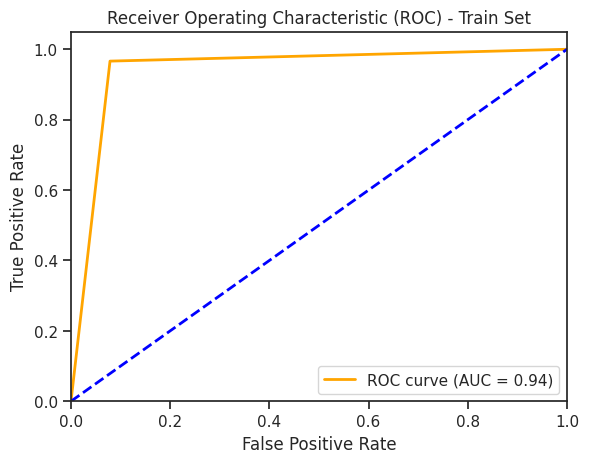

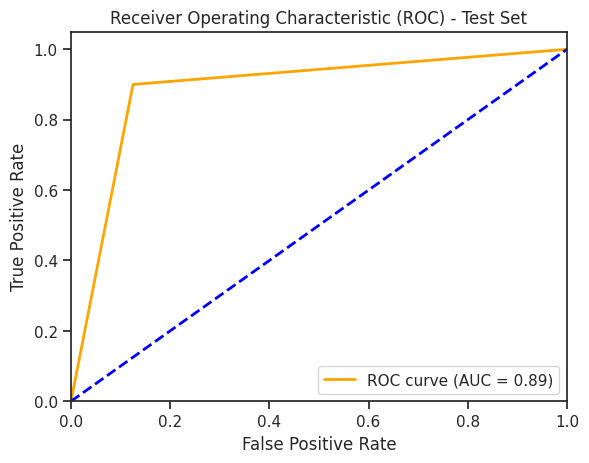

In [ ]:
import matplotlib.pyplot as plt
from sklearn.metrics import roc_curve, auc

# Map actual "YES" and "NO" values to 1 and 0 respectively
mapping = {1.0: 1, 0.0: 0}
y_train_mapped = [mapping[val] for val in y_resampled]  # Use y_resampled instead of y_train
y_test_mapped = [mapping[val] for val in y_test]

# Map predicted "YES" and "NO" values to 1 and 0 respectively
y_train_pred_mapped = [mapping[val] for val in y_train_pred]
y_test_pred_mapped = [mapping[val] for val in y_test_pred]

# ROC curve and AUC for train data
fpr_train, tpr_train, thresholds_train = roc_curve(y_train_mapped, y_train_pred_mapped)
roc_auc_train = auc(fpr_train, tpr_train)

# ROC curve and AUC for test data
fpr_test, tpr_test, thresholds_test = roc_curve(y_test_mapped, y_test_pred_mapped)
roc_auc_test = auc(fpr_test, tpr_test)

# Plot ROC curve for train data
plt.figure()
plt.plot(fpr_train, tpr_train, color='orange', lw=2, label='ROC curve (AUC = %0.2f)' % roc_auc_train)
plt.plot([0, 1], [0, 1], color='blue', lw=2, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) - Train Set')
plt.legend(loc="lower right")

# Plot ROC curve for test data
plt.figure()
plt.plot(fpr_test, tpr_test, color='orange', lw=2, label='ROC curve (AUC = %0.2f)' % roc_auc_test)
plt.plot([0, 1], [0, 1], color='blue', lw=2, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) - Test Set')
plt.legend(loc="lower right")

plt.show()


##Calculate Feature Importance Scores

Using Upsampled Trained Data

Proprioception: 0.08944
MRI spinal lesions: 0.35924
OCB + in CSF: 0.41315
BAEP +: 0.13817


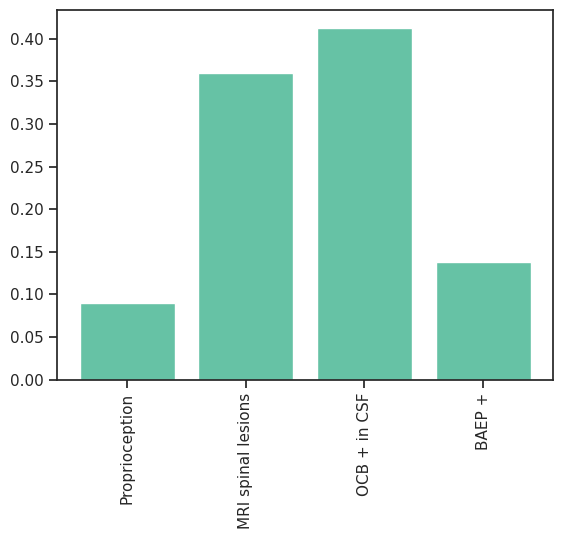

In [ ]:
importance = best_model.feature_importances_

#Summarise feature importance
for i, v in enumerate(importance):
    print('%s: %.5f' % (x_train.columns[i], v))

# Get feature names
feature_names = list(x_train.columns)

# Plot feature importances
plt.bar(feature_names, importance)
plt.xticks(rotation=90)
plt.show()


Using Unseen Data with x_resampled

Sex: 0.08847
MRI spinal lesions: 0.19980
MRI infratentorial lesions: 0.06669
BAEP +: 0.10930
Age: 0.10843
Pathological CSF: 0.08431
OCB + in CSF: 0.18760
IgG levels in CSF: 0.15539


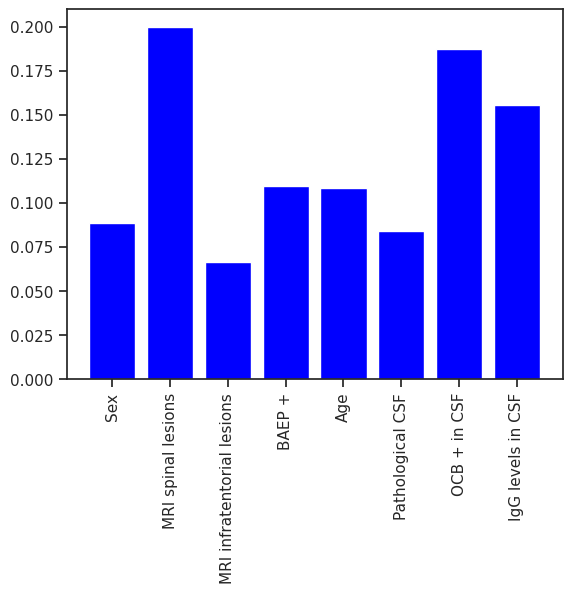

In [ ]:
importance = best_model.feature_importances_

#Summarise feature importance
for i, v in enumerate(importance):
    print('%s: %.5f' % (x_train.columns[i], v))

# Get feature names
feature_names = list(x_train.columns)

# Plot feature importances
plt.bar(feature_names, importance)
plt.xticks(rotation=90)
plt.show()


#6. Testing on Mexican Dataset

In [ ]:
#Connect to GDrive to load the dataset
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
#Specify file paths and load them into DataFrames
import pandas as pd
train_data=pd.read_excel('/content/drive/My Drive/Colab Notebooks/Research Project/Research Project Dataset.xlsx')
df_train=pd.DataFrame(train_data)
test_data=pd.read_excel('/content/drive/My Drive/Colab Notebooks/Research Project/Updated Mexican Research Dataset.xlsx')
df_test=pd.DataFrame(test_data)

##Data Pre-processing

Ensuring Reproducibility

In [ ]:
# Import libraries
import random
import numpy as np

#Set seed value
random.seed(42)
np.random.seed(42)

Visualising the datasets and their dimensions

In [ ]:
# Visualise the train dataset
df_train.head(400)

,Nr,Sex,Age,Fatigue,General weakness,Pain,Focal symptoms,Cranial Nerve Symptoms,CN3,CN4,...,Pathological CSF,Increased protein,Increased protein (g/l),Pleocytosis,Pleocytosis (cells/ml),OCB + in CSF,IgG levels in CSF,VEP +,BAEP +,MS
0,2,0,56,0,0,0,1,1,0,0,...,1,0,0.37,0,4,0,,0,0,0
1,3,0,47,0,0,1,1,0,0,0,...,0,0,0.28,0,0,0,22.9,0,1,0
2,4,0,43,0,0,1,1,1,0,0,...,0,0,0.38,0,2,,25.3,1,0,0
3,5,0,39,0,0,1,0,0,0,0,...,0,,,0,1,0,,,,0
4,6,0,61,0,0,1,1,0,0,0,...,1,1,0.57,0,0,1,,1,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
133,165,0,65,0,0,0,1,0,0,0,...,,,NaN,,NaN,,,1,0,0
134,166,1,61,0,0,0,0,1,1,0,...,1,1,0.96,1,6,0,117,,,0
135,167,0,28,0,1,1,0,0,0,0,...,0,0,0.23,0,4,,,0,,1
136,169,0,22,0,0,0,1,0,0,0,...,0,0,0.16,0,4,1,14.9,0,0,1


In [ ]:
# Visualise the test dataset
df_test.head(400)

,Nr,Sex,Age,OCB + in CSF,VEP +,BAEP +,Periventricular,MRI spinal lesions,MRI infratentorial lesions,MS
0,1,1,34,0.0,0,0,0,1,0,1
1,2,1,61,1.0,1,0,0,1,0,1
2,3,1,22,1.0,0,0,0,0,0,1
3,4,0,41,1.0,1,0,1,0,0,1
4,5,0,34,0.0,0,0,1,0,0,1
...,...,...,...,...,...,...,...,...,...,...
267,268,0,31,0.0,0,0,0,0,0,0
268,269,1,21,1.0,0,0,0,1,0,0
269,270,0,19,0.0,1,0,0,1,0,0
270,271,0,32,1.0,1,0,1,0,1,0


In [ ]:
# Number of observations and features in both datasets
print("The train dataset dimensions are: ")
print(df_train.shape)
print("The test dataset dimensions are: ")
print(df_test.shape)

The train dataset dimensions are: 
(138, 44)
The test dataset dimensions are: 
(272, 10)


Dropping columns not needed for the analysis

In [ ]:
# Remove unnecessary columns from train dataset
df_train = df_train.drop(['Nr', 'Fatigue', 'Age',	'General weakness',	'Pain',	'Focal symptoms',	'Cranial Nerve Symptoms','CN3',	'CN4'	,'CN5',	'CN6',	'CN8',	'Pathological reflexes',	"Babinski's",	'Rossolimo',	'Muscle strength',	'Reflex asymmetry',	'Muscle tone abnormalities',	'Proprioception',	'Superficial sensation',	'Coordination',	'Balance',	'Urinary incontinence',	'Urine retention',	'Vertigo',	'Sum of symptoms',	'MRI lesions specific to MS',	'MRI lesions indicative of other diseases',	'Unspecified MRI lesions',	'MRI infratentorial lesions',	'Periventricular',	'Juxtacortical',		'Pathological CSF','Increased protein', 'Increased protein (g/l)',	'Pleocytosis',	'Pleocytosis (cells/ml)',		'IgG levels in CSF',	'VEP +'		], axis=1)


In [ ]:
# Remove unnecessary columns from test dataset
df_test = df_test.drop(['Nr','VEP +','Age', 'Periventricular', 'MRI infratentorial lesions'], axis=1)

Converting the data type for use by the model

In [ ]:
# Convert all columns to numeric data types
df_train = df_train.apply(pd.to_numeric, errors='coerce')
df_test = df_test.apply(pd.to_numeric, errors='coerce')

# Check the data types of columns
print("Data types of Train Dataset Columns: ")
print(df_train.dtypes)
print()
print("Data types of Test Dataset Columns: ")
print(df_train.dtypes)

Data types of Train Dataset Columns: 
Sex                     int64
MRI spinal lesions    float64
OCB + in CSF          float64
BAEP +                float64
MS                      int64
dtype: object

Data types of Test Dataset Columns: 
Sex                     int64
MRI spinal lesions    float64
OCB + in CSF          float64
BAEP +                float64
MS                      int64
dtype: object


Impute missing data

In [ ]:
#Install library for imputation
!pip install impyute

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [ ]:
#import library for Multiple Imputation by Chained Equations (MICE)
from impyute.imputation.cs import mice

# impute missing values using MICE
imputed_train = mice(df_train.values)
imputed_test = mice(df_test.values)

# convert imputed data back to a pandas DataFrame
imputed_df_train = pd.DataFrame(imputed_train, columns=df_train.columns)
imputed_df_test = pd.DataFrame(imputed_test, columns=df_test.columns)

Specify features and target variable

In [ ]:
#Specify x and y in both datasets
x_train =imputed_df_train[['Sex','MRI spinal lesions', 'BAEP +', 'OCB + in CSF']]  # Features in Dataset 1
y_train =imputed_df_train['MS']  # Target variable in Dataset 1

x_test = imputed_df_test[['Sex', 'MRI spinal lesions', 'BAEP +', 'OCB + in CSF']]  # Features in Dataset 2
y_test = imputed_df_test['MS']  # Target variable in Dataset 2


#Print train dimensions
print(x_train.shape)
print(y_train.shape)

#Print test dimensions
print(x_test.shape)
print(y_test.shape)

(138, 4)
(138,)
(272, 4)
(272,)


Visualising Relationship between Target Variable and Each Feature in x

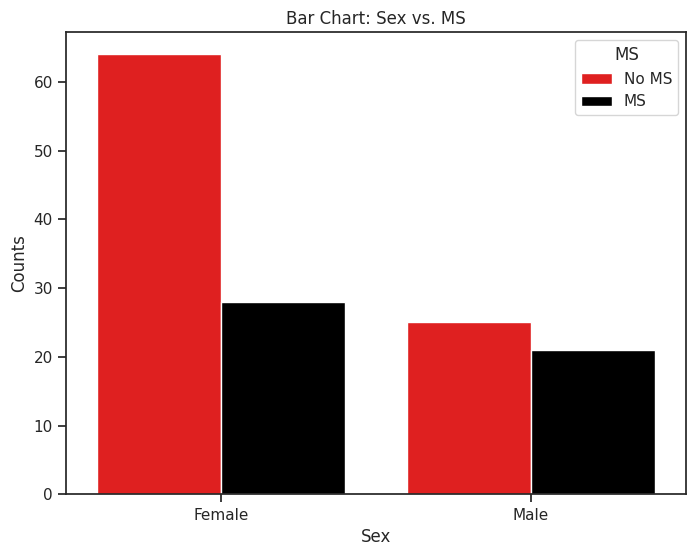

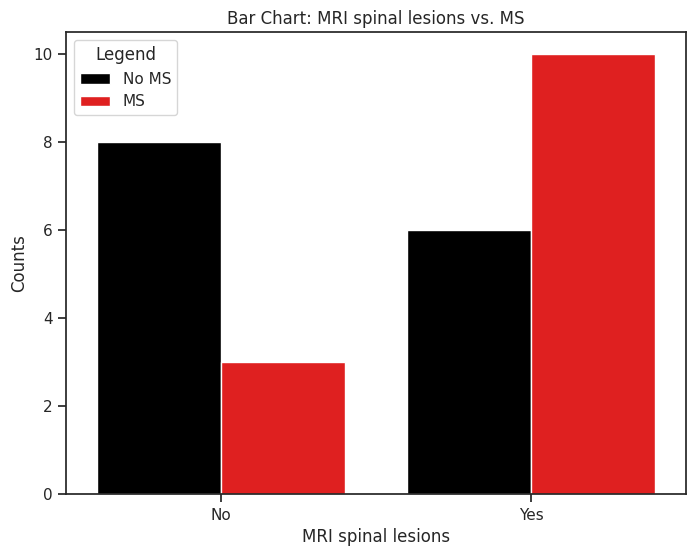

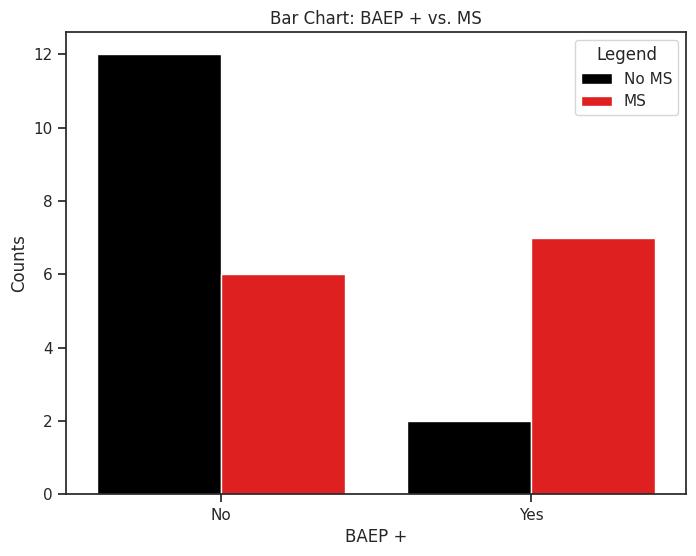

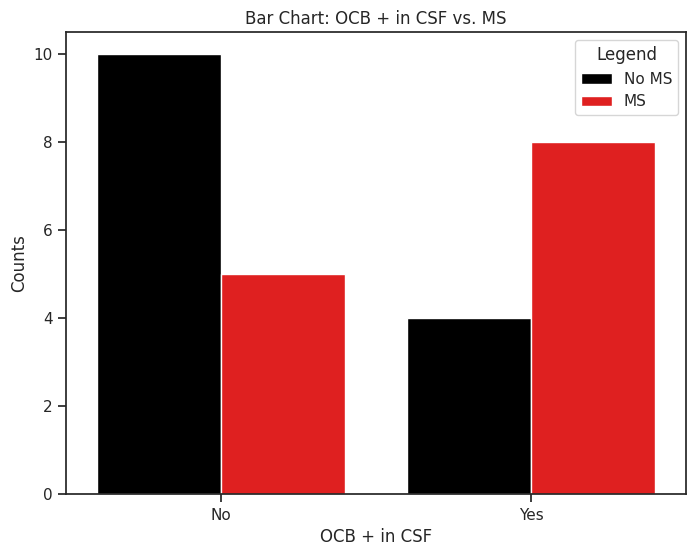

KeyError: ignored

<Figure size 800x600 with 0 Axes>

In [ ]:
#Import libraries
import seaborn as sns
import matplotlib.pyplot as plt

# Filter the data
filtered_df = imputed_df_train.copy()
filtered_df = filtered_df.dropna()

# Convert Sex values to strings
filtered_df['Sex'] = filtered_df['Sex'].replace({0.0: 'Female', 1.0: 'Male'})

# Plot bar graph
plt.figure(figsize=(8, 6))
sns.countplot(x='Sex', hue='MS', data=filtered_df, palette={"black", "red"})

plt.xlabel("Sex")
plt.ylabel("Counts")
plt.title("Bar Chart: Sex vs. MS")
plt.legend(title="MS", labels=["No MS", "MS"])

# Set x-axis tick labels
plt.xticks([0, 1], ["Female", "Male"])

plt.show()

# Setting style and palette for plots
sns.set(style="ticks")
sns.set_palette(["black", "red"])

# Define a function to convert values to 0.0 or 1.0
def convert_to_binary(value):
    if value == 0.0:
        return 0.0
    elif value == 1.0:
        return 1.0
    else:
        return None

# Filter the data and convert the variables to binary values
filtered_df = imputed_df_train.copy()
filtered_df['MRI spinal lesions'] = filtered_df['MRI spinal lesions'].apply(convert_to_binary)
filtered_df['OCB + in CSF'] = filtered_df['OCB + in CSF'].apply(convert_to_binary)
filtered_df['BAEP +'] = filtered_df['BAEP +'].apply(convert_to_binary)

# Remove rows with null values
filtered_df = filtered_df.dropna()

# Plot Bar chart for each variable
variables = ['MRI spinal lesions', 'BAEP +', 'OCB + in CSF']

for variable in variables:
    plt.figure(figsize=(8, 6))
    ax = sns.countplot(x=variable, hue='MS', data=filtered_df)
    ax.set_ylabel("Counts")
    ax.set_xlabel(variable)
    ax.set_xticks([0, 1])
    ax.set_xticklabels(["No", "Yes"])
    plt.title(f"Bar Chart: {variable} vs. MS")
    plt.legend(title="Legend", labels=["No MS", "MS"])
    plt.show()

# Create separate histograms for 'No MS' and 'MS' labels
plt.figure(figsize=(8, 6))
sns.histplot(filtered_df[filtered_df['MS'] == 0]['Age'], color='black', label='No MS', kde=True)
sns.histplot(filtered_df[filtered_df['MS'] == 1]['Age'], color='red', label='MS', kde=True)

plt.xlabel("Age")
plt.ylabel("Counts")
plt.title("Histogram: Age Distribution")
plt.legend(title="Legend", labels=["No MS", "MS"])
plt.show()


Visualising correlation and multicollinearity in the train dataset (x) as a correlation matrix, heatmap and Seaborn plots

In [ ]:
# Import libraries
import pandas as pd

# Calculate the correlation matrix
corr_matrix = imputed_df_train[['Sex', 'Age', 'BAEP +', 'MRI spinal lesions', 'OCB + in CSF', 'MS']].corr()

# Display the correlation table
corr_table = corr_matrix.style.set_properties(**{'background-color': 'transparent'})

# Display the correlation table
print("Correlation Matrix: ")
corr_table

Correlation Matrix: 


,Sex,Age,BAEP +,MRI spinal lesions,OCB + in CSF,MS
Sex,1.000000,0.016061,0.026913,0.210997,-0.114310,0.149906
Age,0.016061,1.000000,0.188645,-0.318599,-0.165114,-0.068102
BAEP +,0.026913,0.188645,1.000000,0.151879,0.323261,0.351629
MRI spinal lesions,0.210997,-0.318599,0.151879,1.000000,0.702202,0.621969
OCB + in CSF,-0.114310,-0.165114,0.323261,0.702202,1.000000,0.593883
MS,0.149906,-0.068102,0.351629,0.621969,0.593883,1.000000


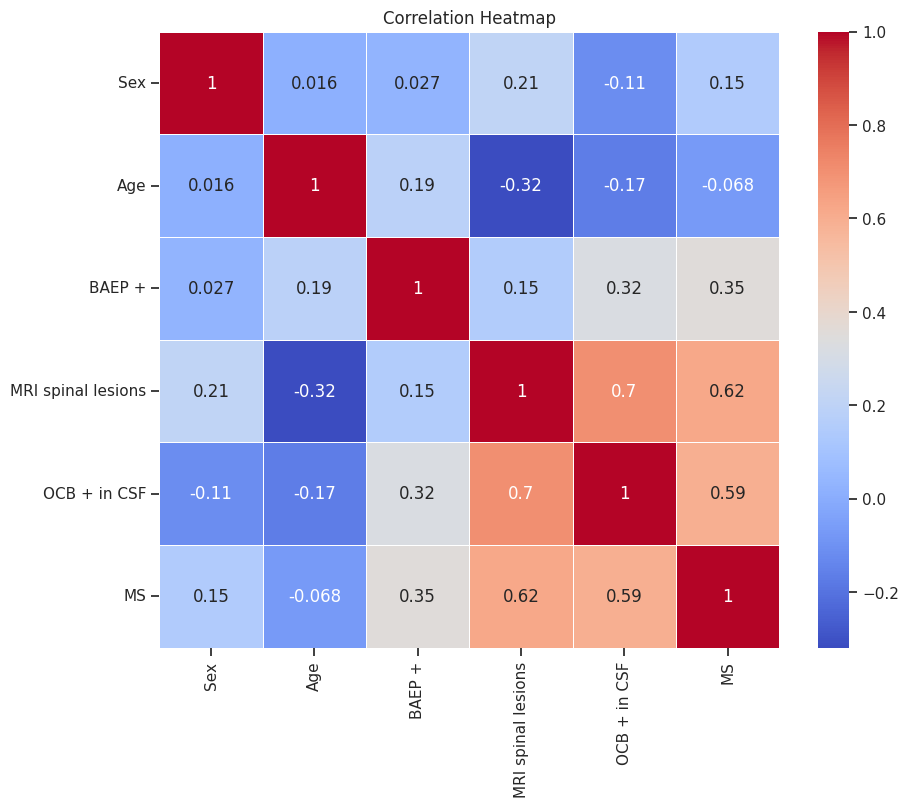

In [ ]:
#Import libraries
import seaborn as sns
import matplotlib.pyplot as plt

# Calculate the correlation matrix
corr_matrix = imputed_df_train[['Sex', 'BAEP +', 'MRI spinal lesions', 'OCB + in CSF', 'MS']].corr()

# Plot the correlation matrix using a heatmap
plt.figure(figsize=(10, 8))
sns.heatmap(corr_matrix, annot=True, cmap='coolwarm', linewidths=0.5)
plt.title('Correlation Heatmap')
plt.xticks(rotation=90)
plt.yticks(rotation=0)
plt.show()


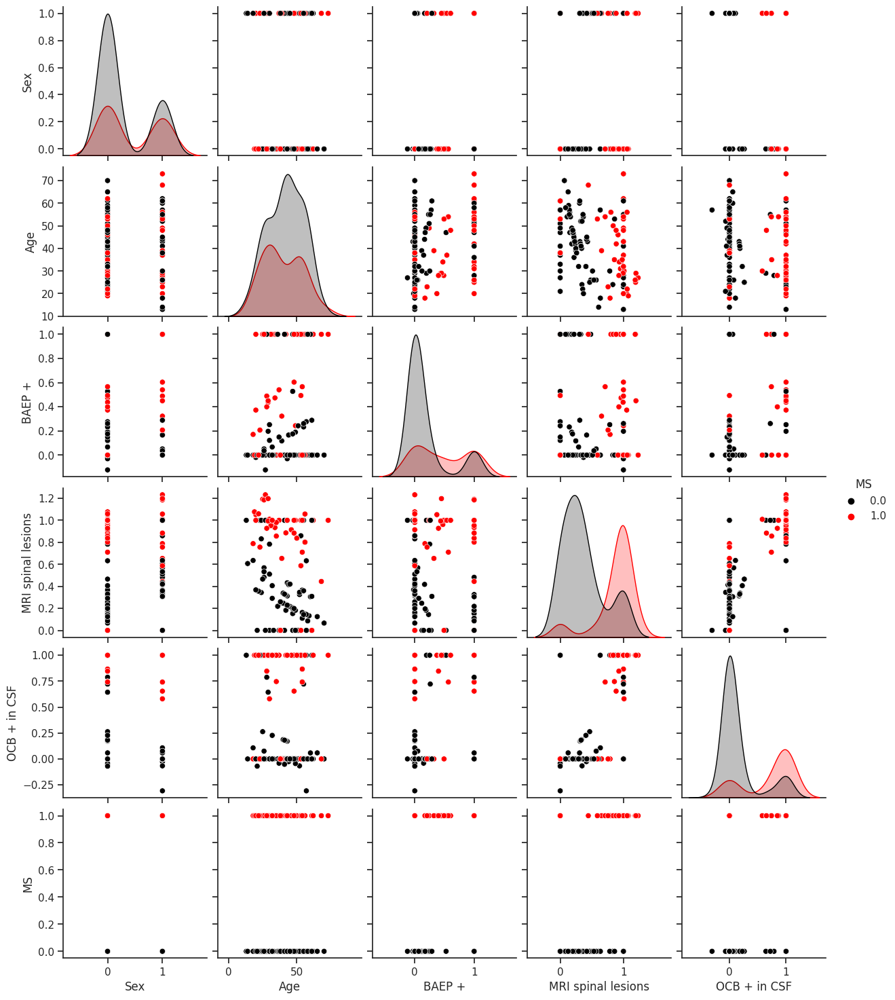

In [ ]:
# Import libraries
import seaborn as sns
import matplotlib.pyplot as plt

# Specify the features and target variable
selected_features = ['Sex', 'Age', 'BAEP +', 'MRI spinal lesions', 'OCB + in CSF']
target_variable = 'MS'

# Concatenate the selected features and the target variable
data = imputed_df_train[selected_features + [target_variable]]

# Plot pairwise relationships
sns.pairplot(data, x_vars=selected_features, y_vars=selected_features + [target_variable], hue=target_variable)
plt.show()


In [ ]:
# Print features with multicollinearity
highly_correlated_features = []
abs_corr_matrix = imputed_df_train[selected_features].corr().abs()

for i in range(len(abs_corr_matrix.columns)):
    for j in range(i + 1, len(abs_corr_matrix.columns)):
        if abs_corr_matrix.iloc[i, j] > 0.7:
            feature_i = abs_corr_matrix.columns[i]
            feature_j = abs_corr_matrix.columns[j]
            highly_correlated_features.append((feature_i, feature_j))

if len(highly_correlated_features) == 0:
    print("No Multicollinearity Observed")
else:
    print("Features with multicollinearity (absolute correlation coefficient > 0.7):")
    for feature_i, feature_j in highly_correlated_features:
        print(f"{feature_i} - {feature_j}")


Features with multicollinearity (absolute correlation coefficient > 0.7):
MRI spinal lesions - OCB + in CSF


Checking for imbalanced classes in the dataset

0.0    64.492754
1.0    35.507246
Name: MS, dtype: float64


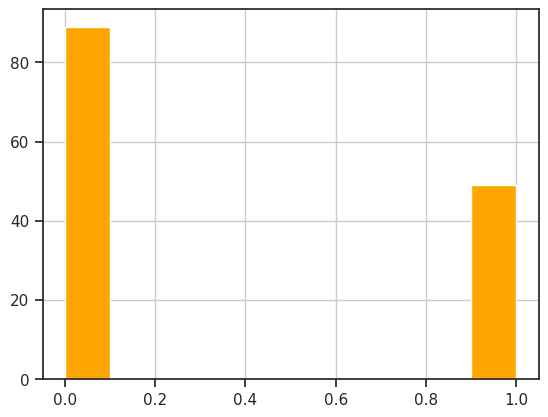

The baseline accuracy is: 0.644927536231884


In [ ]:
# Check if dataset is imbalanced
print(imputed_df_train['MS'].value_counts() * 100.0 / len(imputed_df_train['MS']))

# Visualise dataset imbalance
import matplotlib.pyplot as plt
imputed_df_train['MS'].hist(color='orange')
plt.show()

# Find baseline accuracy
from sklearn.dummy import DummyClassifier

features = imputed_df_train[selected_features]
outcome = imputed_df_train['MS']

clf = DummyClassifier(strategy='most_frequent')
clf.fit(features, outcome)
baseline_accuracy = clf.score(features, outcome)
print("The baseline accuracy is:", baseline_accuracy)


#Data splitting not done as y is a new dataset

##Importing Libraries for Following Steps

In [ ]:
# Import libraries
from sklearn.metrics import f1_score
import warnings
from sklearn.exceptions import ConvergenceWarning
import numpy as np
from sklearn.model_selection import StratifiedKFold
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import GridSearchCV

# Ignore convergence warnings
warnings.filterwarnings("ignore", category=ConvergenceWarning)

##Hyperparameter tuning

In [ ]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import GridSearchCV

# Define parameters to tune for Random Forest Classifier
rf_param_grid = {
    'n_estimators': [100, 200, 300],
    'criterion': ['gini', 'entropy'],
    'max_depth': [None, 5, 10, 15],
    'min_samples_split': [2, 5, 10],
    'min_samples_leaf': [1, 2, 4],
    'class_weight': [None, 'balanced'],
    'random_state': [None, 42]
}


##Stratified K-Fold Cross Validation:

In [ ]:
# Creating an instance of StratifiedKFold
rf_skfold = StratifiedKFold(n_splits=5, shuffle=True, random_state=1)

##Training and Model Validation:



In [ ]:
# Creating lists to store evaluation metrics for each fold
train_f1_scores = []
val_f1_scores = []

# Iterating over each fold
for train_index, val_index in rf_skfold.split(x_train, y_train):
    x_train_fold, x_val_fold = x_train.iloc[train_index], x_train.iloc[val_index]
    y_train_fold, y_val_fold = y_train.iloc[train_index], y_train.iloc[val_index]

    # Create an instance of Random Forest model
    rf = RandomForestClassifier(random_state=1)

    # Create an instance of GridSearchCV for Random Forest Classifier
    rf_cv = GridSearchCV(rf, rf_param_grid, cv=rf_skfold)

    # Fit GridSearchCV on the training fold
    rf_cv.fit(x_train_fold, y_train_fold)

    # Get the best estimator from GridSearchCV
    best_rf_model = rf_cv.best_estimator_

    # Print best parameters and F1 score
    print("Best Parameters:", rf_cv.best_params_)
    print("F1 Score:", rf_cv.best_score_)

    # Fitting the best estimator on the training fold and making predictions
    y_train_pred = best_rf_model.predict(x_train_fold)

    # Calculating F1 score for the train set
    train_f1 = f1_score(y_train_fold, y_train_pred)

    # Appending train F1 score to the list
    train_f1_scores.append(train_f1)

    # Making predictions for the validation fold
    y_val_pred = best_rf_model.predict(x_val_fold)

    # Calculating F1 score for the validation set
    val_f1 = f1_score(y_val_fold, y_val_pred)

    # Appending validation F1 score to the list
    val_f1_scores.append(val_f1)


Best Parameters: {'class_weight': None, 'criterion': 'gini', 'max_depth': 5, 'min_samples_leaf': 1, 'min_samples_split': 2, 'n_estimators': 200, 'random_state': 42}
F1 Score: 0.8636363636363636
Best Parameters: {'class_weight': None, 'criterion': 'gini', 'max_depth': 10, 'min_samples_leaf': 1, 'min_samples_split': 2, 'n_estimators': 100, 'random_state': None}
F1 Score: 0.890909090909091
Best Parameters: {'class_weight': None, 'criterion': 'entropy', 'max_depth': 5, 'min_samples_leaf': 2, 'min_samples_split': 5, 'n_estimators': 100, 'random_state': None}
F1 Score: 0.8727272727272727
Best Parameters: {'class_weight': 'balanced', 'criterion': 'gini', 'max_depth': None, 'min_samples_leaf': 1, 'min_samples_split': 2, 'n_estimators': 300, 'random_state': None}
F1 Score: 0.8731225296442687
Best Parameters: {'class_weight': None, 'criterion': 'gini', 'max_depth': None, 'min_samples_leaf': 1, 'min_samples_split': 5, 'n_estimators': 100, 'random_state': None}
F1 Score: 0.9


##Average F1 Scores and Standard Deviation:

In [ ]:
# Calculating the average and standard deviation of F1 scores for train and validation sets
avg_train_f1 = np.mean(train_f1_scores)
std_train_f1 = np.std(train_f1_scores)
avg_val_f1 = np.mean(val_f1_scores)
std_val_f1 = np.std(val_f1_scores)

# Print the average and standard deviation for train and validation F1 scores
print("Average Train F1 Score:", avg_train_f1)
print("Standard Deviation of Train F1 Score:", std_train_f1)
print("Average Validation F1 Score:", avg_val_f1)
print("Standard Deviation of Validation F1 Score:", std_val_f1)


Average Train F1 Score: 0.9261671410102494
Standard Deviation of Train F1 Score: 0.0452962881679425
Average Validation F1 Score: 0.7240909090909091
Standard Deviation of Validation F1 Score: 0.06314092856067395


##Model Predictions on Train and Test Sets:

In [ ]:
# Make predictions on the train set using best model
best_model = rf_cv.best_estimator_
y_train_pred = best_model.predict(x_train)

# Make predictions on the test set using best model
best_model = rf_cv.best_estimator_
y_test_pred = best_model.predict(x_test)

##Visualise Various Classification Metrics

In [ ]:
#Import libraries
from sklearn.metrics import classification_report

# Print Classification Report for train dataset (imputed_df_train)
print("Classification Report of Train Data:")
print(classification_report(imputed_df_train['MS'], y_train_pred))

print()

# Print Classification Report for test dataset (imputed_df_test)
print("Classification Report of Test Data:")
print(classification_report(imputed_df_test['MS'], y_test_pred))


Classification Report of Train Data:
              precision    recall  f1-score   support

         0.0       0.90      0.99      0.94        89
         1.0       0.97      0.80      0.88        49

    accuracy                           0.92       138
   macro avg       0.94      0.89      0.91       138
weighted avg       0.93      0.92      0.92       138


Classification Report of Test Data:
              precision    recall  f1-score   support

         0.0       0.55      0.97      0.70       148
         1.0       0.50      0.03      0.06       124

    accuracy                           0.54       272
   macro avg       0.52      0.50      0.38       272
weighted avg       0.52      0.54      0.41       272



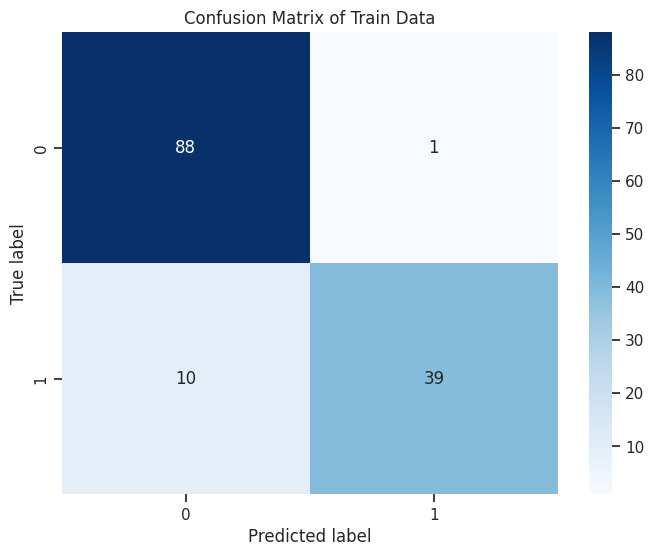

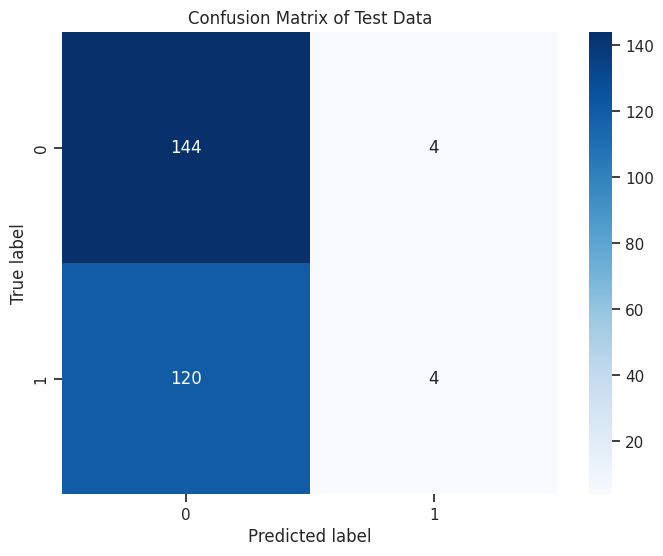

In [ ]:
#Import libraries
from sklearn.metrics import confusion_matrix
import matplotlib.pyplot as plt
import seaborn as sns

# Confusion Matrix for train dataset (imputed_df_train)
train_cm = confusion_matrix(imputed_df_train['MS'], y_train_pred)

# Confusion Matrix for test dataset (imputed_df_test)
test_cm = confusion_matrix(imputed_df_test['MS'], y_test_pred)

# Plot Confusion Matrix for train dataset
plt.figure(figsize=(8, 6))
sns.heatmap(train_cm, annot=True, cmap='Blues', fmt='g')
plt.title('Confusion Matrix of Train Data')
plt.xlabel('Predicted label')
plt.ylabel('True label')
plt.show()

# Plot Confusion Matrix for test dataset
plt.figure(figsize=(8, 6))
sns.heatmap(test_cm, annot=True, cmap='Blues', fmt='g')
plt.title('Confusion Matrix of Test Data')
plt.xlabel('Predicted label')
plt.ylabel('True label')
plt.show()



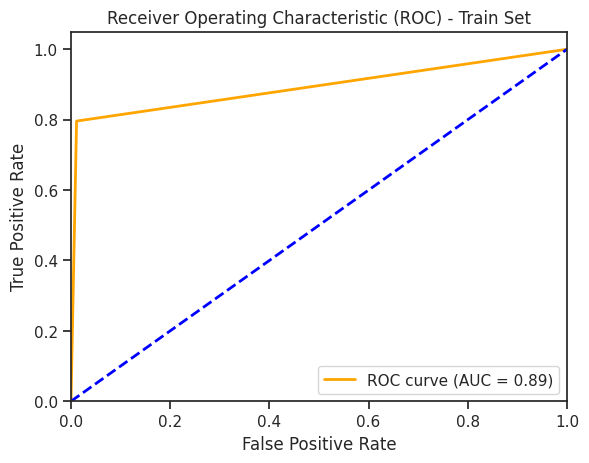

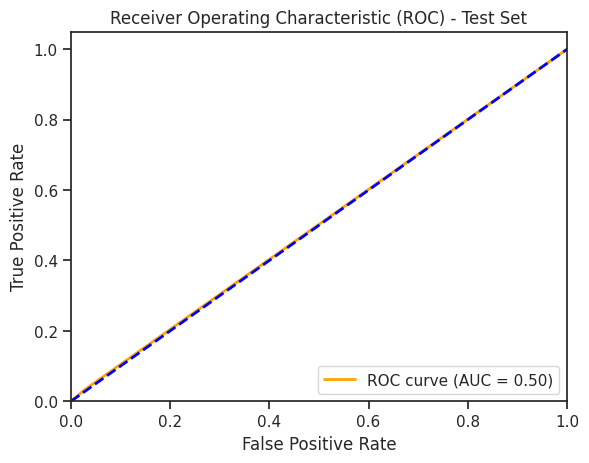

In [ ]:
import matplotlib.pyplot as plt
from sklearn.metrics import roc_curve, auc

# Map actual "YES" and "NO" values to 1 and 0 respectively
mapping = {1.0: 1, 0.0: 0}
y_train_mapped = [mapping[val] for val in imputed_df_train['MS']]
y_test_mapped = [mapping[val] for val in imputed_df_test['MS']]

# Map predicted "YES" and "NO" values to 1 and 0 respectively
y_train_pred_mapped = [mapping[val] for val in y_train_pred]
y_test_pred_mapped = [mapping[val] for val in y_test_pred]

# ROC curve and AUC for train data
fpr_train, tpr_train, thresholds_train = roc_curve(y_train_mapped, y_train_pred_mapped)
roc_auc_train = auc(fpr_train, tpr_train)

# ROC curve and AUC for test data
fpr_test, tpr_test, thresholds_test = roc_curve(y_test_mapped, y_test_pred_mapped)
roc_auc_test = auc(fpr_test, tpr_test)

# Plot ROC curve for train data
plt.figure()
plt.plot(fpr_train, tpr_train, color='orange', lw=2, label='ROC curve (AUC = %0.2f)' % roc_auc_train)
plt.plot([0, 1], [0, 1], color='blue', lw=2, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) - Train Set')
plt.legend(loc="lower right")

# Plot ROC curve for test data
plt.figure()
plt.plot(fpr_test, tpr_test, color='orange', lw=2, label='ROC curve (AUC = %0.2f)' % roc_auc_test)
plt.plot([0, 1], [0, 1], color='blue', lw=2, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) - Test Set')
plt.legend(loc="lower right")

plt.show()


##Calculating Feature Importances

Sex: 0.02745
MRI spinal lesions: 0.47982
BAEP +: 0.16779
OCB + in CSF: 0.32494


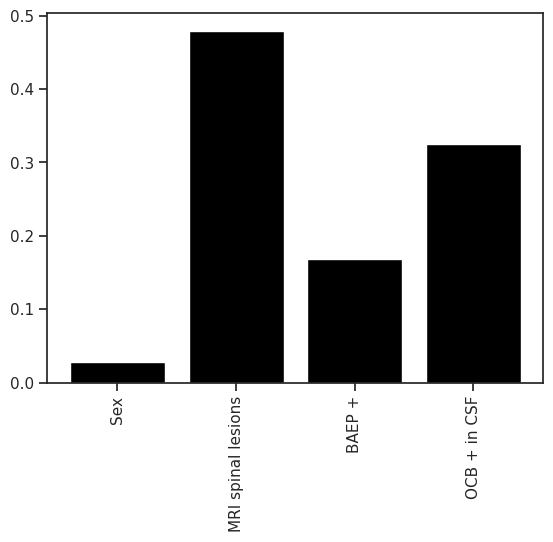

In [ ]:
importance = best_model.feature_importances_

#Summarise feature importance
for i, v in enumerate(importance):
    print('%s: %.5f' % (x_train.columns[i], v))

# Get feature names
feature_names = list(x_train.columns)

# Plot feature importances
plt.bar(feature_names, importance)
plt.xticks(rotation=90)
plt.show()





#7. Testing on Lithuanian Dataset

In [ ]:
#Connect to GDrive to load the dataset
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
#Specify file paths and load them into DataFrames
import pandas as pd
train_data=pd.read_excel('/content/drive/My Drive/Colab Notebooks/Research Project/Updated Mexican Research Dataset.xlsx')
df_train=pd.DataFrame(train_data)
test_data=pd.read_excel('/content/drive/My Drive/Colab Notebooks/Research Project/Research Project Dataset.xlsx')
df_test=pd.DataFrame(test_data)

##Data Pre-processing

Ensuring Reproducibility

In [ ]:
# Import libraries
import random
import numpy as np

#Set seed value
random.seed(42)
np.random.seed(42)

Visualising the datasets and their dimensions

In [ ]:
# Visualise the train dataset
df_train.head(400)

,Nr,Sex,Age,OCB + in CSF,VEP +,BAEP +,Periventricular,MRI spinal lesions,MRI infratentorial lesions,MS
0,1,1,34,0.0,0,0,0,1,0,1
1,2,1,61,1.0,1,0,0,1,0,1
2,3,1,22,1.0,0,0,0,0,0,1
3,4,0,41,1.0,1,0,1,0,0,1
4,5,0,34,0.0,0,0,1,0,0,1
...,...,...,...,...,...,...,...,...,...,...
267,268,0,31,0.0,0,0,0,0,0,0
268,269,1,21,1.0,0,0,0,1,0,0
269,270,0,19,0.0,1,0,0,1,0,0
270,271,0,32,1.0,1,0,1,0,1,0


In [ ]:
# Visualise the test dataset
df_test.head(400)

,Nr,Sex,Age,Fatigue,General weakness,Pain,Focal symptoms,Cranial Nerve Symptoms,CN3,CN4,...,Pathological CSF,Increased protein,Increased protein (g/l),Pleocytosis,Pleocytosis (cells/ml),OCB + in CSF,IgG levels in CSF,VEP +,BAEP +,MS
0,2,0,56,0,0,0,1,1,0,0,...,1,0,0.37,0,4,0,,0,0,0
1,3,0,47,0,0,1,1,0,0,0,...,0,0,0.28,0,0,0,22.9,0,1,0
2,4,0,43,0,0,1,1,1,0,0,...,0,0,0.38,0,2,,25.3,1,0,0
3,5,0,39,0,0,1,0,0,0,0,...,0,,,0,1,0,,,,0
4,6,0,61,0,0,1,1,0,0,0,...,1,1,0.57,0,0,1,,1,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
133,165,0,65,0,0,0,1,0,0,0,...,,,NaN,,NaN,,,1,0,0
134,166,1,61,0,0,0,0,1,1,0,...,1,1,0.96,1,6,0,117,,,0
135,167,0,28,0,1,1,0,0,0,0,...,0,0,0.23,0,4,,,0,,1
136,169,0,22,0,0,0,1,0,0,0,...,0,0,0.16,0,4,1,14.9,0,0,1


In [ ]:
# Number of observations and features in both datasets
print("The train dataset dimensions are: ")
print(df_train.shape)
print("The test dataset dimensions are: ")
print(df_test.shape)

The train dataset dimensions are: 
(272, 10)
The test dataset dimensions are: 
(138, 44)


In [ ]:
# Remove unnecessary columns from train dataset
df_train = df_train.drop(['Nr','VEP +','Age',  'Periventricular', 'MRI infratentorial lesions'], axis=1)

In [ ]:
# Remove unnecessary columns from test dataset
df_test = df_test.drop(['Nr', 'Fatigue',	'Age', 'General weakness',	'Pain',	'Focal symptoms',	'Cranial Nerve Symptoms','CN3',	'CN4'	,'CN5',	'CN6',	'CN8',	'Pathological reflexes',	"Babinski's",	'Rossolimo',	'Muscle strength',	'Reflex asymmetry',	'Muscle tone abnormalities',	'Proprioception',	'Superficial sensation',	'Coordination',	'Balance',	'Urinary incontinence',	'Urine retention',	'Vertigo',	'Sum of symptoms',	'MRI lesions specific to MS',	'MRI lesions indicative of other diseases',	'Unspecified MRI lesions',	'MRI infratentorial lesions',	'Periventricular',	'Juxtacortical',		'Pathological CSF','Increased protein', 'Increased protein (g/l)',	'Pleocytosis',	'Pleocytosis (cells/ml)',		'IgG levels in CSF',	'VEP +'		], axis=1)


Converting the data type for use by the model

In [ ]:
# Convert all columns to numeric data types
df_train = df_train.apply(pd.to_numeric, errors='coerce')
df_test = df_test.apply(pd.to_numeric, errors='coerce')

# Check the data types of columns
print("Data types of Train Dataset Columns: ")
print(df_train.dtypes)
print()
print("Data types of Test Dataset Columns: ")
print(df_train.dtypes)

Data types of Train Dataset Columns: 
Sex                     int64
OCB + in CSF          float64
BAEP +                  int64
MRI spinal lesions      int64
MS                      int64
dtype: object

Data types of Test Dataset Columns: 
Sex                     int64
OCB + in CSF          float64
BAEP +                  int64
MRI spinal lesions      int64
MS                      int64
dtype: object


Impute missing data

In [ ]:
#Install library for imputation
!pip install impyute

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [ ]:
#import library for Multiple Imputation by Chained Equations (MICE)
from impyute.imputation.cs import mice

# impute missing values using MICE
imputed_train = mice(df_train.values)
imputed_test = mice(df_test.values)

# convert imputed data back to a pandas DataFrame
imputed_df_train = pd.DataFrame(imputed_train, columns=df_train.columns)
imputed_df_test = pd.DataFrame(imputed_test, columns=df_test.columns)

Specify features and target variable

In [ ]:
#Specify x and y in both datasets
x_train =imputed_df_train[['Sex','MRI spinal lesions', 'BAEP +', 'OCB + in CSF']]  # Features in Dataset 1
y_train =imputed_df_train['MS']  # Target variable in Dataset 1

x_test = imputed_df_test[['Sex', 'MRI spinal lesions', 'BAEP +', 'OCB + in CSF']]  # Features in Dataset 2
y_test = imputed_df_test['MS']  # Target variable in Dataset 2


#Print train dimensions
print(x_train.shape)
print(y_train.shape)

#Print test dimensions
print(x_test.shape)
print(y_test.shape)

(272, 4)
(272,)
(138, 4)
(138,)


Visualising Relationship between Target Variable and Each Feature in x

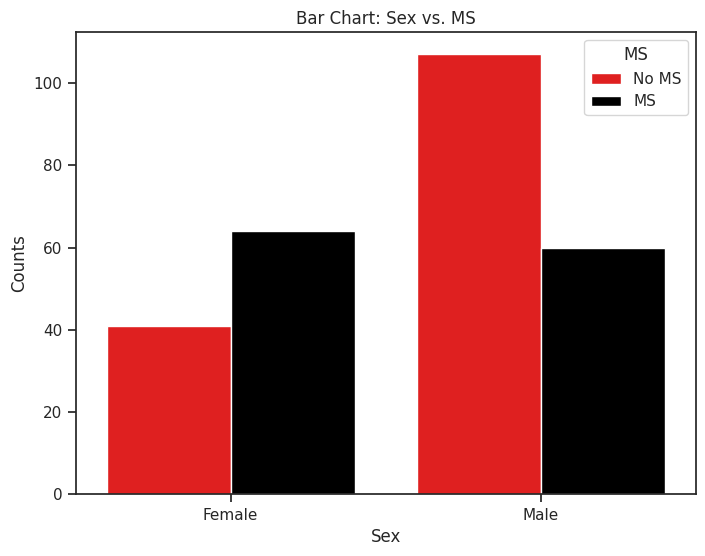

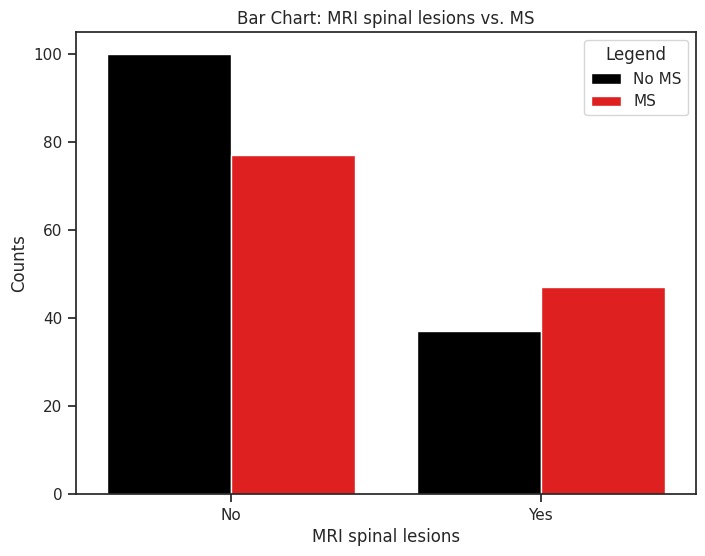

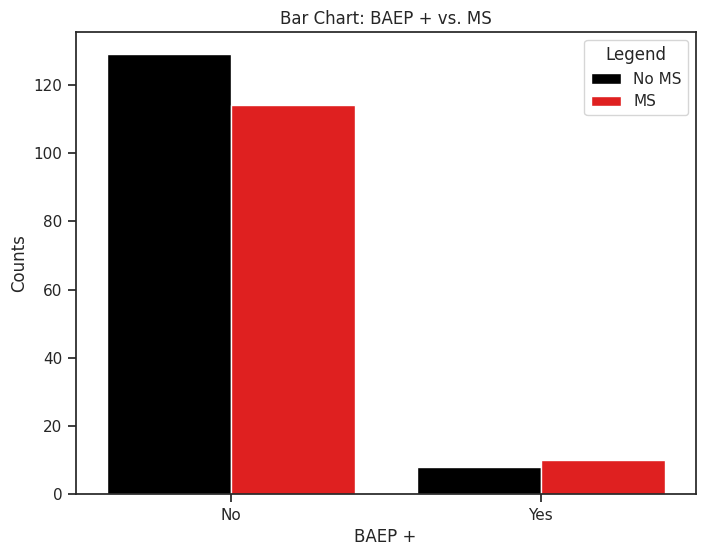

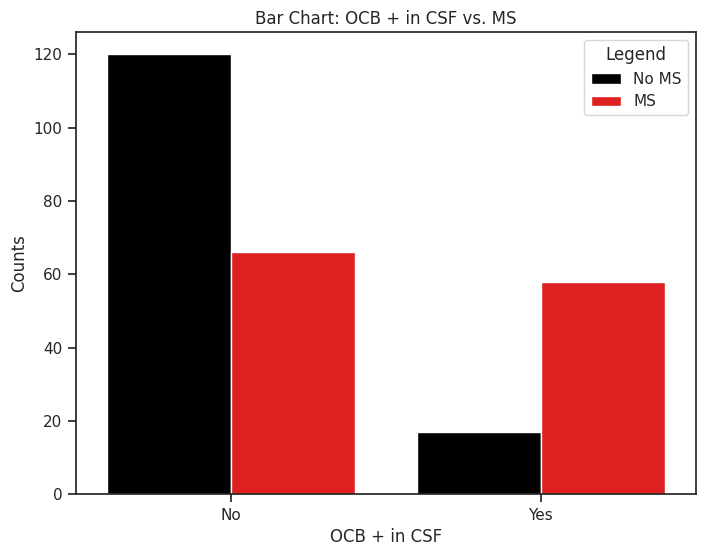

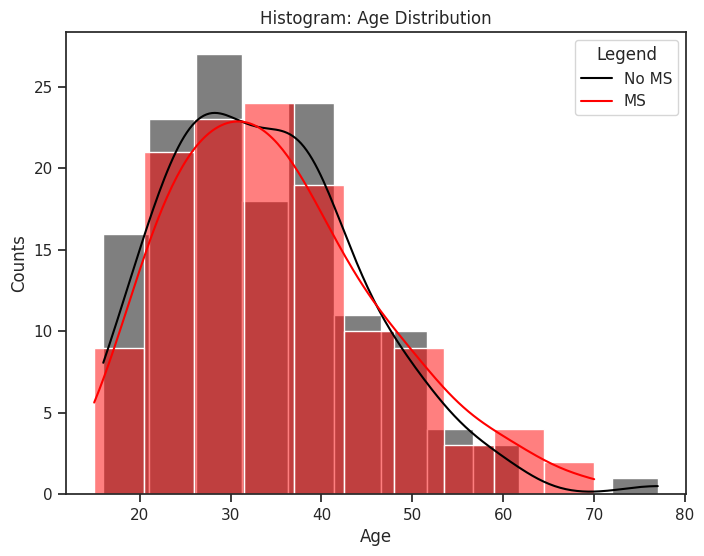

In [ ]:
#Import libraries
import seaborn as sns
import matplotlib.pyplot as plt

# Filter the data
filtered_df = imputed_df_train.copy()
filtered_df = filtered_df.dropna()

# Convert Sex values to strings
filtered_df['Sex'] = filtered_df['Sex'].replace({0.0: 'Female', 1.0: 'Male'})

# Plot bar graph
plt.figure(figsize=(8, 6))
sns.countplot(x='Sex', hue='MS', data=filtered_df, palette={"black", "red"})

plt.xlabel("Sex")
plt.ylabel("Counts")
plt.title("Bar Chart: Sex vs. MS")
plt.legend(title="MS", labels=["No MS", "MS"])

# Set x-axis tick labels
plt.xticks([0, 1], ["Female", "Male"])

plt.show()

# Setting style and palette for plots
sns.set(style="ticks")
sns.set_palette(["black", "red"])

# Define a function to convert values to 0.0 or 1.0
def convert_to_binary(value):
    if value == 0.0:
        return 0.0
    elif value == 1.0:
        return 1.0
    else:
        return None

# Filter the data and convert the variables to binary values
filtered_df = imputed_df_train.copy()
filtered_df['MRI spinal lesions'] = filtered_df['MRI spinal lesions'].apply(convert_to_binary)
filtered_df['OCB + in CSF'] = filtered_df['OCB + in CSF'].apply(convert_to_binary)
filtered_df['BAEP +'] = filtered_df['BAEP +'].apply(convert_to_binary)

# Remove rows with null values
filtered_df = filtered_df.dropna()

# Plot Bar chart for each variable
variables = ['MRI spinal lesions', 'BAEP +', 'OCB + in CSF']

for variable in variables:
    plt.figure(figsize=(8, 6))
    ax = sns.countplot(x=variable, hue='MS', data=filtered_df)
    ax.set_ylabel("Counts")
    ax.set_xlabel(variable)
    ax.set_xticks([0, 1])
    ax.set_xticklabels(["No", "Yes"])
    plt.title(f"Bar Chart: {variable} vs. MS")
    plt.legend(title="Legend", labels=["No MS", "MS"])
    plt.show()

# Create separate histograms for 'No MS' and 'MS' labels
plt.figure(figsize=(8, 6))
sns.histplot(filtered_df[filtered_df['MS'] == 0]['Age'], color='black', label='No MS', kde=True)
sns.histplot(filtered_df[filtered_df['MS'] == 1]['Age'], color='red', label='MS', kde=True)

plt.xlabel("Age")
plt.ylabel("Counts")
plt.title("Histogram: Age Distribution")
plt.legend(title="Legend", labels=["No MS", "MS"])
plt.show()


Visualising correlation and multicollinearity in the train dataset (x) as a correlation matrix, heatmap and Seaborn plots

In [ ]:
# Import libraries
import pandas as pd

# Calculate the correlation matrix
corr_matrix = imputed_df_train[['Sex', 'Age', 'BAEP +', 'MRI spinal lesions', 'OCB + in CSF', 'MS']].corr()

# Display the correlation table
corr_table = corr_matrix.style.set_properties(**{'background-color': 'transparent'})

# Display the correlation table
print("Correlation Matrix: ")
corr_table

Correlation Matrix: 


,Sex,Age,BAEP +,MRI spinal lesions,OCB + in CSF,MS
Sex,1.000000,-0.074293,0.153455,-0.003224,0.176901,0.244609
Age,-0.074293,1.000000,0.208582,0.125208,0.066228,0.065317
BAEP +,0.153455,0.208582,1.000000,0.073435,0.164733,0.053275
MRI spinal lesions,-0.003224,0.125208,0.073435,1.000000,0.148313,0.123734
OCB + in CSF,0.176901,0.066228,0.164733,0.148313,1.000000,0.385704
MS,0.244609,0.065317,0.053275,0.123734,0.385704,1.000000


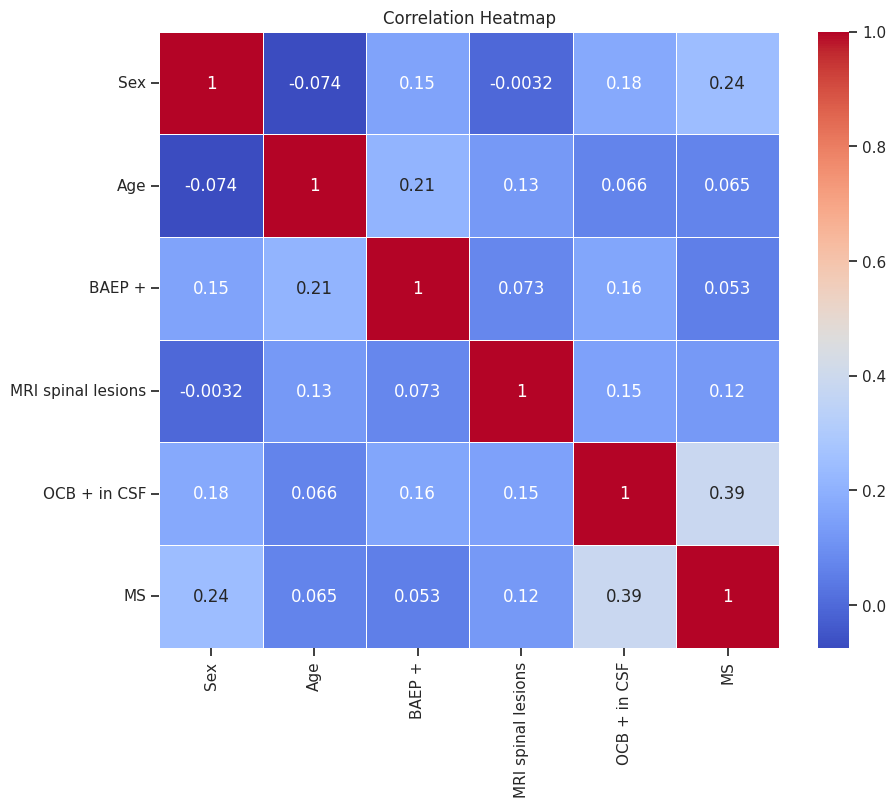

In [ ]:
#Import libraries
import seaborn as sns
import matplotlib.pyplot as plt

# Calculate the correlation matrix
corr_matrix = imputed_df_train[['Sex', 'Age', 'BAEP +', 'MRI spinal lesions', 'OCB + in CSF', 'MS']].corr()

# Plot the correlation matrix using a heatmap
plt.figure(figsize=(10, 8))
sns.heatmap(corr_matrix, annot=True, cmap='coolwarm', linewidths=0.5)
plt.title('Correlation Heatmap')
plt.xticks(rotation=90)
plt.yticks(rotation=0)
plt.show()


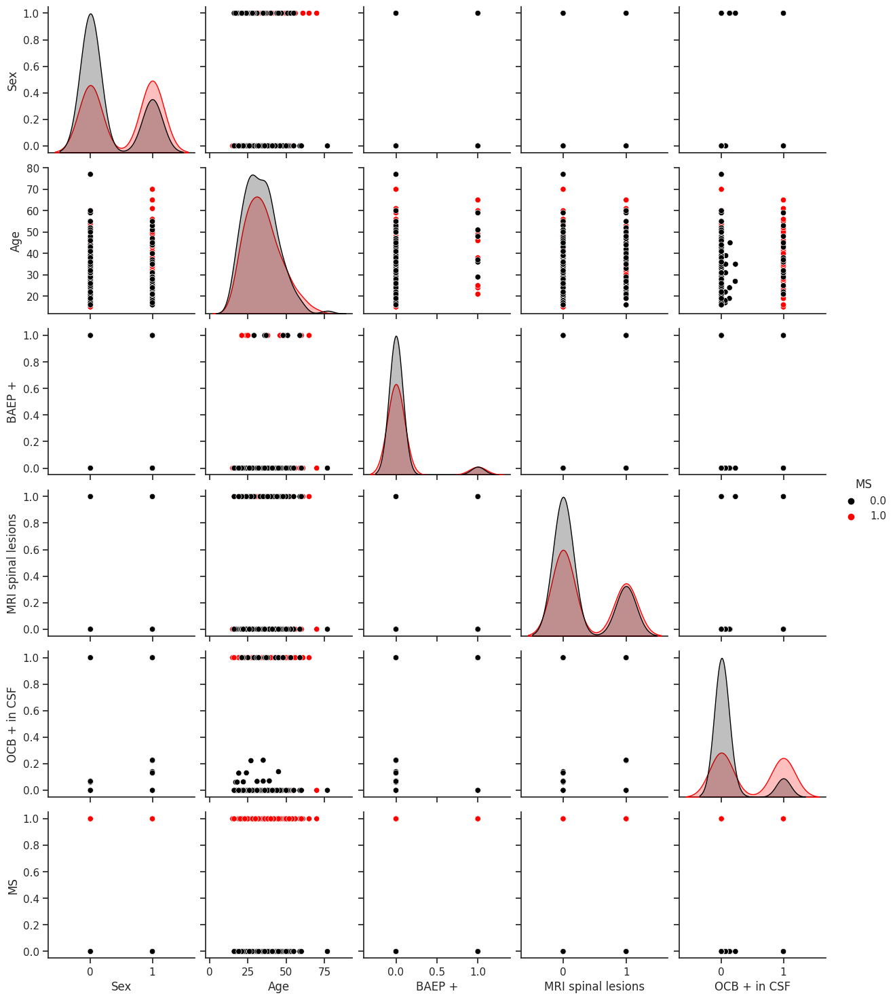

In [ ]:
# Import libraries
import seaborn as sns
import matplotlib.pyplot as plt

# Specify the features and target variable
selected_features = ['Sex', 'Age', 'BAEP +', 'MRI spinal lesions', 'OCB + in CSF']
target_variable = 'MS'

# Concatenate the selected features and the target variable
data = imputed_df_train[selected_features + [target_variable]]

# Plot pairwise relationships
sns.pairplot(data, x_vars=selected_features, y_vars=selected_features + [target_variable], hue=target_variable)
plt.show()


In [ ]:
# Print features with multicollinearity
highly_correlated_features = []
abs_corr_matrix = imputed_df_train[selected_features].corr().abs()

for i in range(len(abs_corr_matrix.columns)):
    for j in range(i + 1, len(abs_corr_matrix.columns)):
        if abs_corr_matrix.iloc[i, j] > 0.7:
            feature_i = abs_corr_matrix.columns[i]
            feature_j = abs_corr_matrix.columns[j]
            highly_correlated_features.append((feature_i, feature_j))

if len(highly_correlated_features) == 0:
    print("No Multicollinearity Observed")
else:
    print("Features with multicollinearity (absolute correlation coefficient > 0.7):")
    for feature_i, feature_j in highly_correlated_features:
        print(f"{feature_i} - {feature_j}")


No Multicollinearity Observed


Checking for imbalanced classes in the dataset

0.0    54.411765
1.0    45.588235
Name: MS, dtype: float64


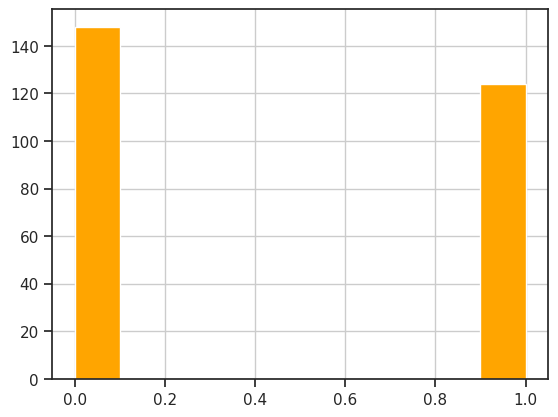

The baseline accuracy is: 0.5441176470588235


In [ ]:
# Check if dataset is imbalanced
print(imputed_df_train['MS'].value_counts() * 100.0 / len(imputed_df_train['MS']))

# Visualise dataset imbalance
import matplotlib.pyplot as plt
imputed_df_train['MS'].hist(color='orange')
plt.show()

# Find baseline accuracy
from sklearn.dummy import DummyClassifier

features = imputed_df_train[selected_features]
outcome = imputed_df_train['MS']

clf = DummyClassifier(strategy='most_frequent')
clf.fit(features, outcome)
baseline_accuracy = clf.score(features, outcome)
print("The baseline accuracy is:", baseline_accuracy)


#Data splitting not done as y is a new dataset

##Importing Libraries for Following Steps

In [ ]:
# Import libraries
from sklearn.metrics import f1_score
import warnings
from sklearn.exceptions import ConvergenceWarning
import numpy as np
from sklearn.model_selection import StratifiedKFold
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import GridSearchCV

# Ignore convergence warnings
warnings.filterwarnings("ignore", category=ConvergenceWarning)

##Hyperparameter tuning

In [ ]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import GridSearchCV

# Define parameters to tune for Random Forest Classifier
rf_param_grid = {
    'n_estimators': [100, 200, 300],
    'criterion': ['gini', 'entropy'],
    'max_depth': [None, 5, 10, 15],
    'min_samples_split': [2, 5, 10],
    'min_samples_leaf': [1, 2, 4],
    'class_weight': [None, 'balanced'],
    'random_state': [None, 42]
}


##Stratified K-Fold Cross Validation:

In [ ]:
# Creating an instance of StratifiedKFold
rf_skfold = StratifiedKFold(n_splits=5, shuffle=True, random_state=1)

##Training and Model Validation:



In [ ]:
# Creating lists to store evaluation metrics for each fold
train_f1_scores = []
val_f1_scores = []

# Iterating over each fold
for train_index, val_index in rf_skfold.split(x_train, y_train):
    x_train_fold, x_val_fold = x_train.iloc[train_index], x_train.iloc[val_index]
    y_train_fold, y_val_fold = y_train.iloc[train_index], y_train.iloc[val_index]

    # Create an instance of Random Forest model
    rf = RandomForestClassifier(random_state=1)

    # Create an instance of GridSearchCV for Random Forest Classifier
    rf_cv = GridSearchCV(rf, rf_param_grid, cv=rf_skfold)

    # Fit GridSearchCV on the training fold
    rf_cv.fit(x_train_fold, y_train_fold)

    # Get the best estimator from GridSearchCV
    best_rf_model = rf_cv.best_estimator_

    # Print best parameters and F1 score
    print("Best Parameters:", rf_cv.best_params_)
    print("F1 Score:", rf_cv.best_score_)

    # Fitting the best estimator on the training fold and making predictions
    y_train_pred = best_rf_model.predict(x_train_fold)

    # Calculating F1 score for the train set
    train_f1 = f1_score(y_train_fold, y_train_pred)

    # Appending train F1 score to the list
    train_f1_scores.append(train_f1)

    # Making predictions for the validation fold
    y_val_pred = best_rf_model.predict(x_val_fold)

    # Calculating F1 score for the validation set
    val_f1 = f1_score(y_val_fold, y_val_pred)

    # Appending validation F1 score to the list
    val_f1_scores.append(val_f1)


Best Parameters: {'class_weight': None, 'criterion': 'entropy', 'max_depth': 15, 'min_samples_leaf': 4, 'min_samples_split': 5, 'n_estimators': 100, 'random_state': None}
F1 Score: 0.6955602536997885
Best Parameters: {'class_weight': 'balanced', 'criterion': 'gini', 'max_depth': 5, 'min_samples_leaf': 2, 'min_samples_split': 10, 'n_estimators': 200, 'random_state': None}
F1 Score: 0.7189217758985201
Best Parameters: {'class_weight': None, 'criterion': 'entropy', 'max_depth': None, 'min_samples_leaf': 4, 'min_samples_split': 5, 'n_estimators': 100, 'random_state': None}
F1 Score: 0.7017970401691331
Best Parameters: {'class_weight': 'balanced', 'criterion': 'gini', 'max_depth': None, 'min_samples_leaf': 2, 'min_samples_split': 2, 'n_estimators': 200, 'random_state': None}
F1 Score: 0.7068710359408035
Best Parameters: {'class_weight': None, 'criterion': 'gini', 'max_depth': None, 'min_samples_leaf': 1, 'min_samples_split': 2, 'n_estimators': 100, 'random_state': None}
F1 Score: 0.71099365

##Average F1 Scores and Standard Deviation:

In [ ]:
# Calculating the average and standard deviation of F1 scores for train and validation sets
avg_train_f1 = np.mean(train_f1_scores)
std_train_f1 = np.std(train_f1_scores)
avg_val_f1 = np.mean(val_f1_scores)
std_val_f1 = np.std(val_f1_scores)

# Print the average and standard deviation for train and validation F1 scores
print("Average Train F1 Score:", avg_train_f1)
print("Standard Deviation of Train F1 Score:", std_train_f1)
print("Average Validation F1 Score:", avg_val_f1)
print("Standard Deviation of Validation F1 Score:", std_val_f1)


Average Train F1 Score: 0.658787955993162
Standard Deviation of Train F1 Score: 0.03671298632073664
Average Validation F1 Score: 0.6200841638981174
Standard Deviation of Validation F1 Score: 0.04489802909164844


##Model Predictions on Train and Test Sets:

In [ ]:
# Make predictions on the train set using best model
best_model = rf_cv.best_estimator_
y_train_pred = best_model.predict(x_train)

# Make predictions on the test set using best model
best_model = rf_cv.best_estimator_
y_test_pred = best_model.predict(x_test)

##Visualise Various Classification Metrics

In [ ]:
#Import libraries
from sklearn.metrics import classification_report

# Print Classification Report for train dataset (imputed_df_train)
print("Classification Report of Train Data:")
print(classification_report(imputed_df_train['MS'], y_train_pred))

print()

# Print Classification Report for test dataset (imputed_df_test)
print("Classification Report of Test Data:")
print(classification_report(imputed_df_test['MS'], y_test_pred))


Classification Report of Train Data:
              precision    recall  f1-score   support

         0.0       0.69      0.85      0.76       148
         1.0       0.75      0.54      0.63       124

    accuracy                           0.71       272
   macro avg       0.72      0.70      0.70       272
weighted avg       0.72      0.71      0.70       272


Classification Report of Test Data:
              precision    recall  f1-score   support

         0.0       0.92      0.76      0.83        89
         1.0       0.67      0.88      0.76        49

    accuracy                           0.80       138
   macro avg       0.80      0.82      0.80       138
weighted avg       0.83      0.80      0.81       138



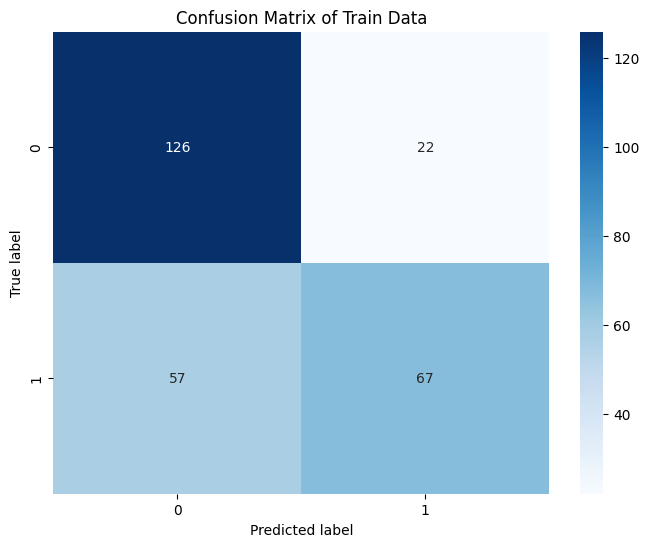

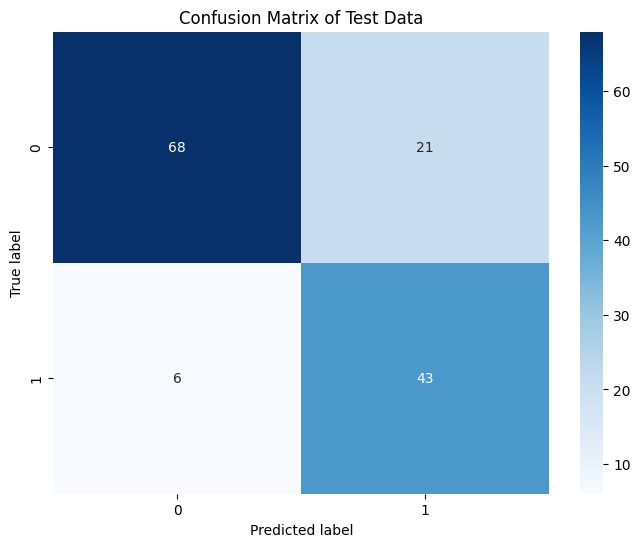

In [ ]:
#Import libraries
from sklearn.metrics import confusion_matrix
import matplotlib.pyplot as plt
import seaborn as sns

# Confusion Matrix for train dataset (imputed_df_train)
train_cm = confusion_matrix(imputed_df_train['MS'], y_train_pred)

# Confusion Matrix for test dataset (imputed_df_test)
test_cm = confusion_matrix(imputed_df_test['MS'], y_test_pred)

# Plot Confusion Matrix for train dataset
plt.figure(figsize=(8, 6))
sns.heatmap(train_cm, annot=True, cmap='Blues', fmt='g')
plt.title('Confusion Matrix of Train Data')
plt.xlabel('Predicted label')
plt.ylabel('True label')
plt.show()

# Plot Confusion Matrix for test dataset
plt.figure(figsize=(8, 6))
sns.heatmap(test_cm, annot=True, cmap='Blues', fmt='g')
plt.title('Confusion Matrix of Test Data')
plt.xlabel('Predicted label')
plt.ylabel('True label')
plt.show()



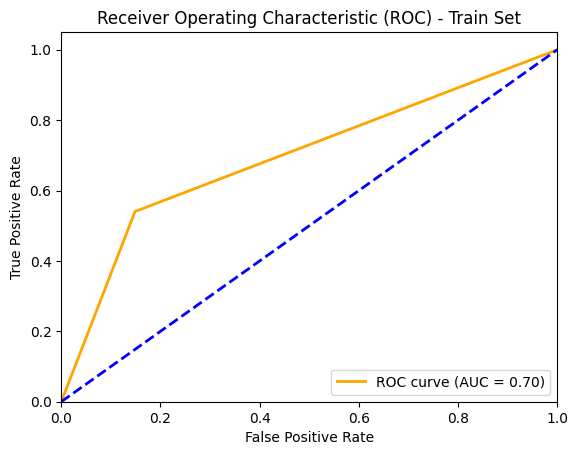

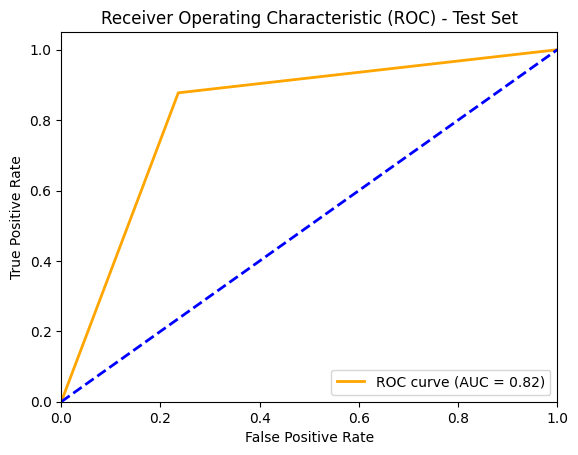

In [ ]:
import matplotlib.pyplot as plt
from sklearn.metrics import roc_curve, auc

# Map actual "YES" and "NO" values to 1 and 0 respectively
mapping = {1.0: 1, 0.0: 0}
y_train_mapped = [mapping[val] for val in imputed_df_train['MS']]
y_test_mapped = [mapping[val] for val in imputed_df_test['MS']]

# Map predicted "YES" and "NO" values to 1 and 0 respectively
y_train_pred_mapped = [mapping[val] for val in y_train_pred]
y_test_pred_mapped = [mapping[val] for val in y_test_pred]

# ROC curve and AUC for train data
fpr_train, tpr_train, thresholds_train = roc_curve(y_train_mapped, y_train_pred_mapped)
roc_auc_train = auc(fpr_train, tpr_train)

# ROC curve and AUC for test data
fpr_test, tpr_test, thresholds_test = roc_curve(y_test_mapped, y_test_pred_mapped)
roc_auc_test = auc(fpr_test, tpr_test)

# Plot ROC curve for train data
plt.figure()
plt.plot(fpr_train, tpr_train, color='orange', lw=2, label='ROC curve (AUC = %0.2f)' % roc_auc_train)
plt.plot([0, 1], [0, 1], color='blue', lw=2, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) - Train Set')
plt.legend(loc="lower right")

# Plot ROC curve for test data
plt.figure()
plt.plot(fpr_test, tpr_test, color='orange', lw=2, label='ROC curve (AUC = %0.2f)' % roc_auc_test)
plt.plot([0, 1], [0, 1], color='blue', lw=2, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) - Test Set')
plt.legend(loc="lower right")

plt.show()


##Calculating Feature Importances

Sex: 0.22265
MRI spinal lesions: 0.08336
BAEP +: 0.08617
OCB + in CSF: 0.60782


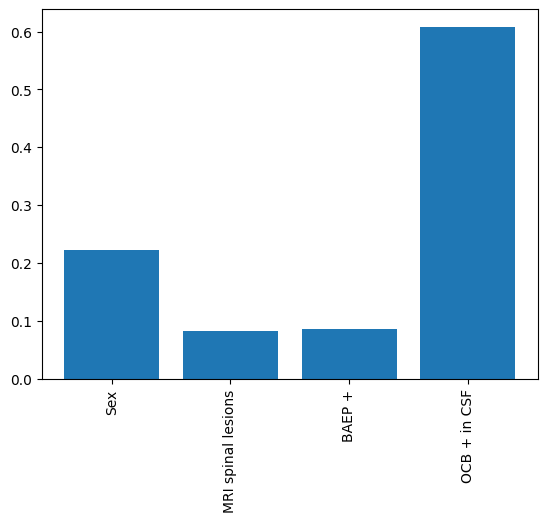

In [ ]:
importance = best_model.feature_importances_

#Summarise feature importance
for i, v in enumerate(importance):
    print('%s: %.5f' % (x_train.columns[i], v))

# Get feature names
feature_names = list(x_train.columns)

# Plot feature importances
plt.bar(feature_names, importance)
plt.xticks(rotation=90)
plt.show()




#8. Using Concatenated Dataset (Mexican+Lithuanian Combined)

##Data Loading

In [ ]:
#Connect to GDrive to load the dataset
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
#Specify file path and load it into a DataFrame
import pandas as pd
data=pd.read_excel('/content/drive/My Drive/Colab Notebooks/Research Project/Concatenated Dataset.xlsx')
df=pd.DataFrame(data)

##Data Pre-processing

Ensuring Reproducibility

In [ ]:
# Import libraries
import random
import numpy as np

#Set seed value
random.seed(42)
np.random.seed(42)

Visualising the dataset and its dimensions

In [ ]:
# Visualise the dataset
df.head(140)

NameError: ignored

In [ ]:
# Number of observations and features in the dataset
print(df.shape)

(410, 10)


Dropping columns not needed for the analysis

In [ ]:
# Remove unnecessary columns
df = df.drop(['Nr', 'Periventricular', 'VEP +', 'Age', 'MRI infratentorial lesions'], axis=1)

Converting the data type for use by the model

In [ ]:
# Convert all columns to numeric data types
df = df.apply(pd.to_numeric, errors='coerce')

# Check the data types of columns
print(df.dtypes)

Sex                     int64
OCB + in CSF          float64
BAEP +                float64
MRI spinal lesions    float64
MS                      int64
dtype: object


Impute missing data

In [ ]:
#Install library for imputation
!pip install impyute

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [ ]:
#import library for Multiple Imputation by Chained Equations (MICE)
from impyute.imputation.cs import mice

# impute missing values using MICE
imputed_data = mice(df.values)

# convert imputed data back to a pandas DataFrame
imputed_df = pd.DataFrame(imputed_data, columns=df.columns)

Specify features and target variable

In [ ]:
#Specify x and y
x = imputed_df[[ 'MRI spinal lesions', 'OCB + in CSF', 'BAEP +', 'Sex']]
y = imputed_df['MS']

#Print dimensions
print(x.shape)
print(y.shape)

(410, 5)
(410,)


Visualising Relationship between Target Variable and Each Feature in X

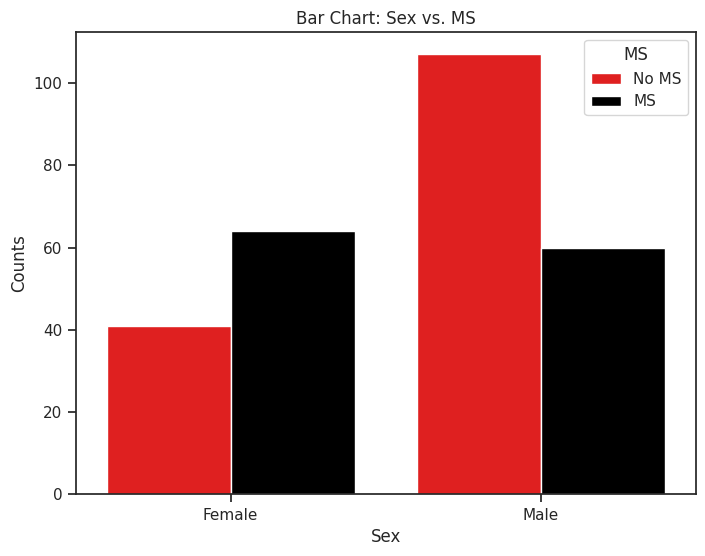

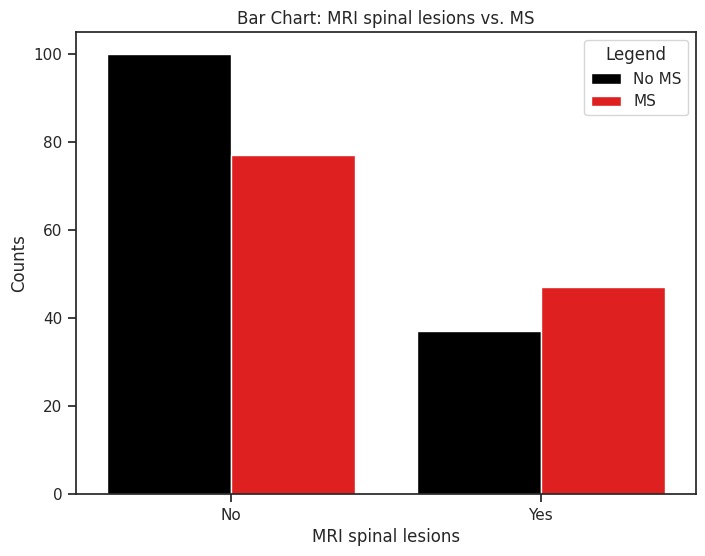

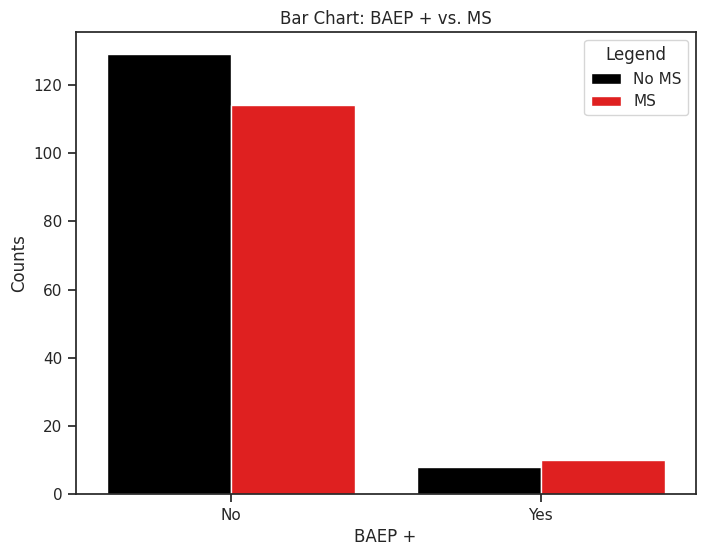

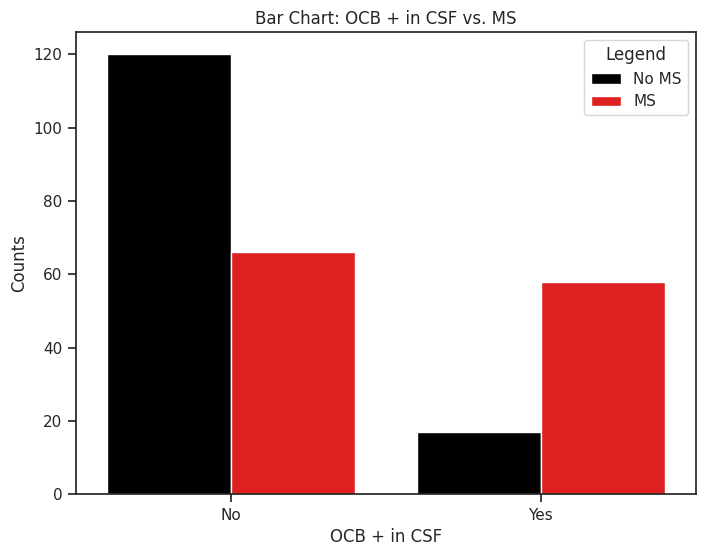

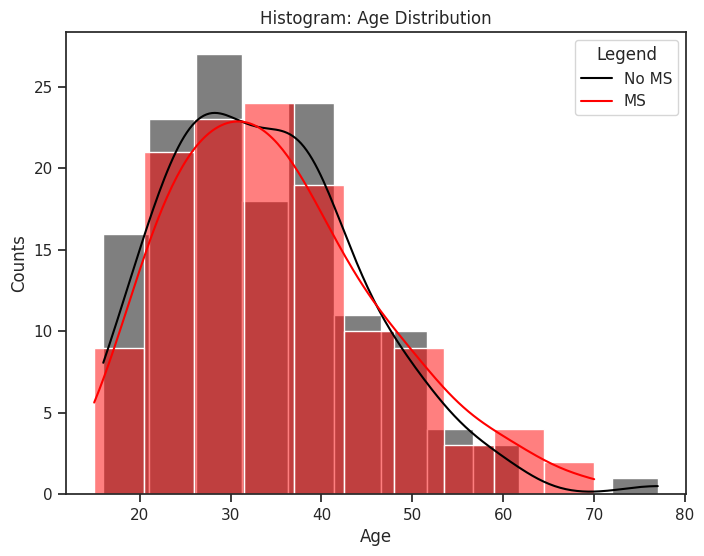

In [ ]:
#Import libraries
import seaborn as sns
import matplotlib.pyplot as plt

# Filter the data
filtered_df = imputed_df_train.copy()
filtered_df = filtered_df.dropna()

# Convert Sex values to strings
filtered_df['Sex'] = filtered_df['Sex'].replace({0.0: 'Female', 1.0: 'Male'})

# Plot bar graph
plt.figure(figsize=(8, 6))
sns.countplot(x='Sex', hue='MS', data=filtered_df, palette={"black", "red"})

plt.xlabel("Sex")
plt.ylabel("Counts")
plt.title("Bar Chart: Sex vs. MS")
plt.legend(title="MS", labels=["No MS", "MS"])

# Set x-axis tick labels
plt.xticks([0, 1], ["Female", "Male"])

plt.show()

# Setting style and palette for plots
sns.set(style="ticks")
sns.set_palette(["black", "red"])

# Define a function to convert values to 0.0 or 1.0
def convert_to_binary(value):
    if value == 0.0:
        return 0.0
    elif value == 1.0:
        return 1.0
    else:
        return None

# Filter the data and convert the variables to binary values
filtered_df = imputed_df_train.copy()
filtered_df['MRI spinal lesions'] = filtered_df['MRI spinal lesions'].apply(convert_to_binary)
filtered_df['OCB + in CSF'] = filtered_df['OCB + in CSF'].apply(convert_to_binary)
filtered_df['BAEP +'] = filtered_df['BAEP +'].apply(convert_to_binary)

# Remove rows with null values
filtered_df = filtered_df.dropna()

# Plot Bar chart for each variable
variables = ['MRI spinal lesions', 'BAEP +', 'OCB + in CSF']

for variable in variables:
    plt.figure(figsize=(8, 6))
    ax = sns.countplot(x=variable, hue='MS', data=filtered_df)
    ax.set_ylabel("Counts")
    ax.set_xlabel(variable)
    ax.set_xticks([0, 1])
    ax.set_xticklabels(["No", "Yes"])
    plt.title(f"Bar Chart: {variable} vs. MS")
    plt.legend(title="Legend", labels=["No MS", "MS"])
    plt.show()

# Create separate histograms for 'No MS' and 'MS' labels
plt.figure(figsize=(8, 6))
sns.histplot(filtered_df[filtered_df['MS'] == 0]['Age'], color='black', label='No MS', kde=True)
sns.histplot(filtered_df[filtered_df['MS'] == 1]['Age'], color='red', label='MS', kde=True)

plt.xlabel("Age")
plt.ylabel("Counts")
plt.title("Histogram: Age Distribution")
plt.legend(title="Legend", labels=["No MS", "MS"])
plt.show()


Visualising correlation and multicollinearity as a correlation matrix, heatmap and Seaborn plots

In [ ]:
#Plotting a correlation matrix

#Import libraries
import seaborn as sns
import matplotlib.pyplot as plt

# Concatenate x and y
data = pd.concat([x, y], axis=1)

#Calculate and print the correlation matrix
print("Correlation Matrix")
data.corr()


Correlation Matrix


,MRI spinal lesions,OCB + in CSF,BAEP +,Sex,MS
MRI spinal lesions,1.000000,0.114599,0.051671,0.010913,0.075824
OCB + in CSF,0.114599,1.000000,0.230081,0.089504,0.444444
BAEP +,0.051671,0.230081,1.000000,0.078308,0.120500
Sex,0.010913,0.089504,0.078308,1.000000,0.217936
MS,0.075824,0.444444,0.120500,0.217936,1.000000


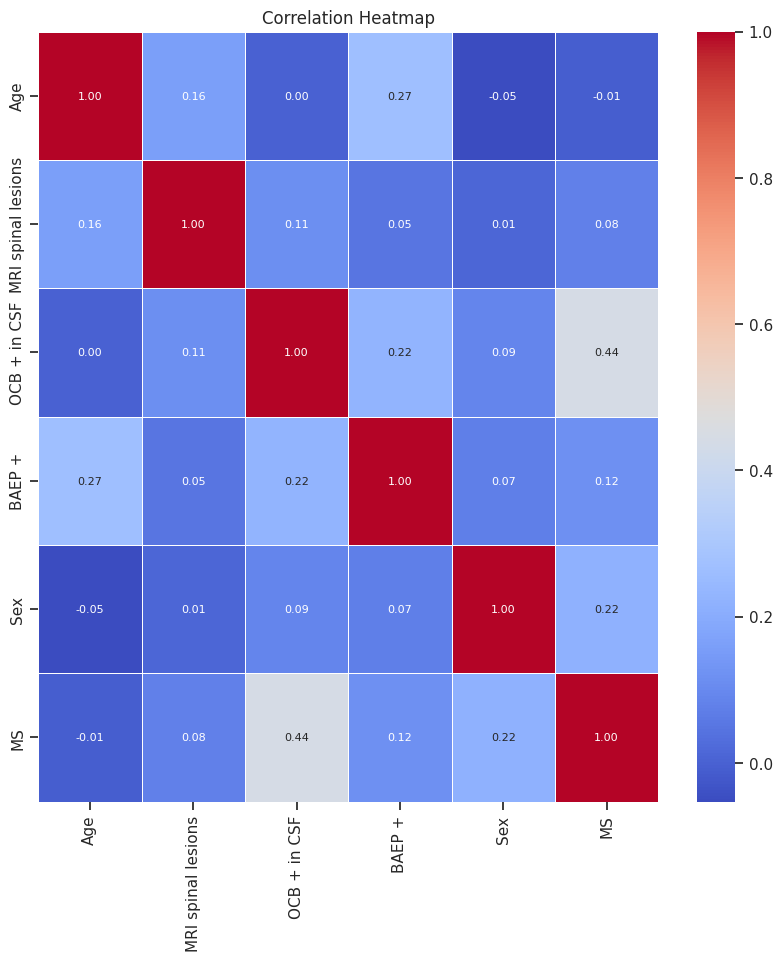

In [ ]:
#Visualise correlation and multicollinearity as a heatmap

#Import libraries
import seaborn as sns
import matplotlib.pyplot as plt

# Concatenate x and y
data = pd.concat([x, y], axis=1)

# Computing the correlation matrix
corr_matrix = data.corr()

# Plotting a heatmap
plt.figure(figsize=(10, 10))
sns.heatmap(corr_matrix, annot=True, cmap='coolwarm', fmt=".2f", linewidths=0.5, annot_kws={"size": 8})
plt.title("Correlation Heatmap")
plt.show()

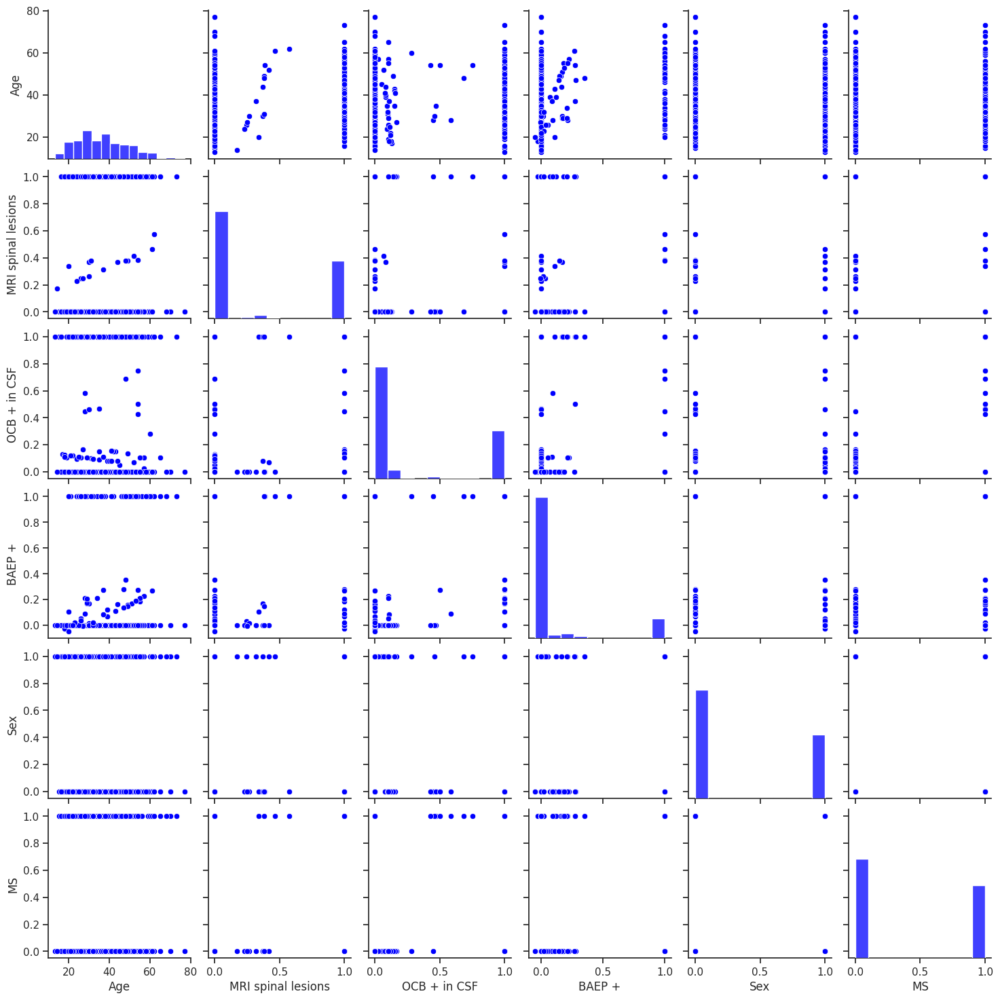

In [ ]:
# Import library
import seaborn as sns

# Concatenate x and y
data = pd.concat([x, y], axis=1)

# Set color
color = 'blue'

# Visualise plots
sns.pairplot(data, diag_kws={'color': color}, plot_kws={'color': color})


In [ ]:
# Print features with multicollinearity
highly_correlated_features = []
abs_corr_matrix = corr_matrix.abs()
for i in range(len(abs_corr_matrix.columns)):
    for j in range(i+1, len(abs_corr_matrix.columns)):
        if abs_corr_matrix.iloc[i, j] > 0.7:
            feature_i = abs_corr_matrix.columns[i]
            feature_j = abs_corr_matrix.columns[j]
            highly_correlated_features.append((feature_i, feature_j))

if len(highly_correlated_features) == 0:
    print("No Multicollinearity Observed")
else:
    print("Features with multicollinearity (absolute correlation coefficient > 0.7):")
    for feature_i, feature_j in highly_correlated_features:
        print(f"{feature_i} - {feature_j}")

No Multicollinearity Observed


Checking for imbalanced classes in the dataset

0.0    57.804878
1.0    42.195122
Name: MS, dtype: float64


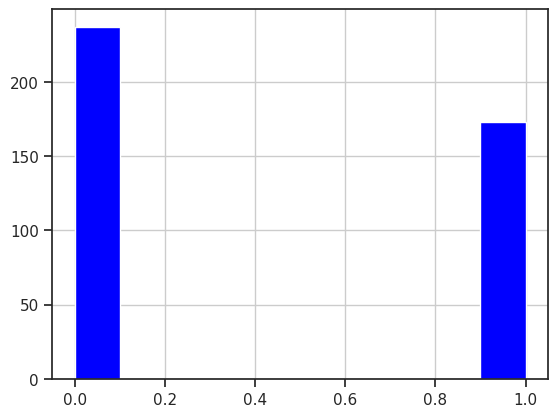

The baseline accuracy is: 0.5780487804878048


In [ ]:
# Check if dataset is imbalanced
print(y.value_counts() * 100.0 / len(y))

# Visualize dataset imbalance
import matplotlib.pyplot as plt
y.hist(color=['blue'])
plt.show()

# Find baseline accuracy
from sklearn.dummy import DummyClassifier

clf = DummyClassifier(strategy='most_frequent')
clf.fit(x, y)
baseline_accuracy = clf.score(x, y)
print("The baseline accuracy is:", baseline_accuracy)


##Data Splitting

Split data into train and test sets

In [ ]:
#Import train_test_split function
from sklearn.model_selection import train_test_split

# Split data into train and test sets with stratification to resolve class imbalances
x_train, x_test, y_train, y_test = train_test_split(x, y, test_size=0.2, random_state=1, stratify=y, shuffle=True)

# Print dimensions
print('x_train:', x_train.shape)
print('x_test:', x_test.shape)
print('y_train:', y_train.shape)
print('y_test:', y_test.shape)

x_train: (328, 5)
x_test: (82, 5)
y_train: (328,)
y_test: (82,)


##Importing Libraries for Following Steps

In [ ]:
# Import libraries
from sklearn.metrics import f1_score
import warnings
from sklearn.exceptions import ConvergenceWarning
import numpy as np
from sklearn.model_selection import StratifiedKFold
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import GridSearchCV

# Ignore convergence warnings
warnings.filterwarnings("ignore", category=ConvergenceWarning)

##Hyperparameter tuning

In [ ]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import GridSearchCV

# Define parameters to tune for Random Forest Classifier
rf_param_grid = {
    'n_estimators': [100, 200, 300],
    'criterion': ['gini', 'entropy'],
    'max_depth': [None, 5, 10, 15],
    'min_samples_split': [2, 5, 10],
    'min_samples_leaf': [1, 2, 4],
    'class_weight': [None, 'balanced'],
    'random_state': [None, 42]
}


##Stratified K-Fold Cross Validation:

In [ ]:
# Creating an instance of StratifiedKFold
rf_skfold = StratifiedKFold(n_splits=5, shuffle=True, random_state=1)

##Training and Model Validation:



In [ ]:
# Creating lists to store evaluation metrics for each fold
train_f1_scores = []
val_f1_scores = []

# Iterating over each fold
for train_index, val_index in rf_skfold.split(x_train, y_train):
    x_train_fold, x_val_fold = x_train.iloc[train_index], x_train.iloc[val_index]
    y_train_fold, y_val_fold = y_train.iloc[train_index], y_train.iloc[val_index]

    # Create an instance of Random Forest model
    rf = RandomForestClassifier(random_state=1)

    # Create an instance of GridSearchCV for Random Forest Classifier
    rf_cv = GridSearchCV(rf, rf_param_grid, cv=rf_skfold)

    # Fit GridSearchCV on the training fold
    rf_cv.fit(x_train_fold, y_train_fold)

    # Get the best estimator from GridSearchCV
    best_rf_model = rf_cv.best_estimator_

    # Print best parameters and F1 score
    print("Best Parameters:", rf_cv.best_params_)
    print("F1 Score:", rf_cv.best_score_)

    # Fitting the best estimator on the training fold and making predictions
    y_train_pred = best_rf_model.predict(x_train_fold)

    # Calculating F1 score for the train set
    train_f1 = f1_score(y_train_fold, y_train_pred)

    # Appending train F1 score to the list
    train_f1_scores.append(train_f1)

    # Making predictions for the validation fold
    y_val_pred = best_rf_model.predict(x_val_fold)

    # Calculating F1 score for the validation set
    val_f1 = f1_score(y_val_fold, y_val_pred)

    # Appending validation F1 score to the list
    val_f1_scores.append(val_f1)


Best Parameters: {'class_weight': None, 'criterion': 'gini', 'max_depth': 5, 'min_samples_leaf': 1, 'min_samples_split': 10, 'n_estimators': 100, 'random_state': None}
F1 Score: 0.7214804063860667
Best Parameters: {'class_weight': None, 'criterion': 'gini', 'max_depth': None, 'min_samples_leaf': 4, 'min_samples_split': 10, 'n_estimators': 100, 'random_state': None}
F1 Score: 0.7404934687953556
Best Parameters: {'class_weight': None, 'criterion': 'gini', 'max_depth': 5, 'min_samples_leaf': 1, 'min_samples_split': 10, 'n_estimators': 200, 'random_state': None}
F1 Score: 0.7706095791001453
Best Parameters: {'class_weight': None, 'criterion': 'gini', 'max_depth': 5, 'min_samples_leaf': 2, 'min_samples_split': 10, 'n_estimators': 100, 'random_state': None}
F1 Score: 0.7451378809869377
Best Parameters: {'class_weight': None, 'criterion': 'gini', 'max_depth': None, 'min_samples_leaf': 4, 'min_samples_split': 5, 'n_estimators': 200, 'random_state': None}
F1 Score: 0.7257619738751815


##Average F1 Scores and Standard Deviation:

In [ ]:
# Calculating the average and standard deviation of F1 scores for train and validation sets
avg_train_f1 = np.mean(train_f1_scores)
std_train_f1 = np.std(train_f1_scores)
avg_val_f1 = np.mean(val_f1_scores)
std_val_f1 = np.std(val_f1_scores)

# Print the average and standard deviation for train and validation F1 scores
print("Average Train F1 Score:", avg_train_f1)
print("Standard Deviation of Train F1 Score:", std_train_f1)
print("Average Validation F1 Score:", avg_val_f1)
print("Standard Deviation of Validation F1 Score:", std_val_f1)


Average Train F1 Score: 0.673666452899278
Standard Deviation of Train F1 Score: 0.03369890608722933
Average Validation F1 Score: 0.6311301696207355
Standard Deviation of Validation F1 Score: 0.05783696136770715


##Model Predictions on Train and Test Sets:

In [ ]:
# Make predictions on the train set using best model
best_model = rf_cv.best_estimator_
y_train_pred = best_model.predict(x_train)

# Make predictions on the test set using best model
best_model = rf_cv.best_estimator_
y_test_pred = best_model.predict(x_test)

##Visualise Various Classification Metrics

In [ ]:
#Import libraries
from sklearn.metrics import classification_report

# Print Classification Report for train dataset (imputed_df_train)
print("Classification Report of Train Data:")
print(classification_report(imputed_df_train['MS'], y_train_pred))

print()

# Print Classification Report for test dataset (imputed_df_test)
print("Classification Report of Test Data:")
print(classification_report(imputed_df_test['MS'], y_test_pred))


Classification Report of Train Data:
              precision    recall  f1-score   support

         0.0       0.87      0.88      0.87       148
         1.0       0.85      0.84      0.85       124

    accuracy                           0.86       272
   macro avg       0.86      0.86      0.86       272
weighted avg       0.86      0.86      0.86       272


Classification Report of Test Data:
              precision    recall  f1-score   support

         0.0       0.75      0.76      0.76        89
         1.0       0.55      0.53      0.54        49

    accuracy                           0.68       138
   macro avg       0.65      0.65      0.65       138
weighted avg       0.68      0.68      0.68       138



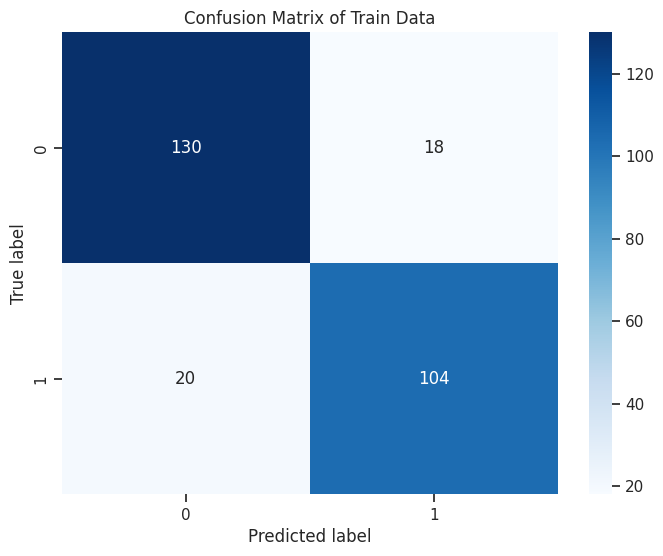

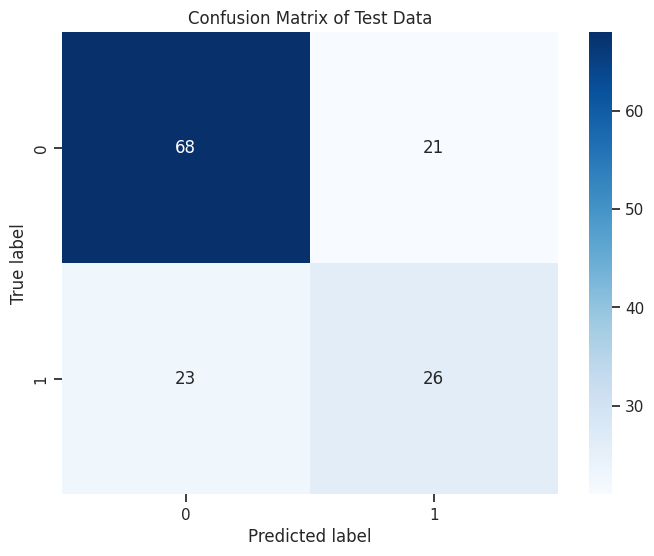

In [ ]:
#Import libraries
from sklearn.metrics import confusion_matrix
import matplotlib.pyplot as plt
import seaborn as sns

# Confusion Matrix for train dataset (imputed_df_train)
train_cm = confusion_matrix(imputed_df_train['MS'], y_train_pred)

# Confusion Matrix for test dataset (imputed_df_test)
test_cm = confusion_matrix(imputed_df_test['MS'], y_test_pred)

# Plot Confusion Matrix for train dataset
plt.figure(figsize=(8, 6))
sns.heatmap(train_cm, annot=True, cmap='Blues', fmt='g')
plt.title('Confusion Matrix of Train Data')
plt.xlabel('Predicted label')
plt.ylabel('True label')
plt.show()

# Plot Confusion Matrix for test dataset
plt.figure(figsize=(8, 6))
sns.heatmap(test_cm, annot=True, cmap='Blues', fmt='g')
plt.title('Confusion Matrix of Test Data')
plt.xlabel('Predicted label')
plt.ylabel('True label')
plt.show()



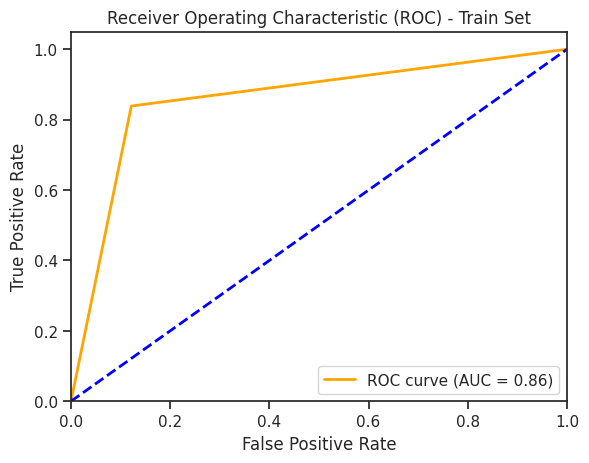

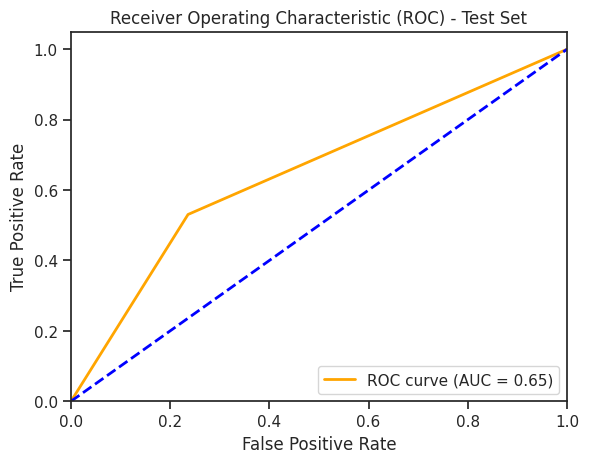

In [ ]:
import matplotlib.pyplot as plt
from sklearn.metrics import roc_curve, auc

# Map actual "YES" and "NO" values to 1 and 0 respectively
mapping = {1.0: 1, 0.0: 0}
y_train_mapped = [mapping[val] for val in imputed_df_train['MS']]
y_test_mapped = [mapping[val] for val in imputed_df_test['MS']]

# Map predicted "YES" and "NO" values to 1 and 0 respectively
y_train_pred_mapped = [mapping[val] for val in y_train_pred]
y_test_pred_mapped = [mapping[val] for val in y_test_pred]

# ROC curve and AUC for train data
fpr_train, tpr_train, thresholds_train = roc_curve(y_train_mapped, y_train_pred_mapped)
roc_auc_train = auc(fpr_train, tpr_train)

# ROC curve and AUC for test data
fpr_test, tpr_test, thresholds_test = roc_curve(y_test_mapped, y_test_pred_mapped)
roc_auc_test = auc(fpr_test, tpr_test)

# Plot ROC curve for train data
plt.figure()
plt.plot(fpr_train, tpr_train, color='orange', lw=2, label='ROC curve (AUC = %0.2f)' % roc_auc_train)
plt.plot([0, 1], [0, 1], color='blue', lw=2, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) - Train Set')
plt.legend(loc="lower right")

# Plot ROC curve for test data
plt.figure()
plt.plot(fpr_test, tpr_test, color='orange', lw=2, label='ROC curve (AUC = %0.2f)' % roc_auc_test)
plt.plot([0, 1], [0, 1], color='blue', lw=2, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) - Test Set')
plt.legend(loc="lower right")

plt.show()


##Calculating Feature Importances

Age: 0.09732
MRI spinal lesions: 0.58223
OCB + in CSF: 0.03304
BAEP +: 0.04251
Sex: 0.24490


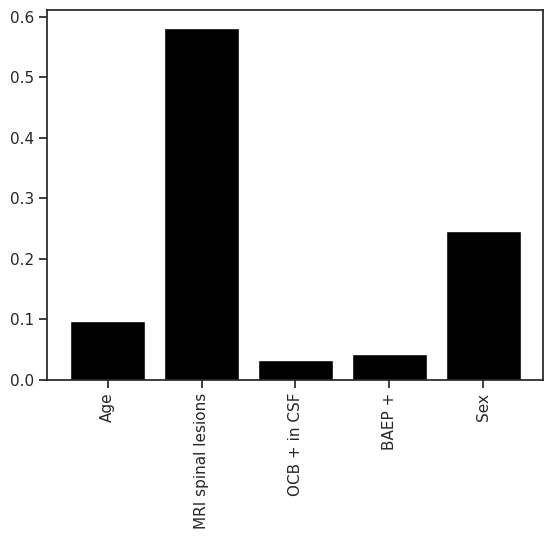

In [ ]:
importance = best_model.feature_importances_

#Summarise feature importance
for i, v in enumerate(importance):
    print('%s: %.5f' % (x_train.columns[i], v))

# Get feature names
feature_names = list(x_train.columns)

# Plot feature importances
plt.bar(feature_names, importance)
plt.xticks(rotation=90)
plt.show()


